In [56]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import cv2
import sklearn
import os
import os
import numpy as np
import concurrent.futures
from skimage.feature import hog
from skimage import exposure
from skimage.feature import local_binary_pattern
from sklearn.ensemble import IsolationForest
from sklearn.decomposition import PCA
from PIL import Image
import sys


os.environ['MOMAPS_HOME'] = '/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps'

sys.path.insert(1, os.getenv('MOMAPS_HOME'))
sys.path.insert(1, os.getenv("MOMAPS_HOME"))
print(f"MOMAPS_HOME: {os.getenv('MOMAPS_HOME')}")

from src.common.lib import image_metrics

%reload_ext autoreload
%autoreload 2
%aimport

%matplotlib inline

MOMAPS_HOME: /home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps
Modules to reload:
all-except-skipped

Modules to skip:



# Utils

In [57]:
# Load images
def get_npy_files(path):
    npy_files = []
    for root, dirs, files in os.walk(path):
        for file in files:
            if file.endswith('.npy'):
                npy_files.append(os.path.join(root, file))
    return npy_files

import skimage 

def rescale_intensity(img_current_channel):
    """Return image after stretching or shrinking its intensity levels.

    The desired intensity range of the input and output, in_range and out_range respectively, 
    are used to stretch or shrink the intensity range of the input image
    
    see: https://scikit-image.org/docs/stable/api/skimage.exposure.html#skimage.exposure.rescale_intensity
    
    Args:
        img_current_channel (numpy ndarray): the image to scale

    Returns:
        img_scaled (numpy ndarray): image in scale of [0,1] after rescaling
    """
    
    vmin, vmax = np.percentile(img_current_channel, q=(0.5, 99.9))
    img_scaled = skimage.exposure.rescale_intensity(
                                                    img_current_channel,
                                                    in_range=(vmin, vmax),
                                                    out_range=np.float32
        )
    return img_scaled

def get_metrics_processed(tile):
  metrics = ()
  for c in range(tile.shape[-1]):
    metrics += get_metrics(tile[...,c])
    
  return metrics

def get_metrics(tile, as_string=False):
    snr = image_metrics.calculate_snr(tile)
    # Check contrast & Sharpness
    sharpness_laplacian = image_metrics.calculate_image_sharpness_laplacian(tile)
    # contrast = image_metrics.calculate_image_contrast(tile)
    # Check var
    var = image_metrics.calculate_var(tile)
    # Check blurness:
    sharpness_brenner = image_metrics.calculate_image_sharpness_brenner(tile)    
    entropy = image_metrics.calculate_entropy(tile)
    sigma = image_metrics.calculate_sigma(tile)
    high_freq = image_metrics.calculate_high_freq_power(tile)
    # largest_area = calculate_largest_uniform_area(tile)
    # fractal_dim = calculate_fractal_dim(tile)
    # blur = image_metrics.calc_image_blur_effect(tile)
  
    if as_string:
          return f"SNR: {round(snr, 3)}, Sharpness Laplacian: {round(sharpness_laplacian, 3)}, Sharpness Brenner: {round(sharpness_brenner, 3)}, Variance: {var}, Entropy: {round(entropy, 3)}, Sigma: {round(sigma, 3)}, FFT freq: {round(high_freq, 3)}" 
  
    return snr,sharpness_laplacian,var,sharpness_brenner, entropy, sigma,high_freq #,largest_area
  

def get_metrics_columns():
  return ["Path", "Quality", "Target_SNR", "Target_Sharpness_Laplacian", "Target_Var",
           'Target_Sharpness_Brenner', "Target_Entropy", "Target_Sigma", "Target_HighFreq", "DAPI_SNR", "DAPI_Sharpness_Laplacian",
            "DAPI_Var", 'DAPI_Sharpness_Brenner', "DAPI_Entropy", "DAPI_Sigma", "DAPI_HighFreq"]


def run_dim_reduction(dim_red, images, labels=None, show=True):
  # Perform PCA
  images = images.reshape(images.shape[0], -1)
  reduced = dim_red.fit_transform(images)
  
  if not show:
    return reduced
  
  if labels is None:
    plt.scatter(reduced[:,0], reduced[:,1])
    plt.show()
    return reduced
  
  
  labels_unique = np.unique(labels)
  
  for l in labels_unique:
    indexes = labels == l
    plt.scatter(reduced[indexes,0], reduced[indexes,1], alpha=0.5)
  plt.legend(labels_unique)
  plt.show()
  
  return reduced 

def plot_images(images, vmin=0,vmax=1000):
    for i in range(len(images)):
        fig, ax = plt.subplots(1, 2)
        ax[0].imshow(images[i,...,0])#, vmin=vmin,vmax=vmax)
        ax[0].set_title("Target")
        ax[1].imshow(images[i,...,1])#, vmin=vmin,vmax=vmax)
        ax[1].set_title("Nucleus")
        plt.show()
        
def load_tiles(paths):
  paths_split = map(lambda x: (x.rsplit('_',1)[0], int(x.rsplit('_',1)[1])), paths.reshape(-1,))
  tiles = []
  for filename, tile_number in paths_split:
    t = np.load(filename)[tile_number, ...]
    tiles.append(t)
    
  tiles = np.stack(tiles)
  return tiles



def get_outliers(df, feature, split=False, iqrs=1.5):
    # Calculate Q1, Q3, and IQR
    Q1 = df[feature].quantile(0.25)
    Q3 = df[feature].quantile(0.75)
    IQR = Q3 - Q1
    
    lower = df[feature] < Q1 - iqrs* IQR
    higher = df[feature] > Q3 + iqrs*IQR
    if split:
        # Determine outliers using IQR
        outliers_lower = df[lower]
        outliers_higher = df[higher]
        return outliers_lower, outliers_higher
    
    # Determine outliers using IQR
    outliers = df[(lower ) | (higher)]
    
    return outliers



Nancy's Utils

In [227]:
d = '/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/'

def show_label(path):
    path_l = path.split("/")
    return path_l[-7:]
    
def show_processed_tif(path):
    # read the image stack
    img = cv2.imread(path, cv2.IMREAD_ANYDEPTH) 
    # remove frame 
    img = crop_frame(original_image=img)
    # rescale pixel intensities
    img = rescale_intensity(img)
    
    # show the image with grid 
    fig, ax = plt.subplots(figsize=(7,7))
    plt.imshow(img, cmap='gray')
    put_tiles_grid(image=img, ax=ax)
    plt.axis('off')
    plt.title(show_label(path), color='purple')
    print(get_metrics(img, True))
    plt.show()
    
def show_tile(site_path, tile_number, rescale_tile=False):
    # read the image stack
    img = cv2.imread(site_path, cv2.IMREAD_ANYDEPTH) 
    # remove frame 
    img = crop_frame(original_image=img)
    # rescale pixel intensities
    img = rescale_intensity(img)
    
    row_ind = tile_number // 10
    col_ind = tile_number % 10
    img = img[row_ind * 100 : (row_ind + 1) * 100, col_ind * 100 : (col_ind + 1) * 100]
    
    print(f"img shape: {np.asarray(img).shape}")
    
#     # Check dead cells?
#     img_uint8 = img.astype(np.uint8)
#     # Apply Gaussian blur
# #     gray_blurred = cv2.GaussianBlur(img_uint8, (9, 9), 0)

#     # Apply Hough Circle Transform
#     # Adjust the parameters, especially minRadius and maxRadius, to detect small circles
#     circles = cv2.HoughCircles(img_uint8, cv2.HOUGH_GRADIENT, 1, 20, param1=50, param2=30, minRadius=0, maxRadius=0)
   
    
    if rescale_tile:
        print("NOTICE! Rescaling also the tile!!!!!")
        img = rescale_intensity(img)
    
    fig, ax = plt.subplots(figsize=(7,7))
    plt.imshow(img, cmap='gray', vmin=0, vmax=1)
    
#     if circles is not None:
#         print(f"circles count: {len(circles)}")
#         circles = np.uint16(np.around(circles))
#         for i in circles[0, :]:
#             center = (i[0], i[1])  # circle center
#             radius = i[2]  # circle radius
#             cv2.circle(image, center, radius, (0, 255, 0), 2)
    
#     put_tiles_grid(image=img, ax=ax)
    plt.axis('off')
    plt.title(show_label(site_path), color='purple')
    print(get_metrics(img, True))
    plt.show()
    
def crop_frame(original_image):
    # Crop the image by removing a 12-pixel frame from each side
    cropped_image = original_image[12:1012, 12:1012]  
    return cropped_image

def crop_site_to_tiles(img):
    from skimage.util import view_as_blocks
    # Break the cropped image into 64 tiles of size 100x100
    tile_size = 100
    num_tiles = 64

    # Reshape the image into tiles using view_as_blocks from skimage
    tiles = view_as_blocks(img, block_shape=(tile_size, tile_size, 3))

    for i in range(8):
        for j in range(8):
            tile = tiles[i, j]
    return 

def put_tiles_grid(image, ax):
    # assumes 1000x1000 image
    import matplotlib.patches as patches

    # Add dashed grid lines for 64 blocks
    num_blocks = 10
    block_size = 100

    for i in range(1, num_blocks):
        # Draw horizontal dashed lines
        ax.plot([0, 1000], [i * block_size, i * block_size], linestyle='--', lw=1, alpha=0.5, color='pink')

        # Draw vertical dashed lines
        ax.plot([i * block_size, i * block_size], [0, 1000], linestyle='--', lw=1, alpha=0.5, color='pink')

    # Remove x and y axis labels
    ax.set_xticks([])
    ax.set_yticks([])

    # Add a title
    plt.title('Image with Dashed Grid of 64 Blocks')

    
    


In [228]:
def show_images(df, max_samples = 10):
    for ind, path in enumerate(df.Path.values):
        print(ind)
        if max_samples is not None and ind >= max_samples:
            print(f"Stopping at {ind}. There are {len(df.Path.values)} images in total")
            break
        
        # Target
        target_path = os.path.join(d, path)
        show_processed_tif(target_path)
        # His DAPI
        path_l = target_path.split("/")
        path_l[-2] = 'DAPI'
        
        file_name = path_l[-1].split("_")
        dapi_file_name = "_".join([file_name[0], 'w1confDAPI', file_name[-1]])
        dapi_file_name = "/".join([*path_l[:-1], dapi_file_name])
        print(dapi_file_name)

        show_processed_tif(dapi_file_name)
        print('--------------------------------')
        
def get_dapi_file_name(path):
    site_path, tile_number = path.rsplit('_',1)
    path_l = site_path.split("/")
    path_l[-2] = 'DAPI'

    file_name = path_l[-1].split("_")
    dapi_file_name = "_".join([file_name[0], 'w1confDAPI', file_name[-1]])
    dapi_file_name = "/".join([*path_l[:-1], f'{dapi_file_name}_{tile_number}'])
    
    return dapi_file_name
        
def show_tiles(df, max_samples=10, rescale_tile=False):
    for ind, path in enumerate(df.Path.values):
        site_path, tile_number = path.rsplit('_',1)
        tile_number = int(tile_number)
        print(ind)
        if max_samples is not None and ind >= max_samples:
            print(f"Stopping at {ind}. There are {len(df.Path.values)} images in total")
            break
        
        # Target
        show_tile(site_path, tile_number, rescale_tile)
        # His DAPI
        path_l = site_path.split("/")
        path_l[-2] = 'DAPI'
        
        file_name = path_l[-1].split("_")
        dapi_file_name = "_".join([file_name[0], 'w1confDAPI', file_name[-1]])
        dapi_file_name = "/".join([*path_l[:-1], dapi_file_name])
        print(dapi_file_name)

        show_tile(dapi_file_name, tile_number, rescale_tile)
        print('--------------------------------')
        
def save_to_mapping(mappings, marker, metric_name, low_threshold, high_threshold):
    mappings[marker] = {
        metric_name: {
            'low_threshold': low_threshold,
            'high_threshold': high_threshold
        }
    }
    
def processed_path_to_raw_paths(path):
    path_splited = path.split(os.sep)
    filename = path_splited[-1]
    filename_split = filename.split('_')
    rep = filename_split[0]
    panel = filename_split[4]
    line = filename_split[5]
    filename_new = '_'.join(filename_split[1:4])
    batch = path_splited[-5]
    batch = batch.split('_')[0]
    cond = path_splited[-3]
    marker = path_splited[-2]
    
    ret = os.path.join("/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk", batch, line, panel, cond, rep, marker, f'{filename_new}.tif')
    return ret

def raw_path_to_processed_path(path):
    path_splited = path.split(os.sep)
    filename = os.path.splitext(path_splited[-1])[0]
    rep = path_splited[-3]
    panel = path_splited[-5]
    line = path_splited[-6]
    batch = path_splited[-7]
    batch = f"{batch}_16bit_no_downsample"
    cond = path_splited[-4]
    marker = path_splited[-2]
    
    ret = os.path.join("/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/", batch, line, cond, marker, f'{rep}_{filename}_{panel}_{line}_processed.npy')
    return ret


# Data oriented

## Per raw site

Created by running /home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/src/runables/outlier_detection.py for all batches (3-9) per **site**

In [4]:
path = "/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/raw_metrics_all_batches_all_metrics.csv"#b7b8_metrics_for_outliers_with_rescaleInt.csv"
# path = "/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/raw_metrics.csv"
df = pd.read_csv(path).iloc[:,1:]
df

,Path,Target_SNR,Target_Sharpness_Laplacian,Target_Contrast,Target_Var,Target_Sharpness_Brenner,Target_Entropy,Target_Sigma,Target_HighFreq
0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,-1.386933,516.150200,1.0,0.011379,5484.5957,7.635134,0.012786,50.930807
1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,-1.152697,580.587438,1.0,0.010847,5712.2200,7.290663,0.014218,52.639237
2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,-1.073087,589.648937,1.0,0.012944,6660.5166,7.792630,0.013728,52.392984
3,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,-1.607560,460.286563,1.0,0.009601,4636.2583,7.352329,0.012308,50.260071
4,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,-0.977837,576.183144,1.0,0.011909,6162.9834,7.658213,0.013749,52.309758
...,...,...,...,...,...,...,...,...,...
253780,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,-0.776326,531.426744,1.0,0.014547,11007.9580,8.979335,0.011161,47.439879
253781,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,-2.695368,382.053482,1.0,0.011748,8642.7080,8.626475,0.008020,42.748911
253782,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,-4.100839,282.528022,1.0,0.011350,6917.0547,8.492393,0.006223,39.418827
253783,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,-2.155760,486.098773,1.0,0.012665,10775.3030,8.773028,0.009031,44.831937


In [5]:
df.insert(1, 'Batch_Rep', df.apply(lambda x: f"{x['Path'].split(os.sep)[-7]}_{x['Path'].split(os.sep)[-3]}", axis=1))
df.insert(1, 'CellLine', df.apply(lambda x: x['Path'].split(os.sep)[-6], axis=1))
# df.insert(1, 'Panel', df.apply(lambda x: x['Path'].split(os.sep)[-5], axis=1))
df.insert(1, 'Condition', df.apply(lambda x: x['Path'].split(os.sep)[-4], axis=1))
# df.insert(1, 'Rep', df.apply(lambda x: x['Path'].split(os.sep)[-3], axis=1))
df.insert(1, 'Marker', df.apply(lambda x: x['Path'].split(os.sep)[-2], axis=1))

df

,Path,Marker,Condition,CellLine,Batch_Rep,Target_SNR,Target_Sharpness_Laplacian,Target_Contrast,Target_Var,Target_Sharpness_Brenner,Target_Entropy,Target_Sigma,Target_HighFreq
0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7_rep1,-1.386933,516.150200,1.0,0.011379,5484.5957,7.635134,0.012786,50.930807
1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7_rep1,-1.152697,580.587438,1.0,0.010847,5712.2200,7.290663,0.014218,52.639237
2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7_rep1,-1.073087,589.648937,1.0,0.012944,6660.5166,7.792630,0.013728,52.392984
3,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7_rep1,-1.607560,460.286563,1.0,0.009601,4636.2583,7.352329,0.012308,50.260071
4,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7_rep1,-0.977837,576.183144,1.0,0.011909,6162.9834,7.658213,0.013749,52.309758
...,...,...,...,...,...,...,...,...,...,...,...,...,...
253780,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch6_rep2,-0.776326,531.426744,1.0,0.014547,11007.9580,8.979335,0.011161,47.439879
253781,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch6_rep2,-2.695368,382.053482,1.0,0.011748,8642.7080,8.626475,0.008020,42.748911
253782,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch6_rep2,-4.100839,282.528022,1.0,0.011350,6917.0547,8.492393,0.006223,39.418827
253783,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch6_rep2,-2.155760,486.098773,1.0,0.012665,10775.3030,8.773028,0.009031,44.831937


Boxplot per batch_rep per marker per metric

In [7]:
np.unique(df['Marker'])

array(['ANXA11', 'CD41', 'CLTC', 'Calreticulin', 'DCP1A', 'FMRP', 'FUS',
       'G3BP1', 'GM130', 'KIF5A', 'LAMP1', 'NCL', 'NEMO', 'NONO', 'PEX14',
       'PML', 'PSD95', 'PURA', 'Phalloidin', 'SCNA', 'SQSTM1', 'TDP43',
       'TIA1', 'TOMM20', 'mitotracker'], dtype=object)

In [ ]:
line = 'WT'
cond = 'Untreated'

markers = np.unique(df['Marker'])
batches_reps = np.unique(df['Batch_Rep'])
metrics = df.columns[df.columns.str.contains('Target')]
nrows, ncols = 2,4
figsize=(30,15)

for m in markers:
    fig, ax = plt.subplots(nrows,ncols, figsize=figsize)
    for i, metric in enumerate(metrics):
        # for batch in batches:
        df_filtered = df
        df_filtered = df_filtered.loc[(df['Marker'] == m) & (df['CellLine'] == line) & (df['Condition'] == cond)]
        df_filtered = df_filtered.sort_values('Batch_Rep', ascending=False)
        grouped_data = [group for _, group in df_filtered.groupby('Batch_Rep')[metric]]
        ax[i//ncols, i%ncols].boxplot(grouped_data, labels=df_filtered['Batch_Rep'].unique(), vert=False)
        ax[i//ncols, i%ncols].set_title(metric)
    plt.suptitle(m)
    plt.show()
    

## Per processed tile

In [3]:
cluster1_paths = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/outliers_paths_from_umap_per_type/cluster_1.npy")

# cluster1_tiles = load_tiles(cluster1_paths)
# cluster1_tiles.shape

In [4]:
df1 = pd.DataFrame(cluster1_paths, columns=['Path'])
df1.insert(1, 'Batch', df1.apply(lambda x: x['Path'].split(os.sep)[-5], axis=1))
df1.insert(1, 'Rep', df1.apply(lambda x: x['Path'].split(os.sep)[-1].split('_',1)[0], axis=1))
df1.insert(1, 'Batch_Rep', df1.apply(lambda x: '/'.join([x['Batch'], x['Rep']]), axis=1))
df1.insert(1, 'CellLine', df1.apply(lambda x: x['Path'].split(os.sep)[-4], axis=1))
df1.insert(1, 'Condition', df1.apply(lambda x: x['Path'].split(os.sep)[-3], axis=1))
# 1df.insert(1, 'Rep', df.apply(lambda x: x['Path'].split(os.sep)[-1].split('_',1)[0], axis=1))
df1.insert(1, 'Marker', df1.apply(lambda x: x['Path'].split(os.sep)[-2], axis=1))
df1.insert(1, 'RootFolder', df1.apply(lambda x: os.sep.join(x['Path'].split(os.sep)[:-1]), axis=1))
df1.insert(1, 'SitePath', df1.apply(lambda x: x['Path'].rsplit('_',1)[0], axis=1))
df1.insert(1, 'TileNumber', df1.apply(lambda x: int(x['Path'].rsplit('_',1)[1]), axis=1))
df1.insert(1, 'Cluster', 1)


# df = df.set_index('SitePath')
df1

,Path,Cluster,TileNumber,SitePath,RootFolder,Marker,Condition,CellLine,Batch_Rep,Rep,Batch
0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1,0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,FUS,Untreated,FUSHeterozygous,batch3_16bit_no_downsample/rep1,rep1,batch3_16bit_no_downsample
1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1,0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,FUS,Untreated,FUSHeterozygous,batch3_16bit_no_downsample/rep1,rep1,batch3_16bit_no_downsample
2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1,0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,FUS,Untreated,FUSHeterozygous,batch3_16bit_no_downsample/rep1,rep1,batch3_16bit_no_downsample
3,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1,2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,FUS,Untreated,FUSHeterozygous,batch3_16bit_no_downsample/rep1,rep1,batch3_16bit_no_downsample
4,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1,1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,FUS,Untreated,FUSHeterozygous,batch3_16bit_no_downsample/rep1,rep1,batch3_16bit_no_downsample
...,...,...,...,...,...,...,...,...,...,...,...
6077,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1,8,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,PURA,Untreated,WT,batch9_16bit_no_downsample/rep2,rep2,batch9_16bit_no_downsample
6078,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1,9,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,PURA,Untreated,WT,batch9_16bit_no_downsample/rep2,rep2,batch9_16bit_no_downsample
6079,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1,10,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,PURA,Untreated,WT,batch9_16bit_no_downsample/rep2,rep2,batch9_16bit_no_downsample
6080,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1,2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,PURA,Untreated,WT,batch9_16bit_no_downsample/rep2,rep2,batch9_16bit_no_downsample


In [5]:
cluster0_paths = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/outliers_paths_from_umap_per_type/cluster_0.npy")

df0 = pd.DataFrame(cluster0_paths, columns=['Path'])
df0.insert(1, 'Batch', df0.apply(lambda x: x['Path'].split(os.sep)[-5], axis=1))
df0.insert(1, 'Rep', df0.apply(lambda x: x['Path'].split(os.sep)[-1].split('_',1)[0], axis=1))
df0.insert(1, 'Batch_Rep', df0.apply(lambda x: '/'.join([x['Batch'], x['Rep']]), axis=1))
df0.insert(1, 'CellLine', df0.apply(lambda x: x['Path'].split(os.sep)[-4], axis=1))
df0.insert(1, 'Condition', df0.apply(lambda x: x['Path'].split(os.sep)[-3], axis=1))
# df.insert(1, 'Rep', df.apply(lambda x: x['Path'].split(os.sep)[-1].split('_',1)[0], axis=1))
df0.insert(1, 'Marker', df0.apply(lambda x: x['Path'].split(os.sep)[-2], axis=1))
df0.insert(1, 'RootFolder', df0.apply(lambda x: os.sep.join(x['Path'].split(os.sep)[:-1]), axis=1))
df0.insert(1, 'SitePath', df0.apply(lambda x: x['Path'].rsplit('_',1)[0], axis=1))
df0.insert(1, 'TileNumber', df0.apply(lambda x: int(x['Path'].rsplit('_',1)[1]), axis=1))
df0.insert(1, 'Cluster', 0)


# df = df.set_index('SitePath')
df0



,Path,Cluster,TileNumber,SitePath,RootFolder,Marker,Condition,CellLine,Batch_Rep,Rep,Batch
0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,0,0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,Calreticulin,Untreated,FUSHeterozygous,batch3_16bit_no_downsample/rep1,rep1,batch3_16bit_no_downsample
1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,0,0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,Calreticulin,Untreated,FUSHeterozygous,batch3_16bit_no_downsample/rep1,rep1,batch3_16bit_no_downsample
2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,0,0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,Calreticulin,Untreated,FUSHeterozygous,batch3_16bit_no_downsample/rep1,rep1,batch3_16bit_no_downsample
3,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,0,0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,Calreticulin,Untreated,FUSHeterozygous,batch3_16bit_no_downsample/rep1,rep1,batch3_16bit_no_downsample
4,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,0,0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,Calreticulin,Untreated,FUSHeterozygous,batch3_16bit_no_downsample/rep1,rep1,batch3_16bit_no_downsample
...,...,...,...,...,...,...,...,...,...,...,...
6195,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,0,2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,TDP43,Untreated,WT,batch9_16bit_no_downsample/rep1,rep1,batch9_16bit_no_downsample
6196,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,0,5,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,TDP43,Untreated,WT,batch9_16bit_no_downsample/rep1,rep1,batch9_16bit_no_downsample
6197,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,0,0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,TDP43,Untreated,WT,batch9_16bit_no_downsample/rep1,rep1,batch9_16bit_no_downsample
6198,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,0,3,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,TDP43,Untreated,WT,batch9_16bit_no_downsample/rep1,rep1,batch9_16bit_no_downsample


In [6]:
df = pd.concat([df1, df0])
df

,Path,Cluster,TileNumber,SitePath,RootFolder,Marker,Condition,CellLine,Batch_Rep,Rep,Batch
0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1,0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,FUS,Untreated,FUSHeterozygous,batch3_16bit_no_downsample/rep1,rep1,batch3_16bit_no_downsample
1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1,0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,FUS,Untreated,FUSHeterozygous,batch3_16bit_no_downsample/rep1,rep1,batch3_16bit_no_downsample
2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1,0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,FUS,Untreated,FUSHeterozygous,batch3_16bit_no_downsample/rep1,rep1,batch3_16bit_no_downsample
3,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1,2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,FUS,Untreated,FUSHeterozygous,batch3_16bit_no_downsample/rep1,rep1,batch3_16bit_no_downsample
4,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1,1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,FUS,Untreated,FUSHeterozygous,batch3_16bit_no_downsample/rep1,rep1,batch3_16bit_no_downsample
...,...,...,...,...,...,...,...,...,...,...,...
6195,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,0,2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,TDP43,Untreated,WT,batch9_16bit_no_downsample/rep1,rep1,batch9_16bit_no_downsample
6196,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,0,5,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,TDP43,Untreated,WT,batch9_16bit_no_downsample/rep1,rep1,batch9_16bit_no_downsample
6197,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,0,0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,TDP43,Untreated,WT,batch9_16bit_no_downsample/rep1,rep1,batch9_16bit_no_downsample
6198,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,0,3,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,TDP43,Untreated,WT,batch9_16bit_no_downsample/rep1,rep1,batch9_16bit_no_downsample


In [7]:
df['RootFolder'].value_counts()

RootFolder
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch4_16bit_no_downsample/OPTN/Untreated/FMRP               729
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch5_16bit_no_downsample/OPTN/Untreated/PURA               386
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch4_16bit_no_downsample/WT/Untreated/FMRP                 365
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch5_16bit_no_downsample/OPTN/Untreated/KIF5A              354
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch4_16bit_no_downsample/FUSHomozygous/Untreated/FMRP      320
                                                                                                                                                  ... 
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDi

In [8]:
print(df['Batch_Rep'].value_counts())
print()
print(df['Marker'].value_counts())
print()
print(df['CellLine'].value_counts())


Batch_Rep
batch4_16bit_no_downsample/rep2    2138
batch5_16bit_no_downsample/rep1    2043
batch3_16bit_no_downsample/rep2    1613
batch4_16bit_no_downsample/rep1    1530
batch6_16bit_no_downsample/rep1    1231
batch3_16bit_no_downsample/rep1    1126
batch6_16bit_no_downsample/rep2     963
batch9_16bit_no_downsample/rep2     602
batch5_16bit_no_downsample/rep2     528
batch9_16bit_no_downsample/rep1     508
Name: count, dtype: int64

Marker
PURA            2638
FMRP            2080
KIF5A           1562
FUS             1370
NCL             1329
ANXA11           889
G3BP1            636
TDP43            490
NONO             287
SQSTM1           246
CLTC             217
CD41             126
PML              125
PEX14             70
mitotracker       70
GM130             63
PSD95             41
Phalloidin        21
TOMM20            13
Calreticulin       9
Name: count, dtype: int64

CellLine
OPTN               2679
WT                 2614
FUSHomozygous      2010
FUSRevertant       1858
TBK1

In [23]:
df.loc[df['RootFolder'].isin(df['RootFolder'].value_counts().index[-2:]), 'Cluster'].value_counts()

Cluster
0    4
Name: count, dtype: int64

In [ ]:

def get_metrics_rows(files, status):
    m = []
    for f in files:
        site = np.load(f)
        for i in range(site.shape[0]):            
            t = site[[i],...]
            m.append((f"{f}_{i}", status,) + get_metrics_processed(t))
    return m

cluster_number_to_save = 0
folder_to_load = df['RootFolder'].value_counts().index[-10:] # using value_counts and not unique in order to save the order of prevalence
good_tiles_metrics = []
outliers_tiles_metrics = []
cols = get_metrics_columns()
sites_analized = []

for k, folder in enumerate(folder_to_load):
    folder_label = os.sep.join(folder.split(os.sep)[-4:])
    print(f"{folder_label}")
    
    files = np.asarray([os.path.join(folder, filename) for filename in os.listdir(folder) if os.path.splitext(filename)[1] == '.npy'])
    
    folder_outliers_sites_paths = df.loc[df['SitePath'].isin(files)]
    
    if len(folder_outliers_sites_paths) == 0:
        # The site is entirely fine
        entirely_good_sites_metrics = get_metrics_rows(files, 'Good')
        print(f"All good len: {len(entirely_good_sites_metrics)}")
        good_tiles_metrics.extend(entirely_good_sites_metrics)
        continue
    
    # If contains outlier tiles
    # Append the good sites (without bad tiles at all)
    entirely_good_sites_paths = files[~np.isin(files, folder_outliers_sites_paths['SitePath'])]
    print(f"Entirely good sites: {len(entirely_good_sites_paths)}; #outlier tiles for this label: {len(folder_outliers_sites_paths)}")
    entirely_good_sites_metrics = get_metrics_rows(entirely_good_sites_paths, 'Good')
    good_tiles_metrics.extend(entirely_good_sites_metrics)
    
    print("Checking outliers...")
    
    grouped = folder_outliers_sites_paths.groupby('SitePath')
    # Extract the outliers tiles to a different array
    for i, val in enumerate(folder_outliers_sites_paths.iterrows()):
        ind, row = val
        print(f"({k}/{len(folder_to_load)}) {i}/{len(folder_outliers_sites_paths)} {row['SitePath']} {row['TileNumber']}")
        site_tiles = np.load(row['SitePath'])
        outleir_tiles_number = row['TileNumber']#.values
        # Separate good and bad tiles
        folder_outliers_tiles = site_tiles[[outleir_tiles_number],...]
        # print(row[['Cluster', 'TileNumber']])
        # Log only for cluster1
        print(row['Cluster'])
        if row['Cluster'] == cluster_number_to_save:
            outliers_tiles_metrics.append((row['Path'], 'Outlier') + get_metrics_processed(folder_outliers_tiles))
        
        
        if row['SitePath'] not in sites_analized:
            outleir_tiles_number_all_site_appearances = grouped.get_group(row['SitePath'])['TileNumber'].values
            only_good_tiles_indexes = np.delete(np.arange(len(site_tiles)), outleir_tiles_number_all_site_appearances, axis=0)
            sites_analized += row['SitePath']
            for j in only_good_tiles_indexes:
                good_tiles_metrics.append((f"{row['SitePath']}_{j}", 'Good') + get_metrics_processed(site_tiles[[j],...]))
        
    
good_tiles_metrics = pd.DataFrame(good_tiles_metrics, columns=cols)
outliers_tiles_metrics = pd.DataFrame(outliers_tiles_metrics, columns=cols)
print(good_tiles_metrics.shape, outliers_tiles_metrics.shape)

tiles_metrics = pd.concat([good_tiles_metrics, outliers_tiles_metrics])
tiles_metrics = tiles_metrics.drop_duplicates()
# Save sitepath as column
tiles_metrics.insert(2, 'SitePath', tiles_metrics['Path'].apply(lambda x: os.sep.join(x.rsplit('_',1)[0].split(os.sep)[-5:-1])))
print(tiles_metrics.shape)

In [69]:
# Scale to be able to show all metrics on the same boxplot

from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
tiles_metrics_scaled = tiles_metrics.copy()
tiles_metrics_scaled.iloc[:,3:] = scaler.fit_transform(tiles_metrics_scaled.iloc[:,3:])
tiles_metrics_scaled



,Path,Quality,SitePath,Target_SNR,Target_Sharpness_Laplacian,Target_Var,Target_Sharpness_Brenner,Target_Entropy,Target_Sigma,Target_HighFreq,DAPI_SNR,DAPI_Sharpness_Laplacian,DAPI_Var,DAPI_Sharpness_Brenner,DAPI_Entropy,DAPI_Sigma,DAPI_HighFreq
0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,Good,batch6_16bit_no_downsample/OPTN/Untreated/PURA,0.351982,0.042017,0.068439,0.072361,1.000000,2.254213e-18,0.561897,0.242349,0.003038,0.020507,0.014805,1.0,3.018153e-19,0.261745
1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,Good,batch6_16bit_no_downsample/OPTN/Untreated/PURA,0.461720,0.065916,0.070436,0.097769,1.000000,3.710724e-18,0.651115,0.372657,0.017309,0.106425,0.072105,1.0,6.848671e-19,0.481815
2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,Good,batch6_16bit_no_downsample/OPTN/Untreated/PURA,0.339263,0.116991,0.191873,0.177020,0.999172,2.909682e-18,0.707286,0.273850,0.018522,0.090168,0.061079,1.0,3.368201e-19,0.459269
3,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,Good,batch6_16bit_no_downsample/OPTN/Untreated/PURA,0.427644,0.086292,0.099446,0.123052,1.000000,3.219629e-18,0.669304,0.344845,0.017490,0.107799,0.063375,1.0,5.347942e-19,0.484585
4,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,Good,batch6_16bit_no_downsample/OPTN/Untreated/PURA,0.440848,0.286759,0.385716,0.468700,1.000000,7.109017e-18,0.850858,0.419035,0.064152,0.328378,0.269725,1.0,1.320296e-18,0.702716
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,Outlier,batch9_16bit_no_downsample/FUSRevertant/Untrea...,0.502815,0.061708,0.052033,0.063881,1.000000,4.354833e-18,0.637965,0.332254,0.007310,0.034813,0.016778,1.0,1.130133e-18,0.384512
46,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,Outlier,batch4_16bit_no_downsample/OPTN/Untreated/G3BP1,0.575343,0.100854,0.058528,0.129395,1.000000,6.216062e-18,0.696349,0.308099,0.050537,0.131538,0.176876,1.0,6.719354e-19,0.630636
47,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,Outlier,batch4_16bit_no_downsample/OPTN/Untreated/G3BP1,0.574806,0.068942,0.047410,0.062352,1.000000,5.599260e-18,0.629012,0.253182,0.005859,0.036012,0.035166,1.0,5.399400e-19,0.351213
48,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,Outlier,batch4_16bit_no_downsample/OPTN/Untreated/G3BP1,0.859004,0.038719,0.003613,0.016459,1.000000,4.772458e-18,0.524893,0.256974,0.004234,0.013628,0.017371,1.0,5.756308e-19,0.323795


In [27]:
# good_tiles_metrics[good_tiles_metrics['Path'] == good_tiles_metrics['Path'].value_counts().index[0]]
tiles_metrics['Path'].value_counts()

Path
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch6_16bit_no_downsample/OPTN/Untreated/PURA/rep2_R11_w4confGFP_s743_panelA_OPTN_processed.npy_0                          1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch9_16bit_no_downsample/FUSRevertant/Untreated/KIF5A/rep1_R11_w2confmCherry_s1413_panelA_FUSRevertant_processed.npy_5    1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch9_16bit_no_downsample/FUSRevertant/Untreated/KIF5A/rep2_R11_w2confmCherry_s1586_panelA_FUSRevertant_processed.npy_4    1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch9_16bit_no_downsample/FUSRevertant/Untreated/KIF5A/rep2_R11_w2confmCherry_s1586_panelA_FUSRevertant_processed.npy_5    1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch9_16bit_no_downsample/FUSRevertant/Untreated/KIF5A/rep2_

In [ ]:
# Print images of outliers from cluster (df)
n_samples = 30
step = 10
for j in range(0,n_samples,step):
    outliers_tiles_to_show_paths = tiles_metrics_scaled.loc[tiles_metrics_scaled['Quality'] == 'Outlier', 'Path'].iloc[j:j+step].values
    fig, ax = plt.subplots(2, step, figsize=(20,8))
    for i, path in enumerate(outliers_tiles_to_show_paths):
        site_path, tile_number = path.rsplit('_',1)
        print(i, path)
        tile_number = int(tile_number)
        tile = np.load(site_path)[tile_number,...]
        metric_target = get_metrics(tile[...,0])
        metric_nucleus = get_metrics(tile[...,1])
        snr_target, var_target = round(metric_target[0],3), round(metric_target[2],3)
        snr_nucleus, var_nucleus = round(metric_nucleus[0],3), round(metric_nucleus[2],3)
        ax[0,i].imshow(tile[...,0], vmin=0, vmax=1, cmap='gray')
        ax[0,i].set_title(f"{i} {site_path.split(os.sep)[-2]}\nSNR={snr_target}\nVar={var_target}")
        ax[1,i].imshow(tile[...,1], vmin=0, vmax=1, cmap='gray')
        ax[1,i].set_title(f"DAPI\nDAPI_SNR={snr_nucleus}\nVar={var_nucleus}")
        ax[0,i].axis('off')
        ax[1,i].axis('off')
    plt.show()

In [ ]:
# Plot boxplot + outliers
def plot_outliers(ax, df, feature, outliers):
    feature_number = np.where(df.columns == feature)[0][0] + 1
    ax.scatter(outliers[feature], [feature_number]*len(outliers), color=['orange']*len(outliers), alpha=[0.5]*len(outliers))


site_paths = np.unique(tiles_metrics.loc[tiles_metrics['Path'].str.contains('mitotracker'),'SitePath'])

for s in site_paths:
    metrics = tiles_metrics.loc[tiles_metrics['SitePath'] == s]#tiles_metrics_scaled.loc[tiles_metrics_scaled['SitePath'] == s]
    for feature in ["Target_SNR", "Target_Var", "DAPI_SNR", "DAPI_Var"]:#metrics.columns[3:]:
        ax = metrics.loc[metrics['Quality'] == 'Good',[feature]].boxplot(vert=False, showfliers=False, patch_artist=True)
        ax.set_title(s)
        plot_outliers(ax, metrics.loc[:,[feature]], feature, metrics[metrics['Quality'] == 'Outlier'])
        plt.show()

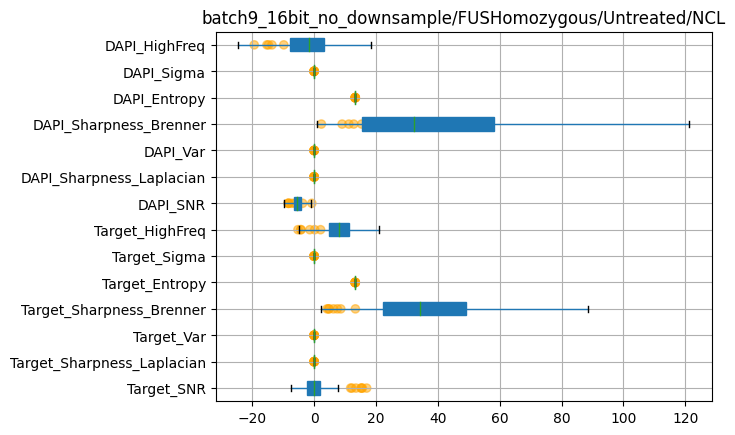

In [73]:
# # Plot boxplot + outliers
# def plot_outliers(ax, df, feature, outliers):
#     feature_number = np.where(df.columns == feature)[0][0] + 1
#     ax.scatter(outliers[feature], [feature_number]*len(outliers), color=['orange']*len(outliers), alpha=[0.5]*len(outliers))


# site_paths = np.unique(tiles_metrics_scaled['SitePath'])

# for s in site_paths:
#     metrics = tiles_metrics_scaled.loc[tiles_metrics_scaled['SitePath'] == s]
#     ax = metrics.loc[metrics['Quality'] == 'Good'].iloc[:,3:].boxplot(vert=False, showfliers=False, patch_artist=True)

#     ax.set_title(s)
#     for feature in metrics.columns[3:]:
#         plot_outliers(ax, metrics.iloc[:,3:], feature, metrics[metrics['Quality'] == 'Outlier'])
#     plt.show()

In [ ]:
# Plot boxplot of exrtrem values (regardless of quality value (good/outlier))

site_paths = np.unique(tiles_metrics_scaled['SitePath'])

for s in site_paths:
    metrics = tiles_metrics_scaled.loc[tiles_metrics_scaled['SitePath'] == s]
    ax = metrics.loc[metrics['Quality'] == 'Good'].iloc[:,3:].boxplot(vert=False, showfliers=False, patch_artist=True)
    
    ax.set_title(s)
    for feature in metrics.columns[3:]:
        plot_outliers(ax, metrics.iloc[:,3:], feature, get_outliers(metrics.iloc[:,3:], feature))
    plt.show()

In [ ]:
# Print images of extreme values per metrics
n_samples = 5
site_paths = np.unique(tiles_metrics_scaled['SitePath'])

for s in site_paths:
    metrics = tiles_metrics_scaled.loc[tiles_metrics_scaled['SitePath'] == s]
    for feature in metrics.columns[3:]:
        outliers_tiles_to_show = get_outliers(metrics, feature, split=False, iqrs=1.5)
        
        fig, ax = plt.subplots(2, n_samples, figsize=(10,8))
        fig.suptitle(f"{s} {feature}")
        outliers_tiles_to_show_paths = outliers_tiles_to_show.iloc[:n_samples]
        for i, (ind, row) in enumerate(outliers_tiles_to_show_paths.iterrows()):
            site_path, tile_number = row['Path'].rsplit('_',1)
            if not site_path.endswith('.npy'):
                print(f"error: {site_path}")
                continue
            tile_number = int(tile_number)
            tile = np.load(site_path)[tile_number,...]
            ax[0,i].imshow(tile[...,0], vmin=0, vmax=1, cmap='gray')
            ax_title = str(round(row[feature], 5))
            if row['Quality'] == 'Outlier':
                ax_title += '\nOutlier'
            ax[0,i].set_title(ax_title)
            ax[1,i].imshow(tile[...,1], vmin=0, vmax=1, cmap='gray')
            ax[0,i].axis('off')
            ax[1,i].axis('off')
        plt.show()

## On saved raw metrics

### Sites

#### old file

In [ ]:
sites_metrics = pd.read_csv("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/raw_metrics_all_batches_all_metrics.csv")
sites_metrics9 = pd.read_csv("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/raw_metrics_all_batches_all_metrics_b9.csv")
sites_metrics = pd.concat([sites_metrics, sites_metrics9])
sites_metrics

In [9]:
sites_metrics_copy = sites_metrics.copy()
sites_metrics_copy.drop(columns=['Unnamed: 0'], inplace=True)
sites_metrics_copy.insert(1, 'Batch', sites_metrics_copy.apply(lambda x: x['Path'].split(os.sep)[-7], axis=1))
sites_metrics_copy.insert(1, 'Rep', sites_metrics_copy.apply(lambda x: x['Path'].split(os.sep)[-3].split('_',1)[0], axis=1))
sites_metrics_copy.insert(1, 'Batch_Rep', sites_metrics_copy.apply(lambda x: '/'.join([x['Batch'], x['Rep']]), axis=1))
sites_metrics_copy.insert(1, 'CellLine', sites_metrics_copy.apply(lambda x: x['Path'].split(os.sep)[-6], axis=1))
sites_metrics_copy.insert(1, 'Condition', sites_metrics_copy.apply(lambda x: x['Path'].split(os.sep)[-4], axis=1))
sites_metrics_copy.insert(1, 'Marker', sites_metrics_copy.apply(lambda x: x['Path'].split(os.sep)[-2], axis=1))
sites_metrics_copy.insert(1, 'RootFolder', sites_metrics_copy.apply(lambda x: os.sep.join(x['Path'].split(os.sep)[:-1]), axis=1))

sites_metrics_copy


,Path,RootFolder,Marker,Condition,CellLine,Batch_Rep,Rep,Batch,Target_SNR,Target_Sharpness_Laplacian,Target_Contrast,Target_Var,Target_Sharpness_Brenner,Target_Entropy,Target_Sigma,Target_HighFreq
0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,-1.386933,516.150200,1.0,0.011379,5484.5957,7.635134,0.012786,50.930807
1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,-1.152697,580.587438,1.0,0.010847,5712.2200,7.290663,0.014218,52.639237
2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,-1.073087,589.648937,1.0,0.012944,6660.5166,7.792630,0.013728,52.392984
3,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,-1.607560,460.286563,1.0,0.009601,4636.2583,7.352329,0.012308,50.260071
4,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,-0.977837,576.183144,1.0,0.011909,6162.9834,7.658213,0.013749,52.309758
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64795,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,-1.555440,546.862192,1.0,0.012588,9344.3640,8.196981,0.011930,49.109389
64796,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,-1.910234,413.879616,1.0,0.009363,6185.1370,7.718066,0.011252,47.724813
64797,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,-2.181282,466.575093,1.0,0.012618,8075.4976,8.178387,0.010951,47.559053
64798,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,-1.502477,531.957564,1.0,0.012219,8705.3890,8.133886,0.012253,49.199013


In [15]:
sites_metrics_copy['Path'].values[0]

'/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch7/FUSHeterozygous/panelD/Untreated/rep1/CLTC/R11_w2confmCherry_s1293.tif'

In [16]:
'/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch3_16bit_no_downsample/FUSHeterozygous/Untreated/Calreticulin/rep1_R11_w2confCy5_s636_panelI_FUSHeterozygous_processed.npy'

'/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch3_16bit_no_downsample/FUSHeterozygous/Untreated/Calreticulin/rep1_R11_w2confCy5_s636_panelI_FUSHeterozygous_processed.npy'

In [29]:
def processed_path_to_raw_paths(path):
    path_splited = path.split(os.sep)
    filename = path_splited[-1]
    filename_split = filename.split('_')
    rep = filename_split[0]
    panel = filename_split[4]
    line = filename_split[5]
    filename_new = '_'.join(filename_split[1:4])
    batch = path_splited[-5]
    batch = batch.split('_')[0]
    cond = path_splited[-3]
    marker = path_splited[-2]
    
    ret = os.path.join("/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk", batch, line, panel, cond, rep, marker, f'{filename_new}.tif')
    return ret

In [37]:
sites_metrics_copy.loc[(sites_metrics_copy['Target_Sharpness_Brenner']>44000) | (sites_metrics_copy['Target_Sharpness_Brenner']<800),'Path'].values

array(['/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch7/FUSHeterozygous/panelJ/Untreated/rep1/TIA1/R11_w2confmCherry_s601.tif',
       '/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch7/FUSHeterozygous/panelJ/Untreated/rep1/TIA1/R11_w2confmCherry_s673.tif',
       '/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch7/FUSHeterozygous/panelI/Untreated/rep1/LAMP1/R11_w2confmCherry_s470.tif',
       ...,
       '/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch9/WT/panelK/stress/rep1/DAPI/R11_w1confDAPI_s91.tif',
       '/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch9/WT/panelK/stress/rep1/DAPI/R11_w1confDAPI_s88.tif',
       '/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch9/WT/panelK/stress/rep1/DAPI/R11_w1confDAPI_s63.tif'],
      dtype=object)

In [59]:
from collections import Counter
counts1 = Counter(cluster0_paths_site_paths_raw)
counts2 = Counter(sites_metrics_copy.loc[(sites_metrics_copy['Target_Sharpness_Brenner']>=44830) | (sites_metrics_copy['Target_Sharpness_Brenner']<=800),'Path'].values)
intersection = counts1 & counts2

sum(intersection.values()) * 100.0 / len(cluster0_paths_site_paths_raw)

1.096774193548387

In [55]:
len(sites_metrics_copy.loc[(sites_metrics_copy['Target_Sharpness_Brenner']>=44830) | (sites_metrics_copy['Target_Sharpness_Brenner']<=800),'Path'].values) *100.0 / len(sites_metrics_copy)

1.751181003499851

In [52]:
cluster0_paths = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/outliers_paths_from_umap_per_type/cluster_0.npy")
cluster0_paths_site_paths = np.asarray([p.rsplit('_',1)[0] for p in cluster0_paths.reshape(-1,)])
cluster0_paths_site_paths_raw = list(map(processed_path_to_raw_paths, cluster0_paths_site_paths))
cluster0_paths_site_paths_raw

len(set(sites_metrics_copy.loc[(sites_metrics_copy['Target_Sharpness_Brenner']>44830) | (sites_metrics_copy['Target_Sharpness_Brenner']<800),'Path'].values).intersection(set(cluster0_paths_site_paths_raw))) * 100.0 / len(set(cluster0_paths_site_paths_raw))


1.603395425607168

In [31]:
cluster0_paths_site_paths_raw[0], sites_metrics_copy['Path'].values[0]

('/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch3/FUSHeterozygous/panelI/Untreated/rep1/Calreticulin/R11_w2confCy5_s636.tif',
 '/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch7/FUSHeterozygous/panelD/Untreated/rep1/CLTC/R11_w2confmCherry_s1293.tif')

In [14]:
# MinMaxScale features to be able to show them all on the same boxplot


from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
sites_metrics_copy_scaled = sites_metrics_copy.copy()
sites_metrics_copy_scaled.iloc[:,8:] = scaler.fit_transform(sites_metrics_copy_scaled.iloc[:,8:])
sites_metrics_copy_scaled



,Path,RootFolder,Marker,Condition,CellLine,Batch_Rep,Rep,Batch,Target_SNR,Target_Sharpness_Laplacian,Target_Contrast,Target_Var,Target_Sharpness_Brenner,Target_Entropy,Target_Sigma,Target_HighFreq
0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,0.671208,0.023492,0.0,0.219973,0.077610,0.308617,0.100228,0.618206
1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,0.678661,0.026445,0.0,0.208586,0.080905,0.252232,0.111661,0.634458
2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,0.681194,0.026860,0.0,0.253473,0.094636,0.334397,0.107751,0.632115
3,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,0.664188,0.020932,0.0,0.181940,0.065327,0.262326,0.096413,0.611825
4,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,0.684225,0.026243,0.0,0.231319,0.087432,0.312395,0.107918,0.631323
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64795,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,0.665847,0.024899,0.0,0.245849,0.133495,0.400584,0.093391,0.600879
64796,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,0.654558,0.018805,0.0,0.176835,0.087753,0.322192,0.087979,0.587708
64797,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,0.645934,0.021220,0.0,0.246483,0.115123,0.397540,0.085573,0.586131
64798,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,0.667532,0.024216,0.0,0.237948,0.124243,0.390256,0.095971,0.601732


In [ ]:
# Plot boxplot + outliers
def plot_outliers(ax, df, feature, outliers):
    feature_number = np.where(df.columns == feature)[0][0] + 1
    ax.scatter(outliers[feature], [feature_number]*len(outliers), color=['orange']*len(outliers), alpha=[0.5]*len(outliers))


n_samples = 5
root_paths = np.unique(sites_metrics_copy_scaled['RootFolder'])
root_paths = root_paths[:n_samples]

for s in root_paths:
    cols = ["Target_SNR","Target_Var"] #metrics.columns[8:]
    metrics = sites_metrics_copy_scaled.loc[sites_metrics_copy_scaled['RootFolder'] == s]
    ax = metrics.loc[:,cols].boxplot(vert=False, showfliers=False, patch_artist=True)
    
    ax.set_title(s)
    for feature in cols:
        outliers_below, outliers_above = get_outliers(metrics, feature, True, 1.5)
        if len(outliers_below) > 0 or len(outliers_above) > 0:
            plot_outliers(ax, metrics.loc[:,cols], feature, pd.concat([outliers_below,  outliers_above]))
            
    plt.show()

#### new file

In [75]:
df = pd.read_csv("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/raw_metrics_all_batches_all_metrics_site_fix.csv")
df

,Path,RootFolder,Marker,Condition,CellLine,Batch_Rep,Rep,Batch,Target_SNR,Target_Sharpness_Laplacian,Target_Var,Target_Sharpness_Brenner,Target_Entropy,Target_Sigma,Target_HighFreq
0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,0.850756,0.008628,0.011907,5868.4023,7.468317,0.013629,52.320055
1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,0.953252,0.011355,0.013362,7576.9150,7.561110,0.016215,55.235707
2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,0.923778,0.010157,0.012464,6877.3916,7.507316,0.015318,54.116606
3,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,0.848088,0.007071,0.010218,4901.5420,7.495473,0.012316,50.125424
4,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,0.852414,0.007766,0.010769,5399.5625,7.513944,0.012947,51.157262
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
431838,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,0.714661,0.005919,0.010440,6417.3070,7.700074,0.010245,46.264940
431839,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,0.727502,0.006504,0.013022,7909.5280,8.130622,0.009898,46.320257
431840,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,1.033643,0.012032,0.014817,12085.6010,8.424665,0.016233,53.744809
431841,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,0.841155,0.008018,0.012219,8705.3890,8.133886,0.012253,49.199013


In [ ]:
#df['Target_Sharpness_Brenner'].describe(percentiles=[.01, .5, .99])
markers = df['Marker'].unique()
for m in markers:
    print(f"\n Marker: {m}")
    print(df.loc[df['Marker']==m, 'Target_Sharpness_Brenner'].describe(percentiles=[.01,.99]))

In [ ]:
df.loc[df['Target_Sharpness_Brenner']<=500, ['Batch', 'Marker', 'CellLine', 'Target_Sharpness_Brenner']].groupby(['Batch', 'Marker', 'CellLine']).count()

In [ ]:
df.loc[df['Target_Sharpness_Brenner']>=41000, ['Marker', 'CellLine', 'Target_Sharpness_Brenner']].groupby(['Marker', 'CellLine']).count()

---

In [7]:
df.columns

Index(['Path', 'RootFolder', 'Marker', 'Condition', 'CellLine', 'Batch_Rep',
       'Rep', 'Batch', 'Target_SNR', 'Target_Sharpness_Laplacian',
       'Target_Var', 'Target_Sharpness_Brenner', 'Target_Entropy',
       'Target_Sigma', 'Target_HighFreq'],
      dtype='object')

In [9]:
mappings = {}

In [10]:
all_markers = df['Marker'].unique()
print(len(all_markers))
all_markers

26


array(['CLTC', 'DAPI', 'PSD95', 'FMRP', 'Phalloidin', 'SQSTM1', 'CD41',
       'NONO', 'TDP43', 'TIA1', 'Calreticulin', 'LAMP1', 'ANXA11', 'SCNA',
       'G3BP1', 'KIF5A', 'PURA', 'FUS', 'NCL', 'GM130', 'TOMM20', 'DCP1A',
       'NEMO', 'PEX14', 'PML', 'mitotracker'], dtype=object)

In [11]:
counts = df['Marker'].value_counts()

In [12]:
mappings

{}

In [236]:
mappings

{'CLTC': {'Target_Sharpness_Brenner': {'low_threshold': 1500,
   'high_threshold': 20000}},
 'DAPI': {'Target_Sharpness_Brenner': {'low_threshold': 200,
   'high_threshold': 7500}},
 'PSD95': {'Target_Sharpness_Brenner': {'low_threshold': 9771,
   'high_threshold': 35041}},
 'FMRP': {'Target_Sharpness_Brenner': {'low_threshold': 1500,
   'high_threshold': 10000}},
 'Phalloidin': {'Target_Sharpness_Brenner': {'low_threshold': 1702,
   'high_threshold': 16000}},
 'SQSTM1': {'Target_Sharpness_Brenner': {'low_threshold': 2870,
   'high_threshold': 17930}},
 'CD41': {'Target_Sharpness_Brenner': {'low_threshold': 4962,
   'high_threshold': 20000}},
 'NONO': {'Target_Sharpness_Brenner': {'low_threshold': None,
   'high_threshold': 10000}},
 'TDP43': {'Target_Sharpness_Brenner': {'low_threshold': 823,
   'high_threshold': 14039}},
 'TIA1': {'Target_Sharpness_Brenner': {'low_threshold': 823,
   'high_threshold': 14039}},
 'Calreticulin': {'Target_Sharpness_Brenner': {'low_threshold': 2000,
   '

In [26]:
percentiles_to_describe=[0,.003,0.005,0.01,0.02,0.03,0.04,0.05,.06,0.07,.08,.09,0.1,.11,.12,.13,.14,.15,.16,.17,.18,.19,.20,.28,.29,.3,.31,.32,.33,.5,.51,.60,.61,.62,.63,.64,.65,.66,.67,.68,.69,.70,.71,.72,.73,.75,.76,.77,.78,.79,.80,.81,.85,.86,.87,.88,.89,.90,.91,.92,.93,.94,.95,.955,.96,.965,.97,.975, .98,.985,.99,1]
marker = 'mitotracker'
metric_name = 'Target_Sharpness_Brenner'
percentiles = df.loc[df['Marker']==marker, metric_name].describe(percentiles=percentiles_to_describe)

per = 100
low_threshold = percentiles[f'{per}%'] # for cellular debris
high_threshold = 20000#percentiles[f'{per}%'] # for out of focus
max_samples = 10

print(marker, metric_name, low_threshold, high_threshold, f'({per}%)')
print()
print(marker, '\n', percentiles)


# c = (df[metric_name]<=low_threshold) & (df[metric_name]>=percentiles[f'{per-1}%'])  
c = (df[metric_name]>=high_threshold)# & (df[metric_name]<=percentiles[f'{per+1}%'] )

tmp = df[c]
# print(tmp.shape)
tmp = tmp[tmp.Marker==marker]
print(tmp.shape, round(tmp.shape[0] * 100.0/counts[marker], 3))

show_images(tmp, max_samples=max_samples)    

save_to_mapping(mappings, marker, metric_name, low_threshold, high_threshold)

print("The thresholds map:")
mappings


NameError: name 'df' is not defined

In [ ]:
mappings = {
    
}

### Tiles

In [5]:

# # print(sites_metrics.shape)

# tiles_metrics = pd.read_csv("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/raw_metrics_all_batches_all_metrics_tiles.csv")

# print(tiles_metrics.shape)

(36704400, 10)


In [60]:

# print(sites_metrics.shape)

tiles_metrics = pd.read_csv("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/raw_metrics_all_batches_all_metrics_tiles_fix.csv")

tiles_metrics.insert(1, 'SitePath', tiles_metrics['Path'].str.rsplit('_', n=1).str[0])
print(tiles_metrics.shape)
tiles_metrics

(43184400, 16)


,Path,SitePath,RootFolder,Marker,Condition,CellLine,Batch_Rep,Rep,Batch,Target_SNR,Target_Sharpness_Laplacian,Target_Var,Target_Sharpness_Brenner,Target_Entropy,Target_Sigma,Target_HighFreq
0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.979355,0.004509,0.001035,14.306938,6.438949,0.013615,1.104121
1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.240874,0.015344,0.026637,89.452940,8.275759,0.018623,13.494085
2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,2.035586,0.004445,0.001275,20.284290,6.203287,0.012818,1.126991
3,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.798847,0.005375,0.001947,29.231174,6.490902,0.013187,2.341385
4,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.386990,0.005091,0.003448,27.379776,6.448972,0.012992,2.412860
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43184395,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,1.586608,0.006994,0.005544,41.171135,7.888254,0.014611,3.951953
43184396,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,0.928161,0.006563,0.012634,61.327330,7.574214,0.013065,3.938006
43184397,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,1.504983,0.005772,0.004482,30.842050,7.692997,0.013931,3.151135
43184398,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,1.333073,0.004335,0.003079,28.911406,7.147394,0.011784,0.917303


In [61]:
tiles_metrics['Batch_Rep'].unique()

array(['batch7/rep1', 'batch7/rep2', 'batch8/rep1', 'batch8/rep2',
       'batch3/rep1', 'batch3/rep2', 'batch4/rep1', 'batch4/rep2',
       'batch5/rep1', 'batch5/rep2', 'batch6/rep1', 'batch6/rep2',
       'batch9/rep1', 'batch9/rep2'], dtype=object)

In [8]:
# tiles_metrics378 = pd.read_csv("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/raw_metrics_all_batches_all_metrics_tile_fix.csv_checkpoint_batch3")
# print(tiles_metrics378.shape)
# tiles_metrics378

(17264700, 15)


,Path,RootFolder,Marker,Condition,CellLine,Batch_Rep,Rep,Batch,Target_SNR,Target_Sharpness_Laplacian,Target_Var,Target_Sharpness_Brenner,Target_Entropy,Target_Sigma,Target_HighFreq
0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.979355,0.004509,0.001035,14.306938,6.438949,0.013615,1.104121
1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.240874,0.015344,0.026637,89.452940,8.275759,0.018623,13.494085
2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,2.035586,0.004445,0.001275,20.284290,6.203287,0.012818,1.126991
3,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.798847,0.005375,0.001947,29.231174,6.490902,0.013187,2.341385
4,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.386990,0.005091,0.003448,27.379776,6.448972,0.012992,2.412860
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17264695,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch3/rep2,rep2,batch3,0.879799,0.001830,0.002968,20.376175,6.945753,0.006096,-9.383608
17264696,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch3/rep2,rep2,batch3,1.193394,0.001163,0.000947,8.234138,6.419471,0.005675,-12.689564
17264697,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch3/rep2,rep2,batch3,1.350083,0.002731,0.002476,22.187046,7.969710,0.008579,-5.648466
17264698,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch3/rep2,rep2,batch3,1.213290,0.001553,0.001257,11.979845,7.113492,0.006821,-10.120789


In [11]:
# tiles_metrics_all.to_csv("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/raw_metrics_all_batches_all_metrics_tiles_fix.csv", index=False)
# print("Done")

Done


In [12]:
# tiles_metrics_all_test = pd.read_csv("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/raw_metrics_all_batches_all_metrics_tiles_fix.csv")
# print(tiles_metrics_all_test.shape, tiles_metrics_all_test['Batch_Rep'].unique())
# tiles_metrics_all_test

(43184400, 15) ['batch7/rep1' 'batch7/rep2' 'batch8/rep1' 'batch8/rep2' 'batch3/rep1'
 'batch3/rep2' 'batch4/rep1' 'batch4/rep2' 'batch5/rep1' 'batch5/rep2'
 'batch6/rep1' 'batch6/rep2' 'batch9/rep1' 'batch9/rep2']


,Path,RootFolder,Marker,Condition,CellLine,Batch_Rep,Rep,Batch,Target_SNR,Target_Sharpness_Laplacian,Target_Var,Target_Sharpness_Brenner,Target_Entropy,Target_Sigma,Target_HighFreq
0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.979355,0.004509,0.001035,14.306938,6.438949,0.013615,1.104121
1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.240874,0.015344,0.026637,89.452940,8.275759,0.018623,13.494085
2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,2.035586,0.004445,0.001275,20.284290,6.203287,0.012818,1.126991
3,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.798847,0.005375,0.001947,29.231174,6.490902,0.013187,2.341385
4,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.386990,0.005091,0.003448,27.379776,6.448972,0.012992,2.412860
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43184395,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,1.586608,0.006994,0.005544,41.171135,7.888254,0.014611,3.951953
43184396,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,0.928161,0.006563,0.012634,61.327330,7.574214,0.013065,3.938006
43184397,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,1.504983,0.005772,0.004482,30.842050,7.692997,0.013931,3.151135
43184398,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,1.333073,0.004335,0.003079,28.911406,7.147394,0.011784,0.917303


In [13]:
tiles_metrics_all

,Path,RootFolder,Marker,Condition,CellLine,Batch_Rep,Rep,Batch,Target_SNR,Target_Sharpness_Laplacian,Target_Var,Target_Sharpness_Brenner,Target_Entropy,Target_Sigma,Target_HighFreq
0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.979355,0.004509,0.001035,14.306938,6.438949,0.013615,1.104121
1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.240874,0.015344,0.026637,89.452940,8.275759,0.018623,13.494085
2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,2.035586,0.004445,0.001275,20.284290,6.203287,0.012818,1.126991
3,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.798847,0.005375,0.001947,29.231174,6.490902,0.013187,2.341385
4,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.386990,0.005091,0.003448,27.379776,6.448972,0.012992,2.412860
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25919695,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,1.586608,0.006994,0.005544,41.171135,7.888254,0.014611,3.951953
25919696,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,0.928161,0.006563,0.012634,61.327330,7.574214,0.013065,3.938006
25919697,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,1.504983,0.005772,0.004482,30.842050,7.692997,0.013931,3.151135
25919698,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,1.333073,0.004335,0.003079,28.911406,7.147394,0.011784,0.917303


In [15]:
tiles_metrics_all['Path'].iloc[0]

'/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch7/FUSHeterozygous/panelD/Untreated/rep1/CLTC/R11_w2confmCherry_s1259.tif_0'

In [7]:
# tiles_metrics = tiles_metrics.drop(columns=["Unnamed: 0"])
# tiles_metrics.insert(1, 'Marker', tiles_metrics.apply(lambda x: x['Path'].split(os.sep)[-2], axis=1))

KeyboardInterrupt: 

In [8]:
# tiles_metrics_copy = tiles_metrics#.copy()
# tiles_metrics_copy = tiles_metrics_copy.drop(columns=["Unnamed: 0"])
# tiles_metrics_copy.insert(1, 'Batch', tiles_metrics_copy.apply(lambda x: x['Path'].split(os.sep)[-5], axis=1))
# tiles_metrics_copy.insert(1, 'Rep', tiles_metrics_copy.apply(lambda x: x['Path'].split(os.sep)[-1].split('_',1)[0], axis=1))
# tiles_metrics_copy.insert(1, 'Batch_Rep', tiles_metrics_copy.apply(lambda x: '/'.join([x['Batch'], x['Rep']]), axis=1))
# tiles_metrics_copy.insert(1, 'CellLine', tiles_metrics_copy.apply(lambda x: x['Path'].split(os.sep)[-4], axis=1))
# tiles_metrics_copy.insert(1, 'Condition', tiles_metrics_copy.apply(lambda x: x['Path'].split(os.sep)[-3], axis=1))
# # tiles_metrics_copydf.insert(1, 'Rep', df.apply(lambda x: x['Path'].split(os.sep)[-1].split('_',1)[0], axis=1))
# tiles_metrics_copy.insert(1, 'Marker', tiles_metrics_copy.apply(lambda x: x['Path'].split(os.sep)[-2], axis=1))
# tiles_metrics_copy.insert(1, 'RootFolder', tiles_metrics_copy.apply(lambda x: os.sep.join(x['Path'].split(os.sep)[:-1]), axis=1))
# tiles_metrics_copy.insert(1, 'SitePath', tiles_metrics_copy.apply(lambda x: x['Path'].rsplit('_',1)[0], axis=1))
# tiles_metrics_copy.insert(1, 'TileNumber', tiles_metrics_copy.apply(lambda x: int(x['Path'].rsplit('_',1)[1]), axis=1))


# tiles_metrics_copy

MemoryError: Unable to allocate 2.19 GiB for an array with shape (8, 36704400) and data type float64

In [12]:
# tiles_metrics.loc[tiles_metrics['Path'].str.contains('NCL')]

,Path,Target_SNR,Target_Sharpness_Laplacian,Target_Contrast,Target_Var,Target_Sharpness_Brenner,Target_Entropy,Target_Sigma,Target_HighFreq
480000,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,11.344876,636.045628,0.957447,0.000578,20.121078,5.353279,0.021107,9.804204
480001,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,12.940688,635.959019,0.909091,0.000555,19.444134,5.331412,0.020521,8.864828
480002,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,10.694469,759.460311,0.909605,0.001303,23.293220,5.705106,0.021989,11.130429
480003,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1.548531,1274.590011,1.000000,0.024304,74.443405,6.638412,0.024403,15.909467
480004,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,13.991609,660.076542,0.905660,0.000526,19.818977,5.290190,0.021460,9.705158
...,...,...,...,...,...,...,...,...,...
36304395,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,14.308885,339.440800,1.000000,0.000268,10.072922,5.270233,0.014652,3.259648
36304396,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,3.325182,435.837159,0.958209,0.004897,16.581652,5.791554,0.015318,4.994127
36304397,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,13.601035,330.071758,0.956522,0.000274,10.360439,5.293692,0.014994,3.262188
36304398,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,12.984817,321.901581,0.912088,0.000272,10.242318,5.291958,0.015035,2.699537


In [22]:
# tiles_metrics.iloc[0].loc["Path"]

'/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch7/FUSHeterozygous/panelD/Untreated/rep1/CLTC/R11_w2confmCherry_s1242.tif_0'

In [62]:
sites_df = pd.read_csv("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/raw_metrics_all_batches_all_metrics_site_fix.csv")
sites_df

,Path,RootFolder,Marker,Condition,CellLine,Batch_Rep,Rep,Batch,Target_SNR,Target_Sharpness_Laplacian,Target_Var,Target_Sharpness_Brenner,Target_Entropy,Target_Sigma,Target_HighFreq
0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,0.850756,0.008628,0.011907,5868.4023,7.468317,0.013629,52.320055
1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,0.953252,0.011355,0.013362,7576.9150,7.561110,0.016215,55.235707
2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,0.923778,0.010157,0.012464,6877.3916,7.507316,0.015318,54.116606
3,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,0.848088,0.007071,0.010218,4901.5420,7.495473,0.012316,50.125424
4,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,0.852414,0.007766,0.010769,5399.5625,7.513944,0.012947,51.157262
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
431838,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,0.714661,0.005919,0.010440,6417.3070,7.700074,0.010245,46.264940
431839,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,0.727502,0.006504,0.013022,7909.5280,8.130622,0.009898,46.320257
431840,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,1.033643,0.012032,0.014817,12085.6010,8.424665,0.016233,53.744809
431841,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,0.841155,0.008018,0.012219,8705.3890,8.133886,0.012253,49.199013


FILTER Sites by threshld and then check tiles!

In [63]:

# Define the table data with actual numbers
table_data = {
    'CLTC': (1500, 20000),
    'DAPI': (200, 7500),
    'PSD95': (9771, 35041),
    'FMRP': (1500, 10000),
    'Phalloidin': (1702, 16000),
    'SQSTM1': (2870, 17930),
    'CD41': (4962, 20000),
    'NONO': (0, 10000), #None to 0
    'TDP43': (823, 14039),
    'Calreticulin': (2000, 28313),
    'LAMP1': (2171, 11318),
    'ANXA11': (0, 14633),#None to 0
    'SCNA': (3529, 23953),  
    'G3BP1': (0, 9945),#None to 0
    'KIF5A': (2118, 13717),  
    'PURA': (2248, 7703),  
    'FUS': (421, 7748), 
    'NCL': (544, 4067),  
    'GM130': (0, 4284),#None to 0
    'TOMM20': (4042, 44385),
    'DCP1A': (0, 14931),  #None to 0
    'NEMO': (15491, 44143),  
    'PEX14': (3353, 20000), 
    'PML': (2000, 21338), 
    'mitotracker': (5270, 20000) 
}

# Convert table data to the desired dictionary format
markers_dict = {marker: {'lower_bound': low, 'upper_bound': high} for marker, (low, high) in table_data.items()}

# markers_dict now contains the desired structure
print(markers_dict)



{'CLTC': {'lower_bound': 1500, 'upper_bound': 20000}, 'DAPI': {'lower_bound': 200, 'upper_bound': 7500}, 'PSD95': {'lower_bound': 9771, 'upper_bound': 35041}, 'FMRP': {'lower_bound': 1500, 'upper_bound': 10000}, 'Phalloidin': {'lower_bound': 1702, 'upper_bound': 16000}, 'SQSTM1': {'lower_bound': 2870, 'upper_bound': 17930}, 'CD41': {'lower_bound': 4962, 'upper_bound': 20000}, 'NONO': {'lower_bound': 0, 'upper_bound': 10000}, 'TDP43': {'lower_bound': 823, 'upper_bound': 14039}, 'Calreticulin': {'lower_bound': 2000, 'upper_bound': 28313}, 'LAMP1': {'lower_bound': 2171, 'upper_bound': 11318}, 'ANXA11': {'lower_bound': 0, 'upper_bound': 14633}, 'SCNA': {'lower_bound': 3529, 'upper_bound': 23953}, 'G3BP1': {'lower_bound': 0, 'upper_bound': 9945}, 'KIF5A': {'lower_bound': 2118, 'upper_bound': 13717}, 'PURA': {'lower_bound': 2248, 'upper_bound': 7703}, 'FUS': {'lower_bound': 421, 'upper_bound': 7748}, 'NCL': {'lower_bound': 544, 'upper_bound': 4067}, 'GM130': {'lower_bound': 0, 'upper_bound':

In [244]:
# # Save to file all invalid sites

# # Convert markers_dict to a DataFrame for efficient merging
# bounds_df = pd.DataFrame([(marker, bounds['lower_bound'], bounds['upper_bound']) for marker, bounds in markers_dict.items()], columns=['Marker', 'LowerBound', 'UpperBound'])

# # Merge the original DataFrame with the bounds DataFrame
# merged_df = sites_df.merge(bounds_df, on='Marker', how='inner')

# # Vectorized filter for rows where Brenner is within the specified bounds
# bad_sites_df = merged_df[(merged_df['Target_Sharpness_Brenner'] < merged_df['LowerBound']) | (merged_df['Target_Sharpness_Brenner'] > merged_df['UpperBound'])]

# all_paths = bad_sites_df['Path'].tolist()

# expanded_paths = [f"{raw_path_to_processed_path(path)}_{i}" for path in all_paths for i in range(100)]

# expanded_paths_array = np.array(expanded_paths)

# np.save('/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/sites_brenner_outliers_flat_paths.npy', expanded_paths_array)


In [64]:
# Convert markers_dict to a DataFrame for efficient merging
bounds_df = pd.DataFrame([(marker, bounds['lower_bound'], bounds['upper_bound']) for marker, bounds in markers_dict.items()], columns=['Marker', 'LowerBound', 'UpperBound'])

# Merge the original DataFrame with the bounds DataFrame
merged_df = sites_df.merge(bounds_df, on='Marker', how='inner')

# Vectorized filter for rows where Brenner is within the specified bounds
filtered_df = merged_df[(merged_df['Target_Sharpness_Brenner'] >= merged_df['LowerBound']) & (merged_df['Target_Sharpness_Brenner'] <= merged_df['UpperBound'])]

# # Extract the 'Path' column
filtered_paths = filtered_df['Path']

# # Result
print(filtered_paths)
# filtered_df

0         /home/labs/hornsteinlab/Collaboration/MOmaps/i...
1         /home/labs/hornsteinlab/Collaboration/MOmaps/i...
2         /home/labs/hornsteinlab/Collaboration/MOmaps/i...
3         /home/labs/hornsteinlab/Collaboration/MOmaps/i...
4         /home/labs/hornsteinlab/Collaboration/MOmaps/i...
                                ...                        
419238    /home/labs/hornsteinlab/Collaboration/MOmaps/i...
419239    /home/labs/hornsteinlab/Collaboration/MOmaps/i...
419240    /home/labs/hornsteinlab/Collaboration/MOmaps/i...
419241    /home/labs/hornsteinlab/Collaboration/MOmaps/i...
419242    /home/labs/hornsteinlab/Collaboration/MOmaps/i...
Name: Path, Length: 389396, dtype: object


Take only tiles from valid (unfiltered) sites

In [65]:


# Convert filtered_paths to a set for efficient lookup
filtered_paths_set = set(filtered_paths)

filtered_tiles = tiles_metrics[tiles_metrics['SitePath'].isin(filtered_paths_set)]
filtered_tiles # Within valid sites!


,Path,SitePath,RootFolder,Marker,Condition,CellLine,Batch_Rep,Rep,Batch,Target_SNR,Target_Sharpness_Laplacian,Target_Var,Target_Sharpness_Brenner,Target_Entropy,Target_Sigma,Target_HighFreq
0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.979355,0.004509,0.001035,14.306938,6.438949,0.013615,1.104121
1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.240874,0.015344,0.026637,89.452940,8.275759,0.018623,13.494085
2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,2.035586,0.004445,0.001275,20.284290,6.203287,0.012818,1.126991
3,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.798847,0.005375,0.001947,29.231174,6.490902,0.013187,2.341385
4,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.386990,0.005091,0.003448,27.379776,6.448972,0.012992,2.412860
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43184395,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,1.586608,0.006994,0.005544,41.171135,7.888254,0.014611,3.951953
43184396,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,0.928161,0.006563,0.012634,61.327330,7.574214,0.013065,3.938006
43184397,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,1.504983,0.005772,0.004482,30.842050,7.692997,0.013931,3.151135
43184398,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,1.333073,0.004335,0.003079,28.911406,7.147394,0.011784,0.917303


array(['CLTC', 'DAPI', 'PSD95', 'FMRP', 'Phalloidin', 'SQSTM1', 'CD41',
       'NONO', 'TDP43', 'Calreticulin', 'LAMP1', 'ANXA11', 'SCNA',
       'G3BP1', 'KIF5A', 'PURA', 'FUS', 'NCL', 'GM130', 'TOMM20', 'DCP1A',
       'NEMO', 'PEX14', 'PML', 'mitotracker'], dtype=object)

In [226]:
# Save var thredholds to file! 
# --------------------------



var_dict = {}

for marker in filtered_tiles['Marker'].unique():
    print(marker)
    metric_name = 'Target_Var'#Entropy'
    df_marker = filtered_tiles.loc[filtered_tiles['Path'].str.contains(marker)]
    percentiles = df_marker.loc[:, metric_name].describe(percentiles=percentiles_to_describe) #df.loc[df['Marker']==marker, metric_name].describe(percentiles=percentiles_to_describe)

    per = 85
    high_threshold = percentiles[f'{per}%'] 

    print(marker, metric_name, high_threshold, f'({per}%)')
    
    var_dict[marker] = {"Var_lower_bound": high_threshold}
    
var_dict

pd.DataFrame(var_dict).T.to_csv("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/tiles_var_validity_rough_bounds.csv")

CLTC
CLTC Target_Var 0.019991314499999996 (85%)
DAPI
DAPI Target_Var 0.014291574150000007 (85%)
PSD95
PSD95 Target_Var 0.02521401605 (85%)
FMRP
FMRP Target_Var 0.01527963795000001 (85%)
Phalloidin
Phalloidin Target_Var 0.01336221435 (85%)
SQSTM1
SQSTM1 Target_Var 0.009811314900000001 (85%)
CD41
CD41 Target_Var 0.0144220962 (85%)
NONO
NONO Target_Var 0.02347977795 (85%)
TDP43
TDP43 Target_Var 0.01756704254999999 (85%)
Calreticulin
Calreticulin Target_Var 0.04287195475 (85%)
LAMP1
LAMP1 Target_Var 0.005560958695000002 (85%)
ANXA11
ANXA11 Target_Var 0.01980823895 (85%)
SCNA
SCNA Target_Var 0.014273474 (85%)
G3BP1
G3BP1 Target_Var 0.02113409585 (85%)
KIF5A
KIF5A Target_Var 0.02191477825 (85%)
PURA
PURA Target_Var 0.0133164955 (85%)
FUS
FUS Target_Var 0.016603550300000002 (85%)
NCL
NCL Target_Var 0.012564773400000003 (85%)
GM130
GM130 Target_Var 0.004990095250000001 (85%)
TOMM20
TOMM20 Target_Var 0.015387751575 (85%)
DCP1A
DCP1A Target_Var 0.00726054211 (85%)
NEMO
NEMO Target_Var 0.02360056

{'CLTC': {'Var_lower_bound': 0.019991314499999996},
 'DAPI': {'Var_lower_bound': 0.014291574150000007},
 'PSD95': {'Var_lower_bound': 0.02521401605},
 'FMRP': {'Var_lower_bound': 0.01527963795000001},
 'Phalloidin': {'Var_lower_bound': 0.01336221435},
 'SQSTM1': {'Var_lower_bound': 0.009811314900000001},
 'CD41': {'Var_lower_bound': 0.0144220962},
 'NONO': {'Var_lower_bound': 0.02347977795},
 'TDP43': {'Var_lower_bound': 0.01756704254999999},
 'Calreticulin': {'Var_lower_bound': 0.04287195475},
 'LAMP1': {'Var_lower_bound': 0.005560958695000002},
 'ANXA11': {'Var_lower_bound': 0.01980823895},
 'SCNA': {'Var_lower_bound': 0.014273474},
 'G3BP1': {'Var_lower_bound': 0.02113409585},
 'KIF5A': {'Var_lower_bound': 0.02191477825},
 'PURA': {'Var_lower_bound': 0.0133164955},
 'FUS': {'Var_lower_bound': 0.016603550300000002},
 'NCL': {'Var_lower_bound': 0.012564773400000003},
 'GM130': {'Var_lower_bound': 0.004990095250000001},
 'TOMM20': {'Var_lower_bound': 0.015387751575},
 'DCP1A': {'Var_lo

In [66]:
filtered_tiles['Marker'].unique()

array(['CLTC', 'DAPI', 'PSD95', 'FMRP', 'Phalloidin', 'SQSTM1', 'CD41',
       'NONO', 'TDP43', 'Calreticulin', 'LAMP1', 'ANXA11', 'SCNA',
       'G3BP1', 'KIF5A', 'PURA', 'FUS', 'NCL', 'GM130', 'TOMM20', 'DCP1A',
       'NEMO', 'PEX14', 'PML', 'mitotracker'], dtype=object)

/tmp/ipykernel_68907/1059969545.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_marker['DAPI_Var'] = dapi_paths.map(path_to_target_var)


,Path,SitePath,RootFolder,Marker,Condition,CellLine,Batch_Rep,Rep,Batch,Target_SNR,Target_Sharpness_Laplacian,Target_Var,Target_Sharpness_Brenner,Target_Entropy,Target_Sigma,Target_HighFreq,DAPI_Var
0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.979355,0.004509,0.001035,14.306938,6.438949,0.013615,1.104121,0.000011
1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.240874,0.015344,0.026637,89.452940,8.275759,0.018623,13.494085,0.004556
2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,2.035586,0.004445,0.001275,20.284290,6.203287,0.012818,1.126991,0.000013
3,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.798847,0.005375,0.001947,29.231174,6.490902,0.013187,2.341385,0.000012
4,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.386990,0.005091,0.003448,27.379776,6.448972,0.012992,2.412860,0.000009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41844395,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,stress,WT,batch9/rep2,rep2,batch9,1.894624,0.003643,0.001324,14.986780,5.892621,0.011717,-0.008452,0.000004
41844396,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,stress,WT,batch9/rep2,rep2,batch9,2.283820,0.004498,0.001152,15.504478,6.292927,0.012915,1.448656,0.000005
41844397,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,stress,WT,batch9/rep2,rep2,batch9,1.699376,0.005684,0.002704,24.870270,6.819332,0.013538,2.817196,0.000005
41844398,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,stress,WT,batch9/rep2,rep2,batch9,2.259994,0.003630,0.000729,11.805010,5.942312,0.012382,-0.434673,0.004801


In [89]:
percentiles_to_describe=[0,.003,0.005,0.01,0.02,0.03,0.04,0.05,.06,0.07,.08,.09,0.1,.11,.12,.13,.14,.15,.16,.17,.18,.19,.20,.21,.22,.24,.25,.26,.28,.29,.3,.31,.32,.33,.34,.35,.36,.37,.39,.40,.41,.42,.43,.44,.49,.5,.51,.52,.53,.54,.55,.56,.57,.58,.59,.60,.61,.62,.63,.64,.65,.66,.67,.68,.69,.70,.71,.72,.73,.75,.76,.77,.78,.79,.80,.81,.82,.83,.84,.85,.86,.87,.88,.89,.90,.91,.92,.93,.94,.95,.955,.96,.965,.97,.975, .98,.985,.99,.995,1]
percentiles = df_marker.loc[:, metric_name].describe(percentiles=percentiles_to_describe) #df.loc[df['Marker']==marker, metric_name].describe(percentiles=percentiles_to_describe)

In [192]:
markers_names = filtered_tiles['Path'].str.split(os.sep).str[-2]

# Create a dictionary mapping from Path to Target_Var in filtered_tiles
path_to_target_var = dict(zip(filtered_tiles['Path'], filtered_tiles['Target_Var']))

In [200]:
filtered_tiles.insert(1, 'MarkerName', markers_names)
filtered_tiles

,Path,MarkerName,SitePath,RootFolder,Marker,Condition,CellLine,Batch_Rep,Rep,Batch,Target_SNR,Target_Sharpness_Laplacian,Target_Var,Target_Sharpness_Brenner,Target_Entropy,Target_Sigma,Target_HighFreq
0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.979355,0.004509,0.001035,14.306938,6.438949,0.013615,1.104121
1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.240874,0.015344,0.026637,89.452940,8.275759,0.018623,13.494085
2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,2.035586,0.004445,0.001275,20.284290,6.203287,0.012818,1.126991
3,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.798847,0.005375,0.001947,29.231174,6.490902,0.013187,2.341385
4,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC,Untreated,FUSHeterozygous,batch7/rep1,rep1,batch7,1.386990,0.005091,0.003448,27.379776,6.448972,0.012992,2.412860
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43184395,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,1.586608,0.006994,0.005544,41.171135,7.888254,0.014611,3.951953
43184396,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,0.928161,0.006563,0.012634,61.327330,7.574214,0.013065,3.938006
43184397,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,1.504983,0.005772,0.004482,30.842050,7.692997,0.013931,3.151135
43184398,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,mitotracker,stress,WT,batch9/rep2,rep2,batch9,1.333073,0.004335,0.003079,28.911406,7.147394,0.011784,0.917303


In [247]:
# Search for var thresholds!
# -------------------------

# percentiles_to_describe=[0,.003,0.005,0.01,0.02,0.03,0.04,0.05,.06,0.07,.08,.09,0.1,.11,.12,.13,.14,.15,.16,.17,.18,.19,.20,.21,.22,.24,.25,.26,.28,.29,.3,.31,.32,.33,.49,.5,.51,.52,.53,.54,.55,.56,.57,.58,.59,.60,.61,.62,.63,.64,.65,.66,.67,.68,.69,.70,.71,.72,.73,.75,.76,.77,.78,.79,.80,.81,.82,.83,.84,.85,.86,.87,.88,.89,.90,.91,.92,.93,.94,.95,.955,.96,.965,.97,.975, .98,.985,.99,.995,1]

marker = 'mitotracker'
# High Entropy is perfect
# SNR
# Var
metric_name = 'Target_Var'#Entropy'
# df_marker = tiles_metrics.loc[tiles_metrics['Path'].str.contains(marker)]
df_marker = filtered_tiles.loc[filtered_tiles['MarkerName'] == marker]
percentiles = df_marker.loc[:, metric_name].describe(percentiles=percentiles_to_describe) #df.loc[df['Marker']==marker, metric_name].describe(percentiles=percentiles_to_describe)


# Append DAPI var for filtering out tiles with no DAPI at all
dapi_paths = df_marker['Path'].apply(get_dapi_file_name)

# # Vectorized lookup
df_marker['DAPI_Var'] = dapi_paths.map(path_to_target_var)

/tmp/ipykernel_68907/3922267312.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_marker['DAPI_Var'] = dapi_paths.map(path_to_target_var)


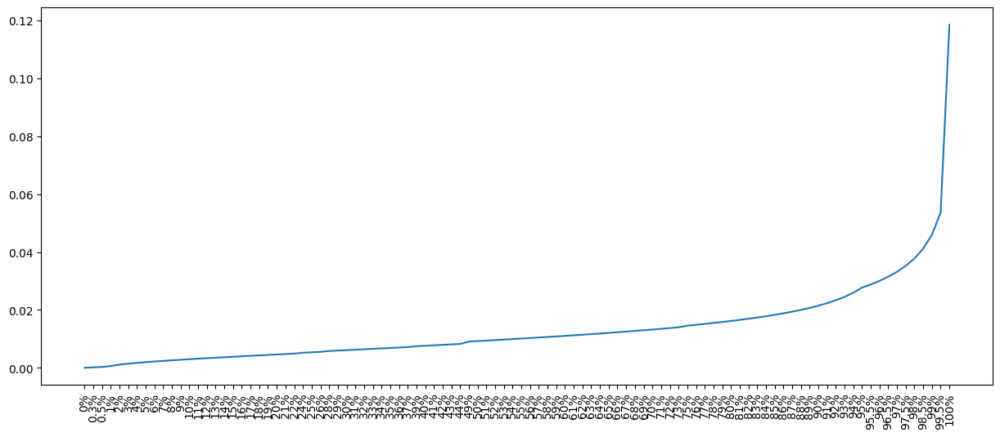

mitotracker Target_Var 0.0006269243625 0.0006269243625 (1%)

mitotracker 
 count    1.082800e+06
mean     1.129450e-02
std      8.916082e-03
min      4.444745e-06
0%       4.444745e-06
             ...     
98.5%    4.120376e-02
99%      4.592670e-02
99.5%    5.367956e-02
100%     1.185319e-01
max      1.185319e-01
Name: Target_Var, Length: 105, dtype: float64
(341, 18)
0
img shape: (100, 100)
SNR: 1.840999960899353, Sharpness Laplacian: 0.0010000000474974513, Sharpness Brenner: 1.2319999933242798, Variance: 4.568114673020318e-05, Entropy: 5.833, Sigma: 0.005, FFT freq: -19.627


/tmp/ipykernel_68907/833902900.py:21: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = df_marker_copy[c]


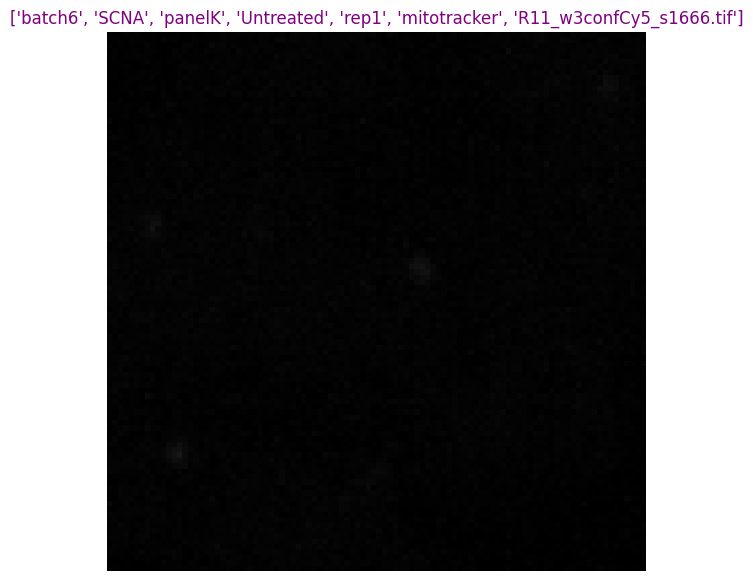

/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch6/SCNA/panelK/Untreated/rep1/DAPI/R11_w1confDAPI_s1666.tif
img shape: (100, 100)
SNR: 0.4300000071525574, Sharpness Laplacian: 0.0010000000474974513, Sharpness Brenner: 22.152000427246094, Variance: 0.001417243154719472, Entropy: 5.947, Sigma: 0.005, FFT freq: -16.204


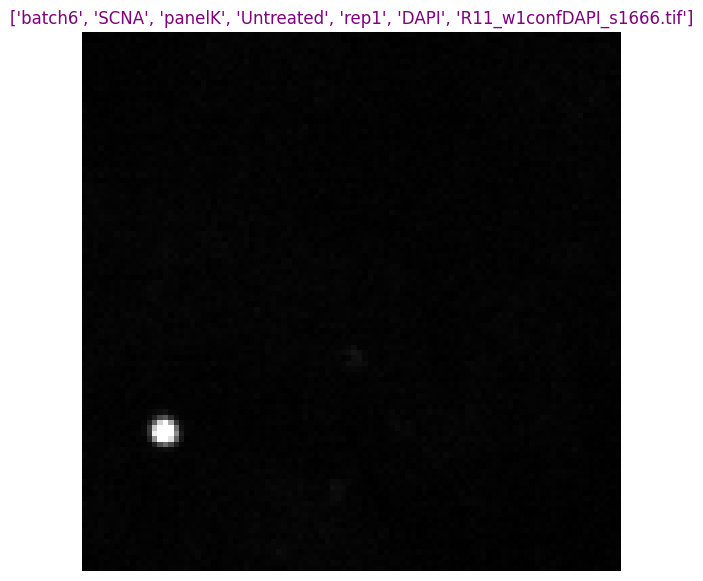

--------------------------------
1
img shape: (100, 100)
SNR: 1.0579999685287476, Sharpness Laplacian: 0.0010000000474974513, Sharpness Brenner: 7.192999839782715, Variance: 0.0005347583210095763, Entropy: 6.415, Sigma: 0.006, FFT freq: -15.342


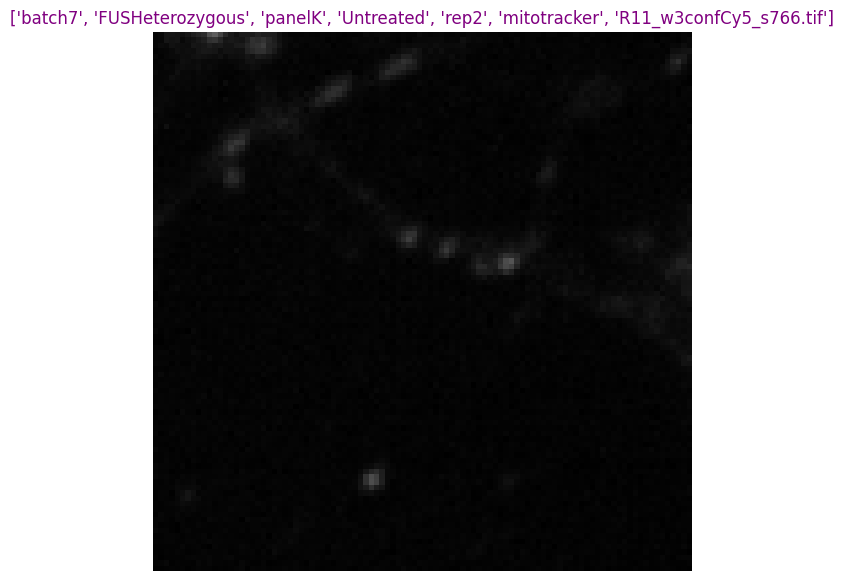

/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch7/FUSHeterozygous/panelK/Untreated/rep2/DAPI/R11_w1confDAPI_s766.tif
img shape: (100, 100)
SNR: 0.4970000088214874, Sharpness Laplacian: 0.0, Sharpness Brenner: 3.930000066757202, Variance: 0.0016926440875977278, Entropy: 6.054, Sigma: 0.003, FFT freq: -25.516


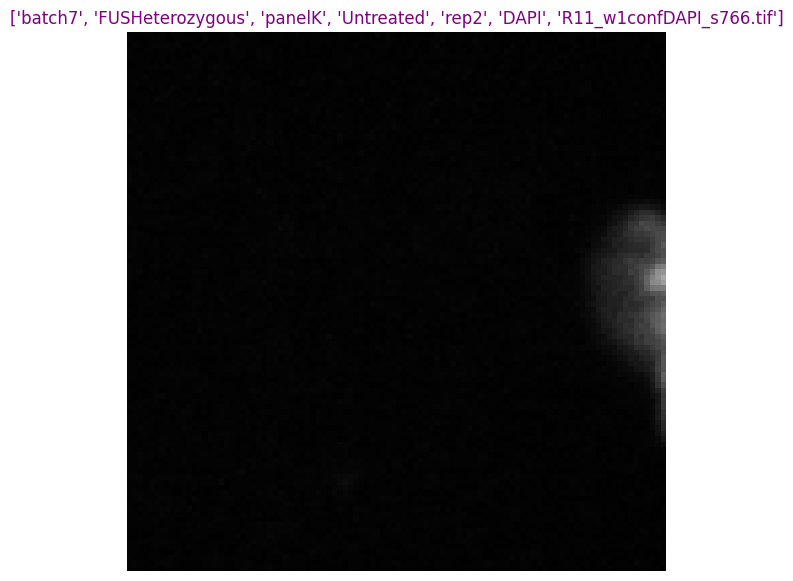

--------------------------------
2
img shape: (100, 100)
SNR: 1.1330000162124634, Sharpness Laplacian: 0.0010000000474974513, Sharpness Brenner: 3.86899995803833, Variance: 0.0004077796475030482, Entropy: 6.078, Sigma: 0.005, FFT freq: -20.31


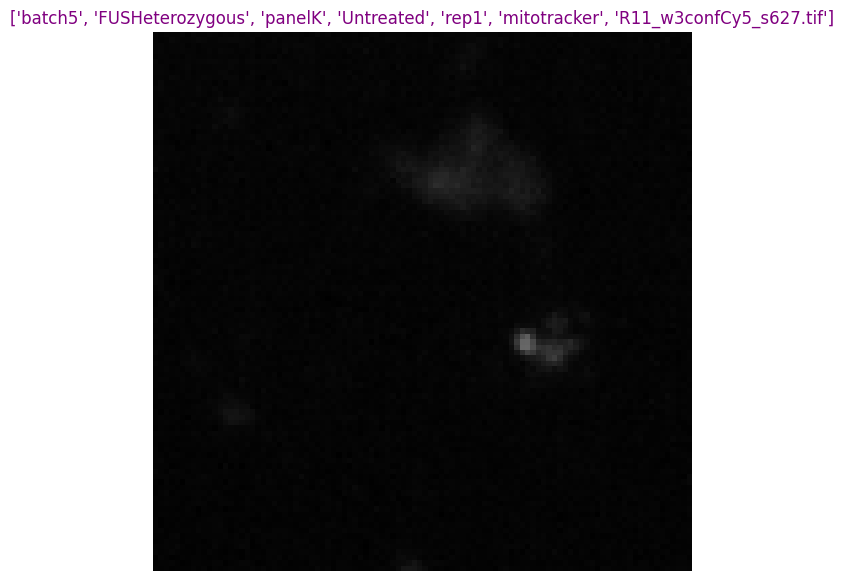

/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch5/FUSHeterozygous/panelK/Untreated/rep1/DAPI/R11_w1confDAPI_s627.tif
img shape: (100, 100)
SNR: 0.21799999475479126, Sharpness Laplacian: 0.003000000026077032, Sharpness Brenner: 71.66300201416016, Variance: 0.018707474693655968, Entropy: 5.778, Sigma: 0.002, FFT freq: -14.36


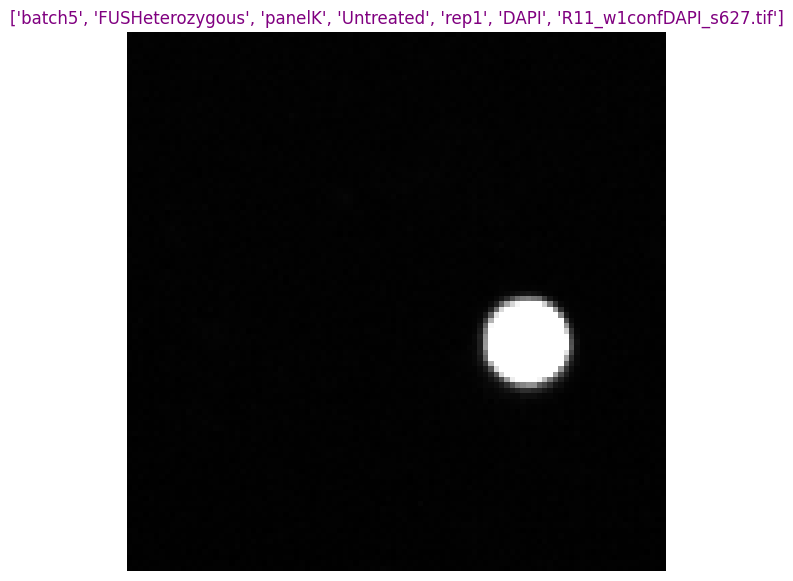

--------------------------------
3
img shape: (100, 100)
SNR: 0.8209999799728394, Sharpness Laplacian: 0.0, Sharpness Brenner: 1.6759999990463257, Variance: 0.00023625011090189219, Entropy: 6.0, Sigma: 0.003, FFT freq: -29.062


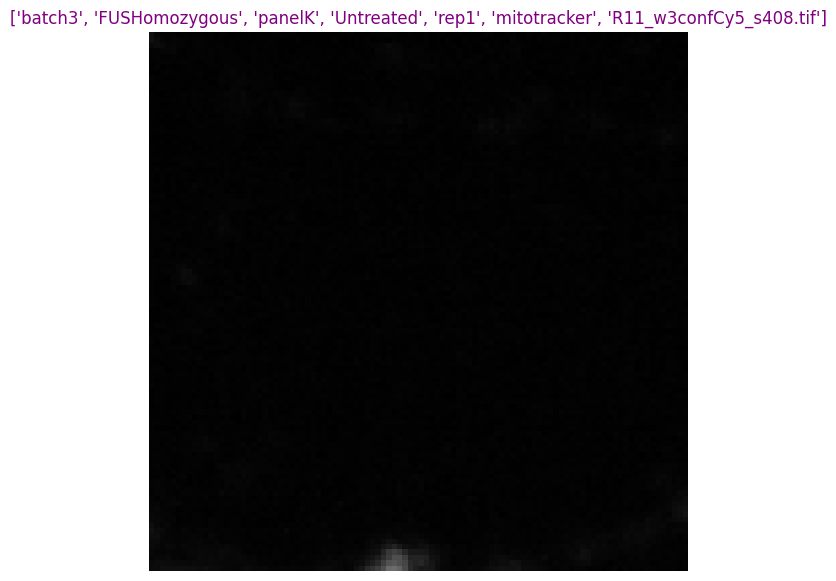

/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch3/FUSHomozygous/panelK/Untreated/rep1/DAPI/R11_w1confDAPI_s408.tif
img shape: (100, 100)
SNR: 0.38199999928474426, Sharpness Laplacian: 0.0, Sharpness Brenner: 5.339000225067139, Variance: 0.0008999618585221469, Entropy: 5.998, Sigma: 0.002, FFT freq: -33.205


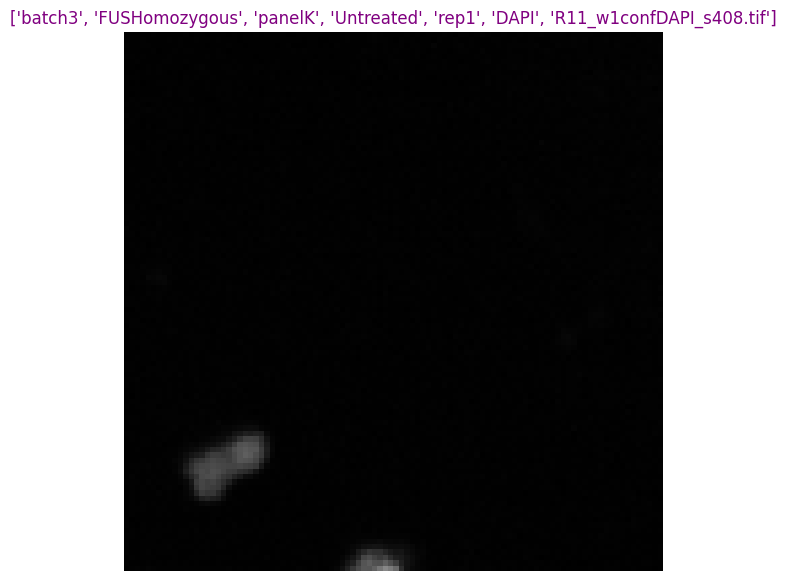

--------------------------------
4
img shape: (100, 100)
SNR: 1.5640000104904175, Sharpness Laplacian: 0.0020000000949949026, Sharpness Brenner: 7.966000080108643, Variance: 0.0005855004419572651, Entropy: 6.239, Sigma: 0.009, FFT freq: -6.367


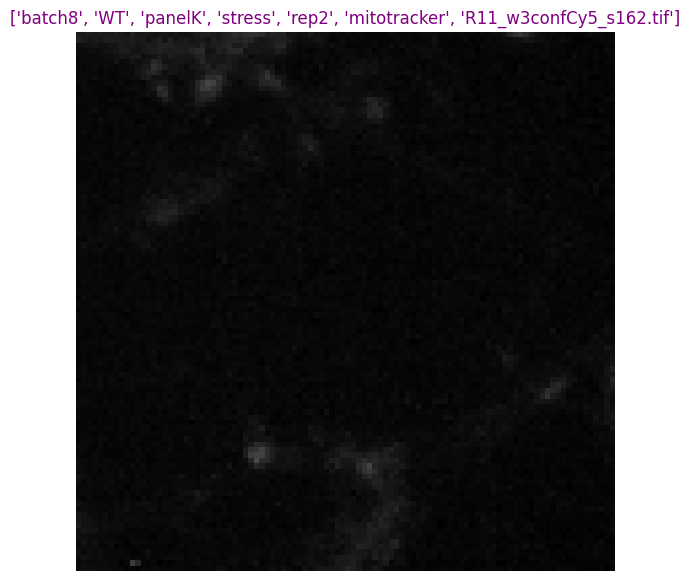

/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch8/WT/panelK/stress/rep2/DAPI/R11_w1confDAPI_s162.tif
img shape: (100, 100)
SNR: 0.32100000977516174, Sharpness Laplacian: 0.0, Sharpness Brenner: 4.927999973297119, Variance: 0.0017770450795069337, Entropy: 5.872, Sigma: 0.002, FFT freq: -30.069


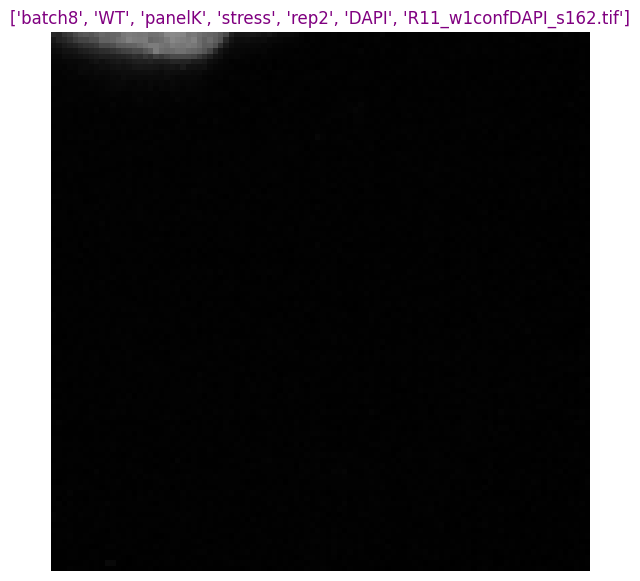

--------------------------------
5
img shape: (100, 100)
SNR: 3.5220000743865967, Sharpness Laplacian: 0.0010000000474974513, Sharpness Brenner: 2.8440001010894775, Variance: 8.264465577667579e-05, Entropy: 5.394, Sigma: 0.008, FFT freq: -11.038


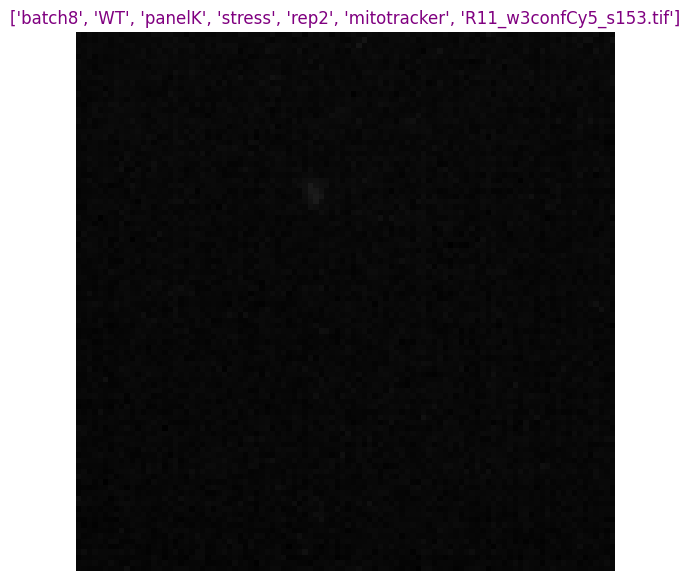

/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch8/WT/panelK/stress/rep2/DAPI/R11_w1confDAPI_s153.tif
img shape: (100, 100)
SNR: 0.25999999046325684, Sharpness Laplacian: 0.0, Sharpness Brenner: 10.574999809265137, Variance: 0.0011378148337826133, Entropy: 5.668, Sigma: 0.001, FFT freq: -38.766


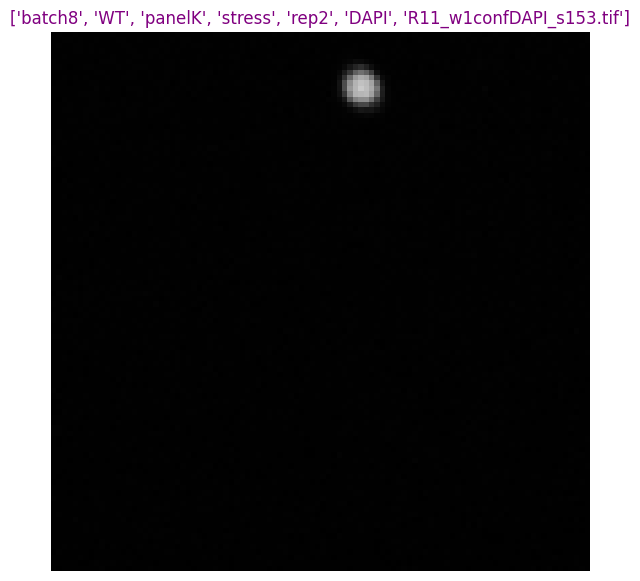

--------------------------------
6
img shape: (100, 100)
SNR: 1.1690000295639038, Sharpness Laplacian: 0.0010000000474974513, Sharpness Brenner: 5.254000186920166, Variance: 0.0004844199283979833, Entropy: 6.784, Sigma: 0.005, FFT freq: -17.316


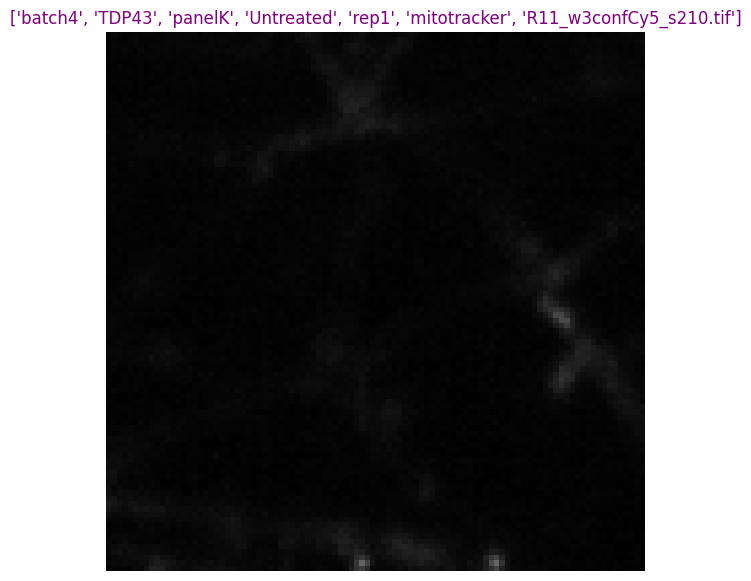

/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch4/TDP43/panelK/Untreated/rep1/DAPI/R11_w1confDAPI_s210.tif
img shape: (100, 100)
SNR: 0.6050000190734863, Sharpness Laplacian: 0.0, Sharpness Brenner: 4.47599983215332, Variance: 0.0004967504646629095, Entropy: 5.732, Sigma: 0.003, FFT freq: -29.444


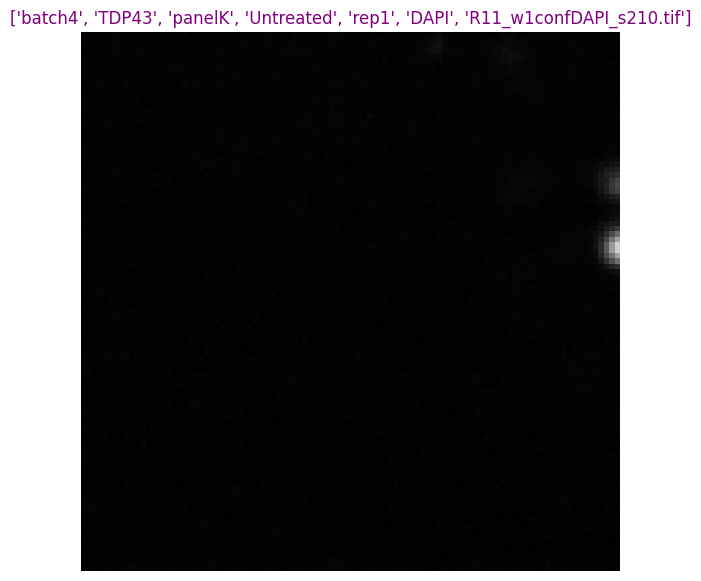

--------------------------------
7
img shape: (100, 100)
SNR: 1.784000039100647, Sharpness Laplacian: 0.0020000000949949026, Sharpness Brenner: 14.503999710083008, Variance: 0.0005582196172326803, Entropy: 5.77, Sigma: 0.009, FFT freq: -7.206


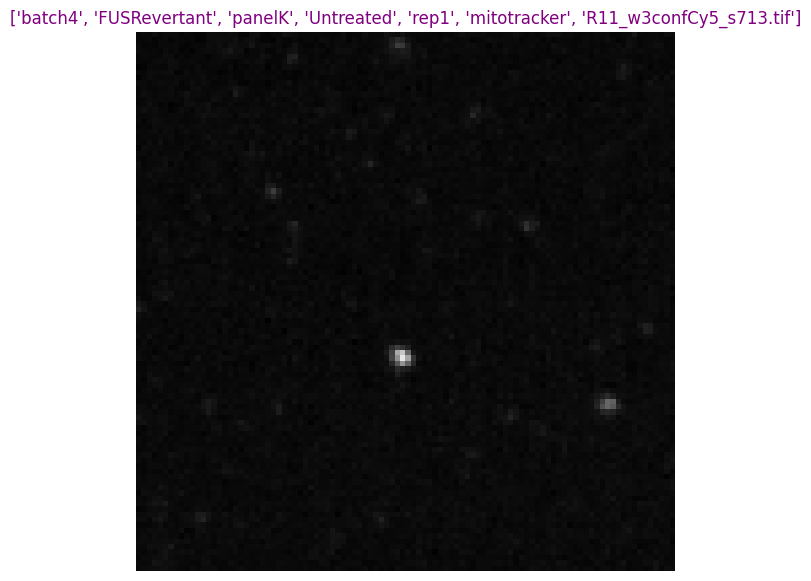

/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch4/FUSRevertant/panelK/Untreated/rep1/DAPI/R11_w1confDAPI_s713.tif
img shape: (100, 100)
SNR: 1.9759999513626099, Sharpness Laplacian: 0.004999999888241291, Sharpness Brenner: 22.698999404907227, Variance: 0.001498161698691547, Entropy: 5.781, Sigma: 0.015, FFT freq: 2.422


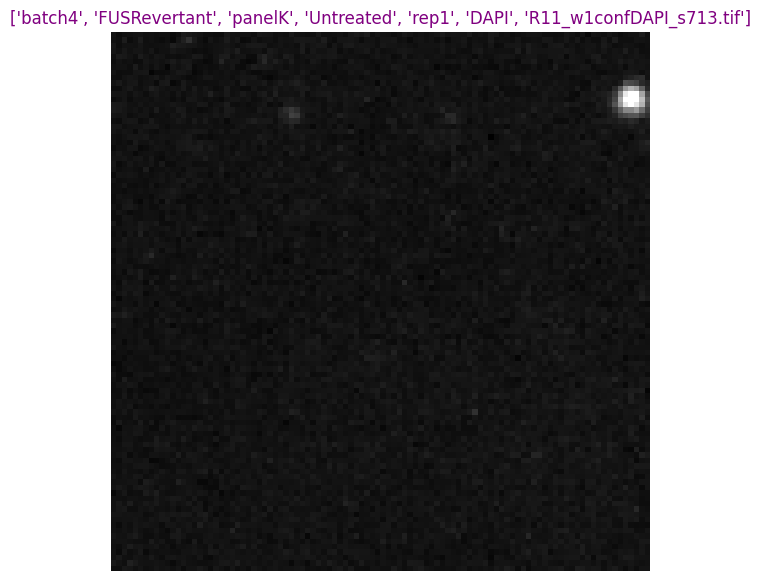

--------------------------------
8
img shape: (100, 100)
SNR: 1.0729999542236328, Sharpness Laplacian: 0.0010000000474974513, Sharpness Brenner: 4.25, Variance: 0.00047671631909906864, Entropy: 6.525, Sigma: 0.005, FFT freq: -16.915


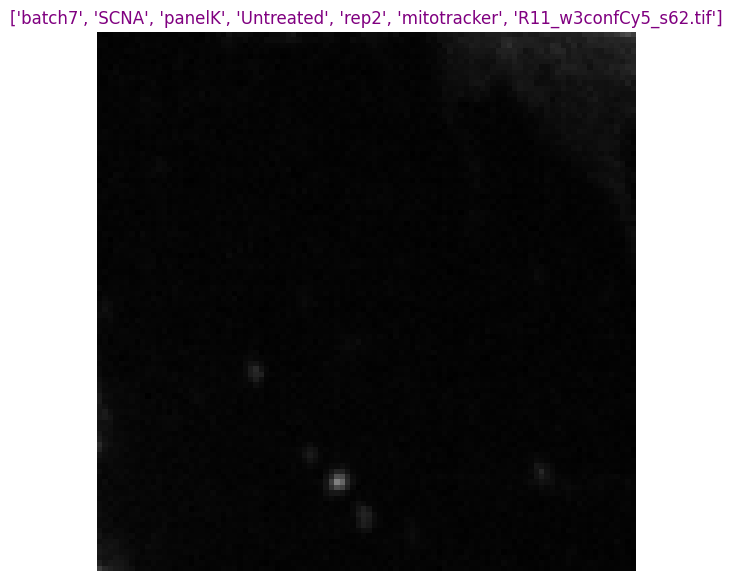

/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch7/SCNA/panelK/Untreated/rep2/DAPI/R11_w1confDAPI_s62.tif
img shape: (100, 100)
SNR: 0.699999988079071, Sharpness Laplacian: 0.0010000000474974513, Sharpness Brenner: 10.680000305175781, Variance: 0.0015960772288963199, Entropy: 5.718, Sigma: 0.006, FFT freq: -12.892


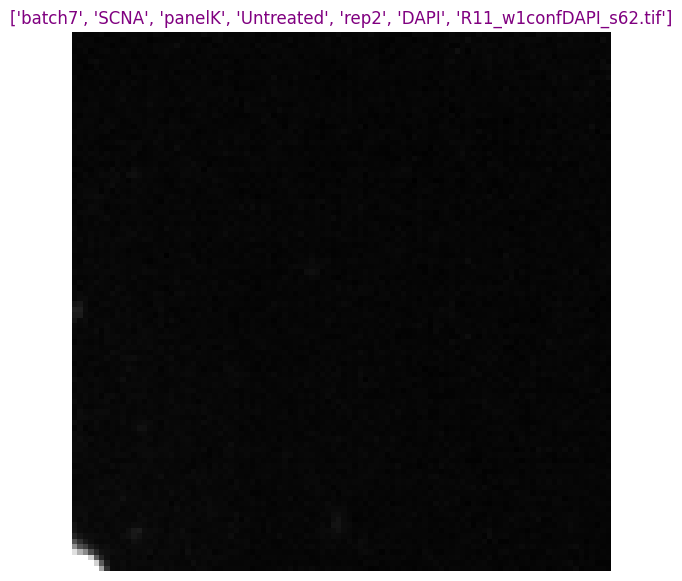

--------------------------------
9
img shape: (100, 100)
SNR: 0.8989999890327454, Sharpness Laplacian: 0.0, Sharpness Brenner: 3.2690000534057617, Variance: 0.0004749286745209247, Entropy: 6.076, Sigma: 0.003, FFT freq: -26.822


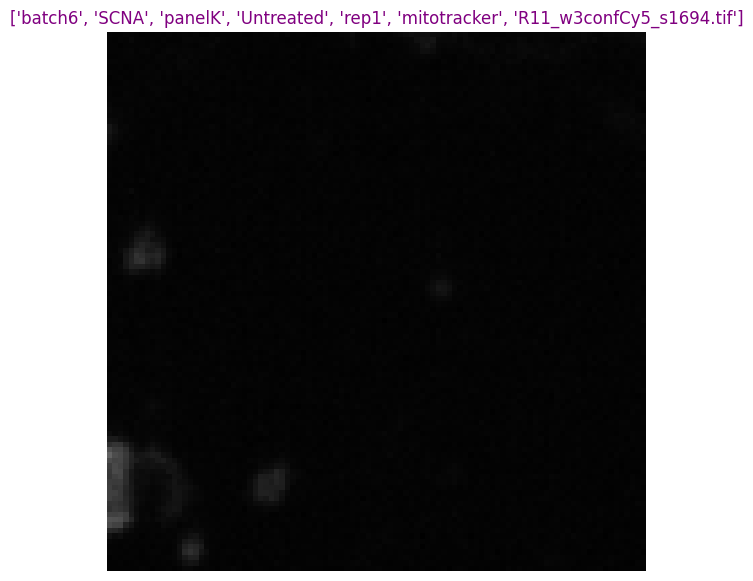

/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch6/SCNA/panelK/Untreated/rep1/DAPI/R11_w1confDAPI_s1694.tif
img shape: (100, 100)
SNR: 0.38199999928474426, Sharpness Laplacian: 0.0, Sharpness Brenner: 10.618000030517578, Variance: 0.0013397610746324062, Entropy: 5.57, Sigma: 0.002, FFT freq: -32.204


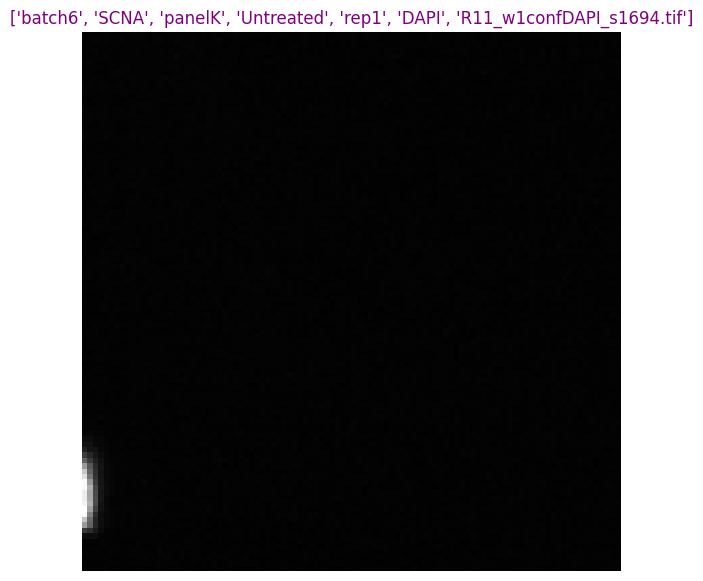

--------------------------------
10
img shape: (100, 100)
SNR: 1.3990000486373901, Sharpness Laplacian: 0.0010000000474974513, Sharpness Brenner: 5.978000164031982, Variance: 0.0003385756863281131, Entropy: 5.748, Sigma: 0.007, FFT freq: -12.739


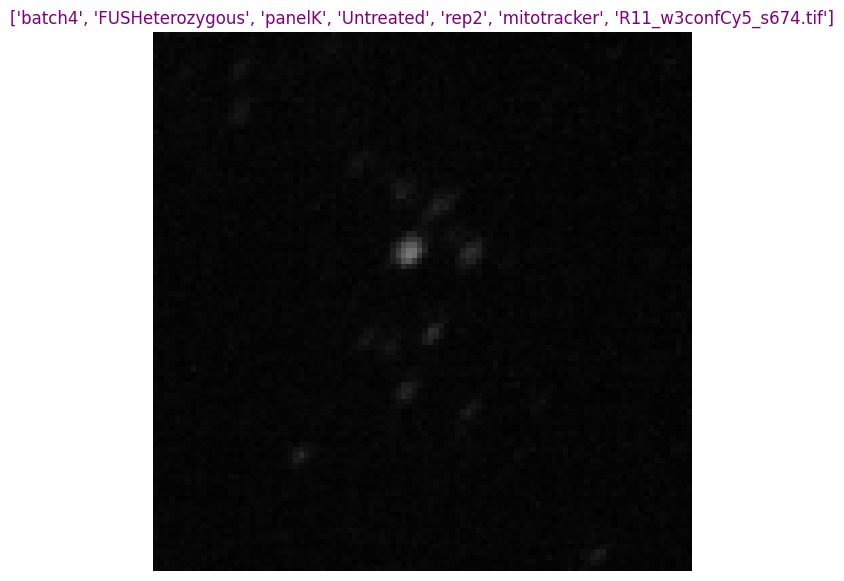

/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch4/FUSHeterozygous/panelK/Untreated/rep2/DAPI/R11_w1confDAPI_s674.tif
img shape: (100, 100)
SNR: 0.6110000014305115, Sharpness Laplacian: 0.0010000000474974513, Sharpness Brenner: 21.18600082397461, Variance: 0.001495162257924676, Entropy: 5.819, Sigma: 0.005, FFT freq: -13.472


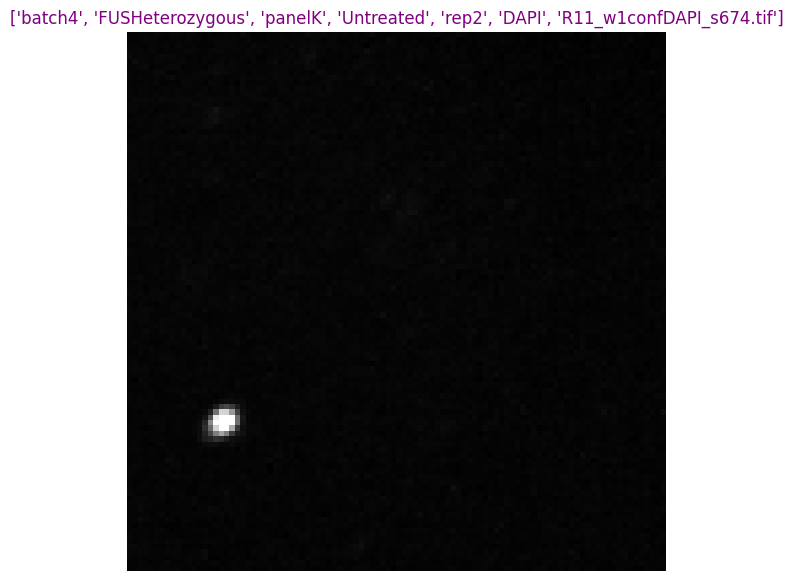

--------------------------------
11
img shape: (100, 100)
SNR: 2.8310000896453857, Sharpness Laplacian: 0.0020000000949949026, Sharpness Brenner: 5.706999778747559, Variance: 0.00017415688489563763, Entropy: 5.488, Sigma: 0.01, FFT freq: -4.211


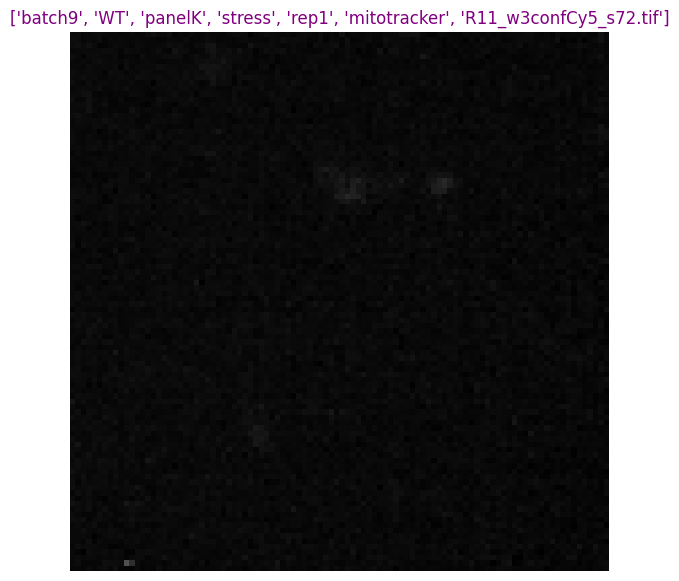

/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch9/WT/panelK/stress/rep1/DAPI/R11_w1confDAPI_s72.tif
img shape: (100, 100)
SNR: 0.4000000059604645, Sharpness Laplacian: 0.0010000000474974513, Sharpness Brenner: 13.859999656677246, Variance: 0.0011047730222344398, Entropy: 5.589, Sigma: 0.003, FFT freq: -26.481


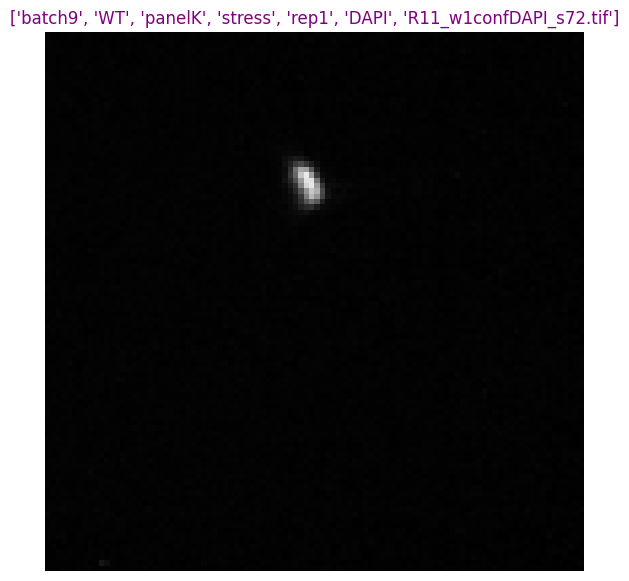

--------------------------------
12
img shape: (100, 100)
SNR: 1.531000018119812, Sharpness Laplacian: 0.0010000000474974513, Sharpness Brenner: 3.5269999504089355, Variance: 0.000247740390477702, Entropy: 5.92, Sigma: 0.006, FFT freq: -14.981


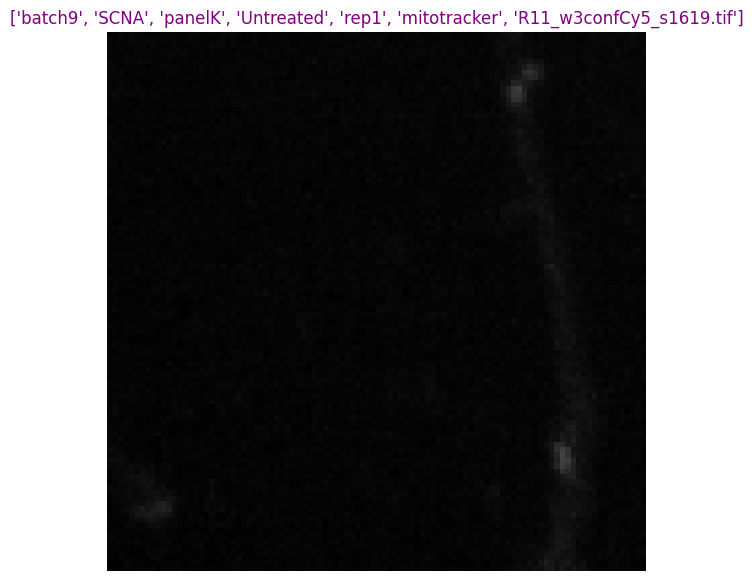

/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch9/SCNA/panelK/Untreated/rep1/DAPI/R11_w1confDAPI_s1619.tif
img shape: (100, 100)
SNR: 0.23899999260902405, Sharpness Laplacian: 0.0010000000474974513, Sharpness Brenner: 31.597999572753906, Variance: 0.0061063216999173164, Entropy: 5.688, Sigma: 0.003, FFT freq: -27.1


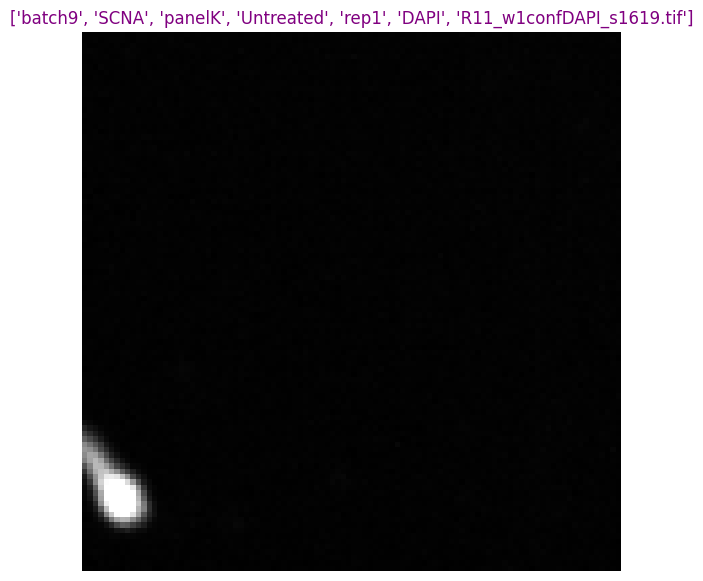

--------------------------------
13
img shape: (100, 100)
SNR: 1.2569999694824219, Sharpness Laplacian: 0.0010000000474974513, Sharpness Brenner: 6.181000232696533, Variance: 0.0002790641156025231, Entropy: 5.711, Sigma: 0.006, FFT freq: -15.744


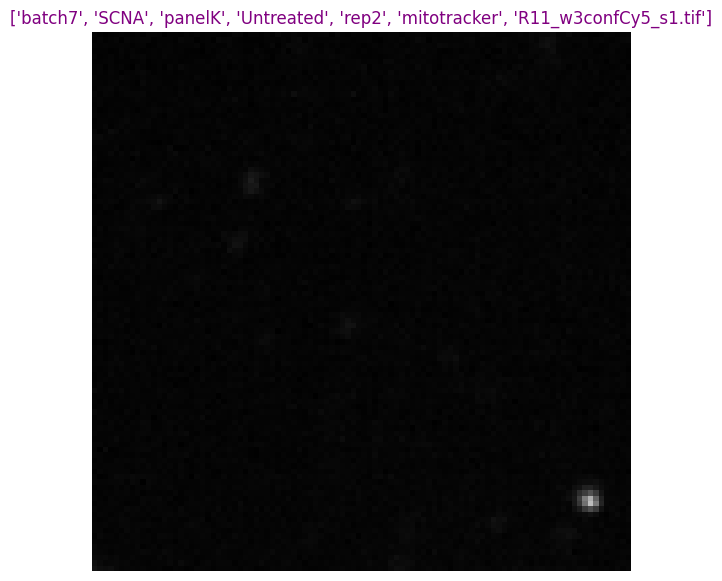

/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch7/SCNA/panelK/Untreated/rep2/DAPI/R11_w1confDAPI_s1.tif
img shape: (100, 100)
SNR: 0.46799999475479126, Sharpness Laplacian: 0.0020000000949949026, Sharpness Brenner: 25.115999221801758, Variance: 0.004633267410099506, Entropy: 5.594, Sigma: 0.007, FFT freq: -12.322


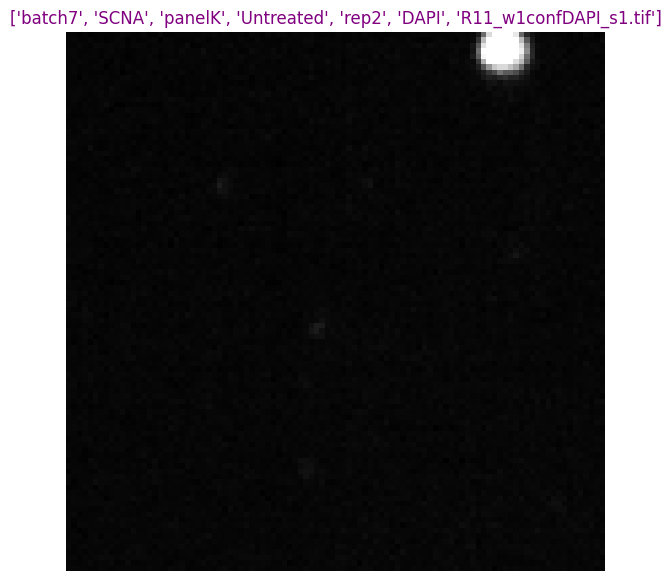

--------------------------------
14
img shape: (100, 100)
SNR: 1.4529999494552612, Sharpness Laplacian: 0.0010000000474974513, Sharpness Brenner: 5.632999897003174, Variance: 0.000487054290715605, Entropy: 7.027, Sigma: 0.006, FFT freq: -13.787


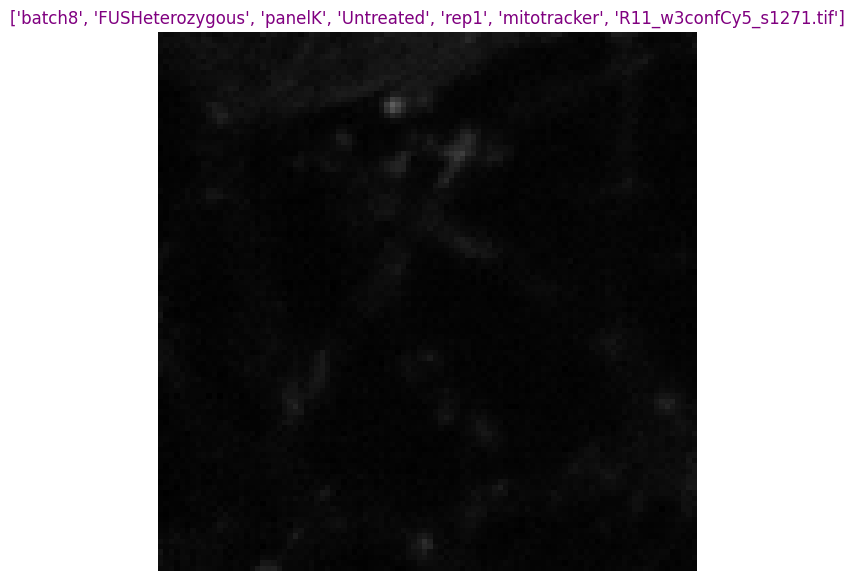

/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch8/FUSHeterozygous/panelK/Untreated/rep1/DAPI/R11_w1confDAPI_s1271.tif
img shape: (100, 100)
SNR: 0.41999998688697815, Sharpness Laplacian: 0.0, Sharpness Brenner: 2.99399995803833, Variance: 0.0013729139463976026, Entropy: 6.187, Sigma: 0.002, FFT freq: -31.95


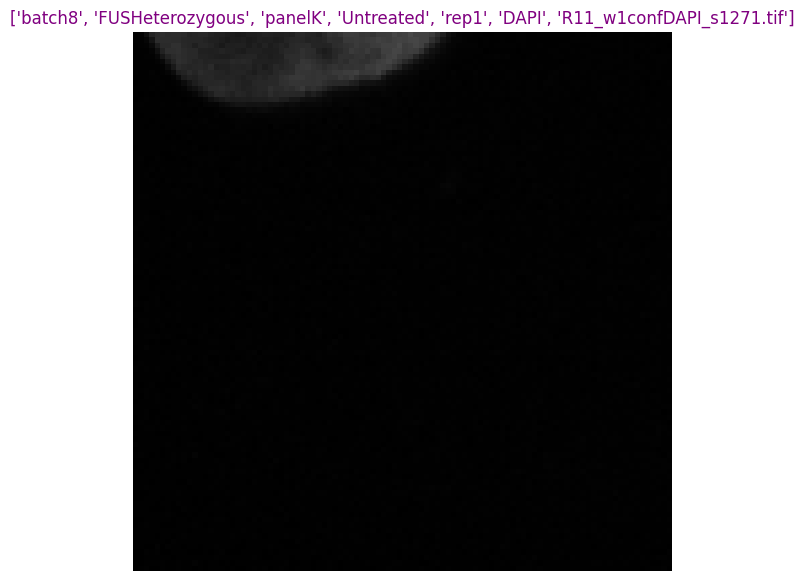

--------------------------------
15
img shape: (100, 100)
SNR: 1.0440000295639038, Sharpness Laplacian: 0.0, Sharpness Brenner: 1.7929999828338623, Variance: 0.0005373776075430214, Entropy: 6.44, Sigma: 0.004, FFT freq: -20.672


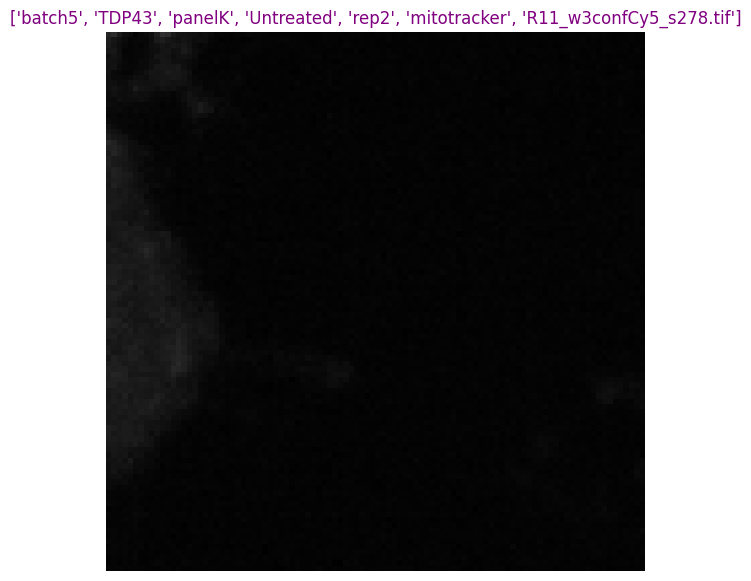

/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch5/TDP43/panelK/Untreated/rep2/DAPI/R11_w1confDAPI_s278.tif
img shape: (100, 100)
SNR: 0.4659999907016754, Sharpness Laplacian: 0.0, Sharpness Brenner: 4.678999900817871, Variance: 0.001950485398992896, Entropy: 6.2, Sigma: 0.002, FFT freq: -27.364


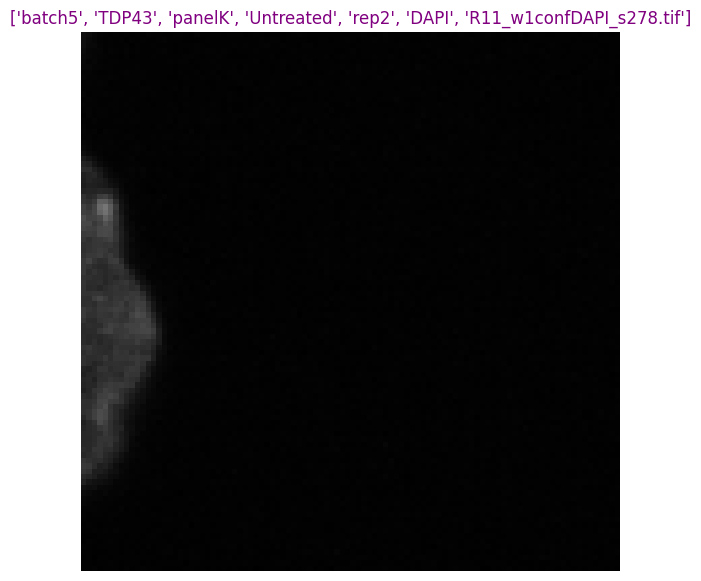

--------------------------------
16
img shape: (100, 100)
SNR: 1.1979999542236328, Sharpness Laplacian: 0.0, Sharpness Brenner: 1.8960000276565552, Variance: 0.0001222956634592265, Entropy: 5.84, Sigma: 0.004, FFT freq: -21.787


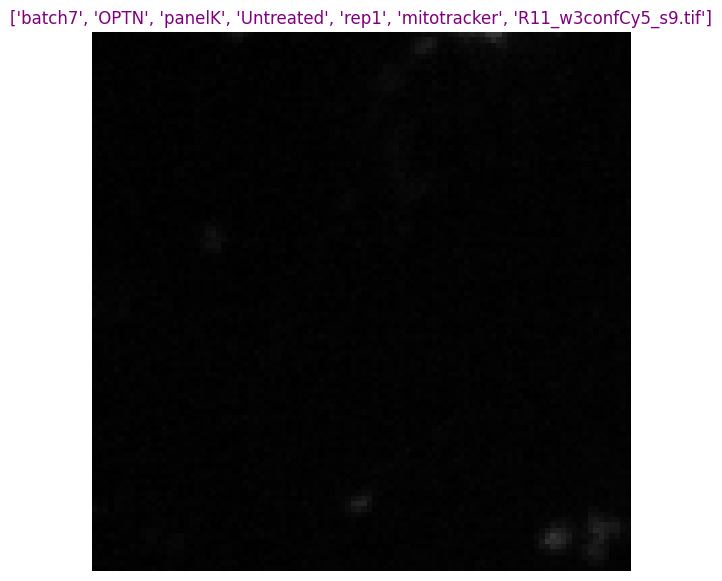

/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch7/OPTN/panelK/Untreated/rep1/DAPI/R11_w1confDAPI_s9.tif
img shape: (100, 100)
SNR: 0.41200000047683716, Sharpness Laplacian: 0.0, Sharpness Brenner: 4.070000171661377, Variance: 0.000861604290548712, Entropy: 5.619, Sigma: 0.003, FFT freq: -28.246


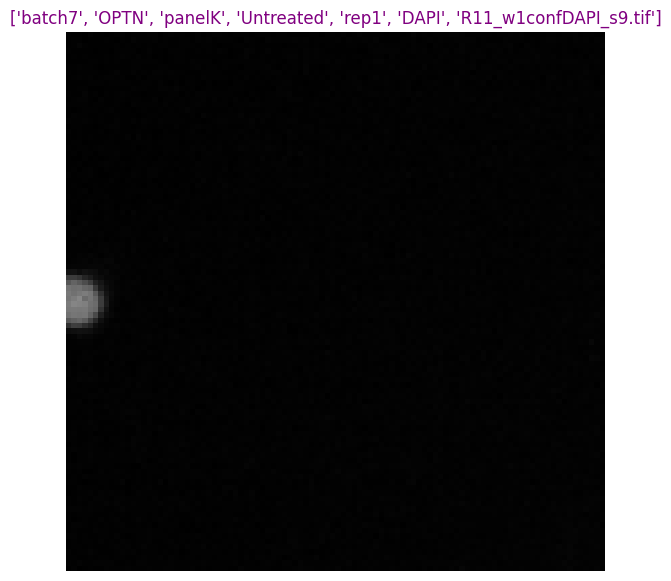

--------------------------------
17
img shape: (100, 100)
SNR: 0.9350000023841858, Sharpness Laplacian: 0.0, Sharpness Brenner: 0.6740000247955322, Variance: 3.976745210820809e-05, Entropy: 5.402, Sigma: 0.002, FFT freq: -32.629


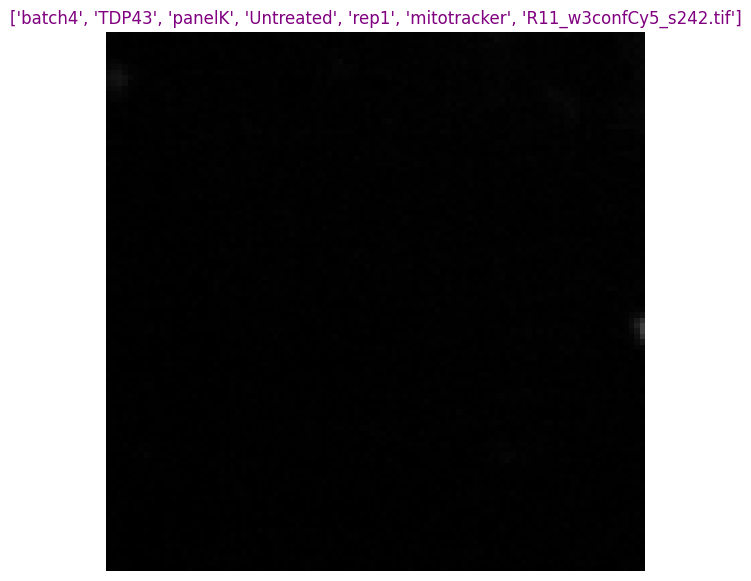

/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch4/TDP43/panelK/Untreated/rep1/DAPI/R11_w1confDAPI_s242.tif
img shape: (100, 100)
SNR: 0.3630000054836273, Sharpness Laplacian: 0.0010000000474974513, Sharpness Brenner: 15.211000442504883, Variance: 0.002208350459113717, Entropy: 6.594, Sigma: 0.003, FFT freq: -23.104


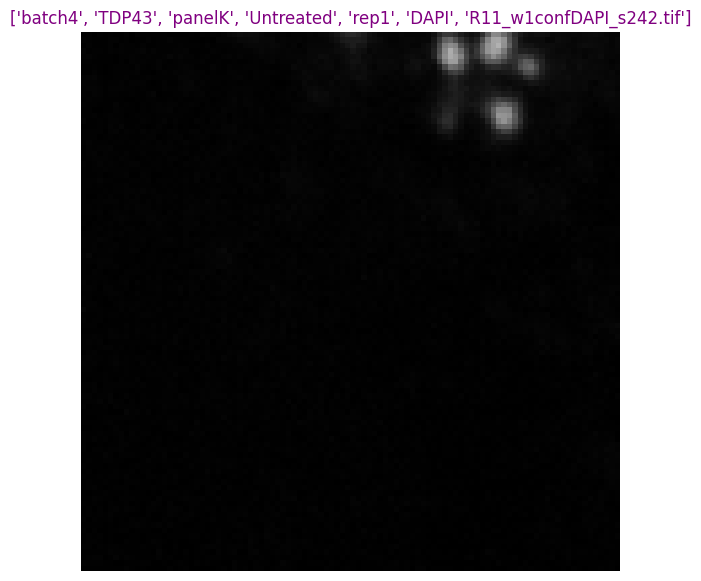

--------------------------------
18
img shape: (100, 100)
SNR: 0.5070000290870667, Sharpness Laplacian: 0.0, Sharpness Brenner: 7.014999866485596, Variance: 0.0005221828469075263, Entropy: 6.29, Sigma: 0.003, FFT freq: -27.29


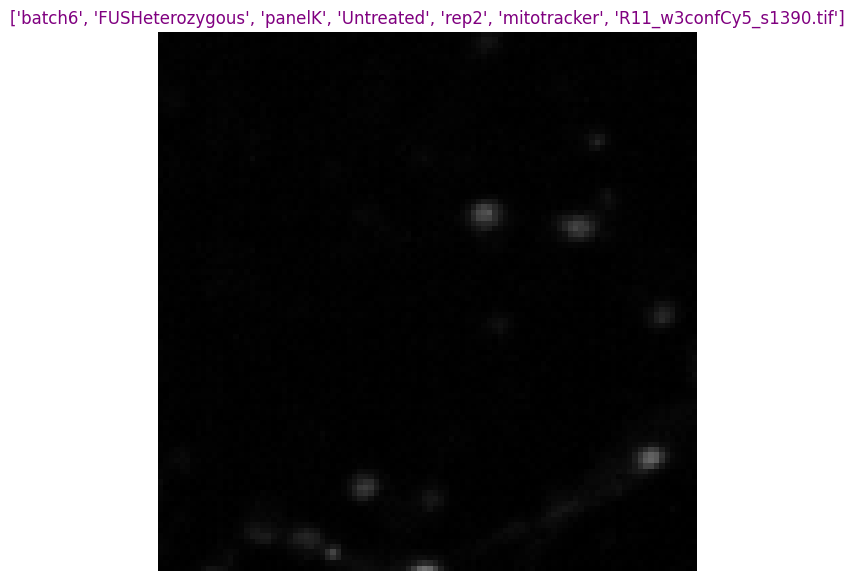

/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch6/FUSHeterozygous/panelK/Untreated/rep2/DAPI/R11_w1confDAPI_s1390.tif
img shape: (100, 100)
SNR: 0.44699999690055847, Sharpness Laplacian: 0.0, Sharpness Brenner: 7.749000072479248, Variance: 0.0008993410156108439, Entropy: 7.448, Sigma: 0.002, FFT freq: -33.586


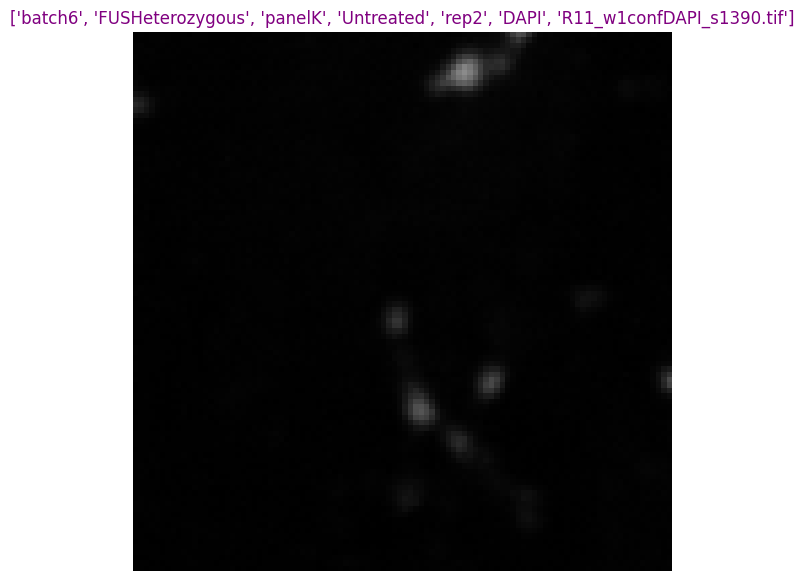

--------------------------------
19
img shape: (100, 100)
SNR: 2.9809999465942383, Sharpness Laplacian: 0.003000000026077032, Sharpness Brenner: 7.556000232696533, Variance: 0.0005091235507279634, Entropy: 6.467, Sigma: 0.013, FFT freq: -0.179


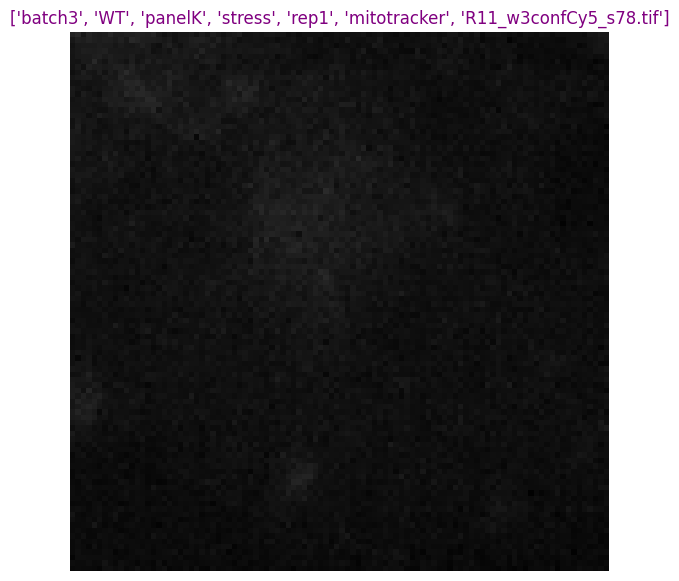

/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/batch3/WT/panelK/stress/rep1/DAPI/R11_w1confDAPI_s78.tif
img shape: (100, 100)
SNR: 1.6890000104904175, Sharpness Laplacian: 0.0020000000949949026, Sharpness Brenner: 4.478000164031982, Variance: 0.001358228619210422, Entropy: 7.822, Sigma: 0.009, FFT freq: -7.0


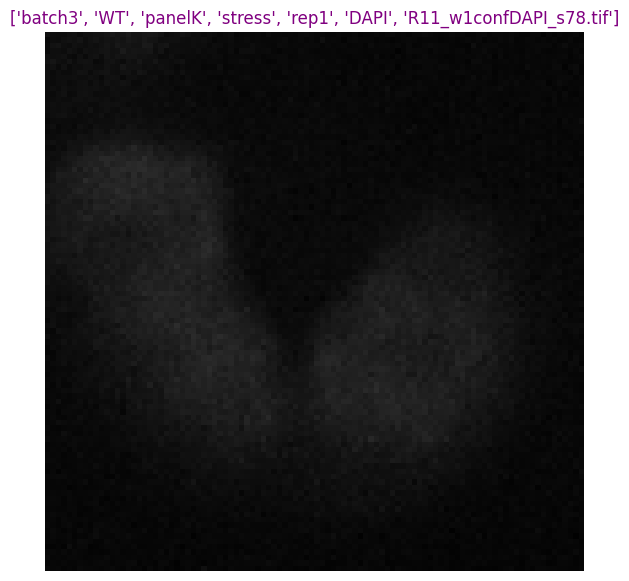

--------------------------------
20
Stopping at 20. There are 341 images in total


In [249]:


plt.figure(figsize=(15,6))
plt.plot(percentiles.keys().to_numpy()[4:-1], percentiles.values[4:-1])
plt.xticks(rotation=90)
plt.show()

per = 1
low_threshold = percentiles[f'{per}%'] 
high_threshold = percentiles[f'{per}%'] 
max_samples = 20
rescale_tile=False

print(marker, metric_name, low_threshold, high_threshold, f'({per}%)')
print()
print(marker, '\n', percentiles)

df_marker_copy = df_marker[df_marker['DAPI_Var'] >= 0.00046104984350000015]
df_marker_copy = df_marker_copy.sample(frac=1,random_state=1)
c = (df_marker[metric_name]<=low_threshold) & (df_marker[metric_name]>=percentiles[f'{per-1}%'])  
# c = (df_marker_copy[metric_name]>=high_threshold) & (df_marker_copy[metric_name]<=percentiles[f'{per+1}%'] )

tmp = df_marker_copy[c]
# print(tmp.shape)
# tmp = tmp[tmp.Marker==marker]
print(tmp.shape)#, round(tmp.shape[0] * 100.0/counts[marker], 3))

show_tiles(tmp, max_samples=max_samples,rescale_tile=rescale_tile)    

# save_to_mapping(mappings, marker, metric_name, low_threshold, high_threshold)

# print("The thresholds map:")
# mappings


In [250]:
# Saving to csv file


# Creating the data
data = {
    "Marker": ["CLTC", "FUS", "PSD95", "FMRP", "Phalloidin", "SQSTM1", "CD41", "NONO", "TDP43", 
               "Calreticulin", "LAMP1", "ANXA11", "SCNA", "G3BP1", "KIF5A", "PURA", "NCL", "GM130", 
               "TOMM20", "DCP1A", "NEMO", "PEX14", "PML", "mitotracker"],
    "Var lower bound": [0.000265871198, 0.0004350261885000001, 0.004201938600000001, 0.00066135006, 
                        0.00015000848500000002, 0.000268906454, 0.0006363162600000001, 0.00036613327599999997, 
                        0.0002305231125, 0.0008416621785, 0.000434905584, 0.000344976958, 0.001313420307, 
                        0.000456032028, 0.000433718979, 0.00032591145400000005, 0.0012939671099999994, 
                        0.0004285414680000001, 0.0003555352584, 0.0006338563592000001, 0.004622138705, 
                        0.000558227293, 0.000863521699, 0.0006269243625]
}

# Creating a DataFrame
df = pd.DataFrame(data)

# Convert the DataFrame to a CSV file and save it
csv_filename = "/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/tiles_var_validity_bounds.csv"
df.to_csv(csv_filename, index=False)

# UMAP oriented

Plan:
- Preprocess images while saving the actual index of each tile (before filtering out tiles)
- Generate embeddings for them
- Run the model and generate UMAPs for them
- Pick (using DBSCAN) the outliers and save their paths (+tile number)
- Calculate their metrics

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sys
from sklearn.cluster import DBSCAN

sys.path.insert(1, os.getenv("MOMAPS_HOME"))
print(f"MOMAPS_HOME: {os.getenv('MOMAPS_HOME')}")

from src.common.lib.utils import flat_list_of_lists

%reload_ext autoreload
%autoreload 2
%aimport

%matplotlib inline

MOMAPS_HOME: /home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps
Modules to reload:
all-except-skipped

Modules to skip:



In [19]:
# Utils

def get_filter_indexes(labels, cell_lines_to_select, conditions_to_select, reps_to_select, markers_to_select):
        markers = np.asarray([l.split(os.sep)[-1] for l in labels])
        reps = np.asarray([l.split(os.sep)[-2] for l in labels])
        conditions = np.asarray([l.split(os.sep)[-3] for l in labels])
        cell_lines = np.asarray([l.split(os.sep)[-4] for l in labels])
        
        
        indexes = np.arange(len(labels)).tolist()

        mask = np.isin(markers, markers_to_select)
        indexes = list(set(np.where(mask)[0]).intersection(set(indexes)))

        mask = np.isin(conditions, conditions_to_select)
        indexes  = list(set(np.where(mask)[0]).intersection(set(indexes)))

        mask = np.isin(cell_lines, cell_lines_to_select)
        indexes = list(set(np.where(mask)[0]).intersection(set(indexes)))

        mask = np.isin(reps, reps_to_select)
        indexes = list(set(np.where(mask)[0]).intersection(set(indexes)))

        return indexes

def get_filtered_data(embeddings, labels, paths, cell_lines_to_select, conditions_to_select, reps_to_select, markers_to_select):
        indexes = get_filter_indexes(labels, cell_lines_to_select, conditions_to_select, reps_to_select, markers_to_select)
        
        return embeddings[indexes], labels[indexes], paths[indexes]

def plot_umap_custom(umap_data, labels, ax=None):
    axes = ax if ax is not None else plt
    
    conds = np.asarray([s.rsplit(os.sep)[-3] for s in labels])
    unique_conds = np.unique(conds)
    
    for cond in unique_conds:
        ind = np.where(conds == cond)[0]
        axes.scatter(umap_data[ind,0], umap_data[ind,1])
    axes.legend(unique_conds)
    if ax is not None:
        ax.set_xticks([])
        ax.set_yticks([])
    
    if ax is None:
        plt.xticks([])
        plt.yticks([])
        plt.show()

def handle_umap(embeddings, labels, ax=None):
        from umap import UMAP
        reducer = UMAP(random_state=1)
        umap_data= reducer.fit_transform(embeddings.reshape(embeddings.shape[0], -1))

        plot_umap_custom(umap_data, labels, ax)

        return umap_data

def handle_dbscan(umap_data, eps=0.8, min_samples=10):
        umap_data = umap_data[~np.isnan(umap_data)].reshape(-1, umap_data.shape[1])

        dbscan = DBSCAN(eps=eps, min_samples=min_samples)  # Adjust these parameters as needed
        clusters = dbscan.fit_predict(umap_data)

        # Assuming 'clusters' is the array of cluster labels from DBSCAN
        unique_clusters = np.unique(clusters)

        # Setting up colors for each cluster
        colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_clusters)))

        for cluster, color in zip(unique_clusters, colors):
                # Selecting data points belonging to the current cluster
                in_cluster = clusters == cluster
                plt.scatter(umap_data[in_cluster, 0], umap_data[in_cluster,1], color=color, label=f'Cluster {cluster}')

        plt.legend()
        plt.show()

        return clusters

def plot_save_outliers_from_umap(embeddings, labels, paths, savepath=None, dbscan_eps=0.8, dbscan_min_samples=10):
        def _verify_clusters(umap_data, clusters):
                unique, counts = np.unique(clusters, return_counts=True)
                
                if len(unique) == 1:
                        print(f"INFO: No outliers")
                        return
                
                if len(unique) > 2:
                        print(f"Warning: Multiple outliers clusters: len(unique) = {len(unique)}")
                
                main_cluster = unique[np.argmax(counts)]
                print(f"Main cluster: {main_cluster}")
                
                
                # Handle disconnected dots within the umap                
                umap_data_is_nan = np.isnan(umap_data)
                are_nans_exist = np.any(umap_data_is_nan)
                if are_nans_exist:
                        disconnected_dots_indexes = np.unique([a[0] for a in np.where(umap_data_is_nan)])
                        umap_data = umap_data[~umap_data_is_nan].reshape(-1, umap_data.shape[1])
                
                outliers_xy = umap_data[(clusters != main_cluster)]
                plt.xlim(np.min(umap_data[:,0]), np.max(umap_data[:,0]))
                plt.ylim(np.min(umap_data[:,1]), np.max(umap_data[:,1]))
                plt.scatter(outliers_xy[:,0], outliers_xy[:,1])
                plt.show()
                
                outliers_indexes = np.where((clusters != main_cluster))[0]
                
                if are_nans_exist: 
                        outliers_indexes = np.concatenate([outliers_indexes, disconnected_dots_indexes])
                        
                return outliers_indexes 

        def _save_to_file(outliers_indexes, savepath):
                save_folderpath = os.path.dirname(savepath)
                if not os.path.exists(save_folderpath):
                        os.makedirs(save_folderpath)

                outliers_paths = paths[outliers_indexes]
                print(f"|outliers| = {len(outliers_paths)}")

                print(f"savepath : {savepath}")

                with open(savepath, 'wb') as f:
                        np.save(f, outliers_paths)
        
        
        if len(embeddings) == 0:
                print("Warning: len(embeddings) = 0.")
                return
        
        umap_data = handle_umap(embeddings, labels)
        print(f"umap_data.shape: {umap_data.shape}")
        clusters = handle_dbscan(umap_data, eps=dbscan_eps, min_samples=dbscan_min_samples)
        outliers_indexes = _verify_clusters(umap_data, clusters)
        if outliers_indexes is not None and savepath is not None:
                _save_to_file(outliers_indexes, savepath)
                

In [ ]:

# # Load outliers paths from UMAP

# outliers_folder = "/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/outliers_paths_from_umap"
# outliers_filespaths = [os.path.join(outliers_folder, f) for f in os.listdir(outliers_folder)]
# outliers_filespaths


# def flat_list_of_lists(l):
#     return [item for sublist in l for item in sublist]

# outliers_paths = np.vstack(flat_list_of_lists([np.load(f) for f in outliers_filespaths])).reshape(-1,)
# outliers_paths = np.asarray([p.rsplit('_',1) for p in outliers_paths])
# outliers_paths_df = pd.DataFrame(outliers_paths, columns=["Path", 'TileNumber'])
# outliers_paths_df

In [10]:
# Load embeddings
batch_number = 5

# embeddings = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/embeddings_with_paths/neurons/vqvec2/batch6_16bit_no_downsample_partial/vqvec2_allset.npy")
labels = np.load(f"/home/labs/hornsteinlab/Collaboration/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/embeddings_with_paths/neurons/vqvec2/batch{batch_number}_16bit_no_downsample/vqvec2_labels_allset.npy")
paths = np.load(f"/home/labs/hornsteinlab/Collaboration/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/embeddings_with_paths/neurons/vqvec2/batch{batch_number}_16bit_no_downsample/vqvec2_paths_allset.npy")
embeddings = np.memmap(f"/home/labs/hornsteinlab/Collaboration/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/embeddings_with_paths/neurons/vqvec2/batch{batch_number}_16bit_no_downsample/vqvec2_allset.npy",  mode='r', dtype='float32', shape=(len(paths), 576, 4,4))


print(embeddings.shape, labels.shape, paths.shape)

markers = np.asarray([l.split(os.sep)[-1] for l in labels])
reps = np.asarray([l.split(os.sep)[-2] for l in labels])
conditions = np.asarray([l.split(os.sep)[-3] for l in labels])
cell_lines = np.asarray([l.split(os.sep)[-4] for l in labels])

(357871, 576, 4, 4) (357871,) (357871,)


In [ ]:
rep = 'rep2'
print(batch_number, rep)
reps_to_select = [rep]
conditions_to_select = ['Untreated']#, 'stress']
cell_line_to_select = ['WT', 'TBK1', 'FUSHomozygous', 'FUSHeterozygous', 'FUSRevertant', 'OPTN']# ["FUSHeterozygous"] #['WT', 'TBK1', 'FUSHomozygous', 'FUSHeterozygous', 'FUSRevertant', 'OPTN'] #['WT', 'TDP43', 'TBK1', 'FUSHomozygous', 'FUSHeterozygous', 'FUSRevertant', 'OPTN']
markers_to_select = ['FMRP']#np.unique(markers)
markers_to_exclude = []# ["DAPI", "TIA1", "FMRP", "SCNA", 'LAMP1', 'SQSTM1']#['DAPI', 'TIA1', 'SCNA', 'LAMP1']

for c in cell_line_to_select:
    print(c)
    print("***********")
    for m in markers_to_select:
        print(f"{m}_{c}")
        if m in markers_to_exclude:
            print("SKIPPING...")
            continue
        
        # f = os.path.join("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/outliers_paths_from_umap/batch5_rep1", c, f"{m}.npy")
        # if not os.path.exists(f):
        #     print("Not exists. SKIPPING")
        #     continue
        
        
        # Select
        embeddings_filtered, labels_filtered, paths_filtered =  get_filtered_data(embeddings, labels, paths, [c], conditions_to_select, reps_to_select, [m])

        print(embeddings_filtered.shape, labels_filtered.shape, paths_filtered.shape)

        # Plot umap
        savepath = None#f"/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/outliers_paths_from_umap/batch{batch_number}_{rep}/{c}/{m}.npy"
        plot_save_outliers_from_umap(embeddings_filtered, labels_filtered, paths_filtered, savepath)
        print()
        print()
        print('-----------------')
        print()
        print()

## Testing FMRP

(158641, 2048) (158641,) (158641,)
3 rep1
WT (827, 2048) (827,) (827,)
TBK1 (1006, 2048) (1006,) (1006,)
FUSHomozygous (460, 2048) (460,) (460,)
FUSHeterozygous (154, 2048) (154,) (154,)


/home/labs/hornsteinlab/Collaboration/MOmaps/anaconda3/momaps_torch/lib/python3.9/site-packages/umap/umap_.py:125: UserWarning: A few of your vertices were disconnected from the manifold.  This shouldn't cause problems.
Disconnection_distance = inf has removed 306 edges.
It has only fully disconnected 1 vertices.
Use umap.utils.disconnected_vertices() to identify them.
  warn(


FUSRevertant (196, 2048) (196,) (196,)
OPTN (552, 2048) (552,) (552,)


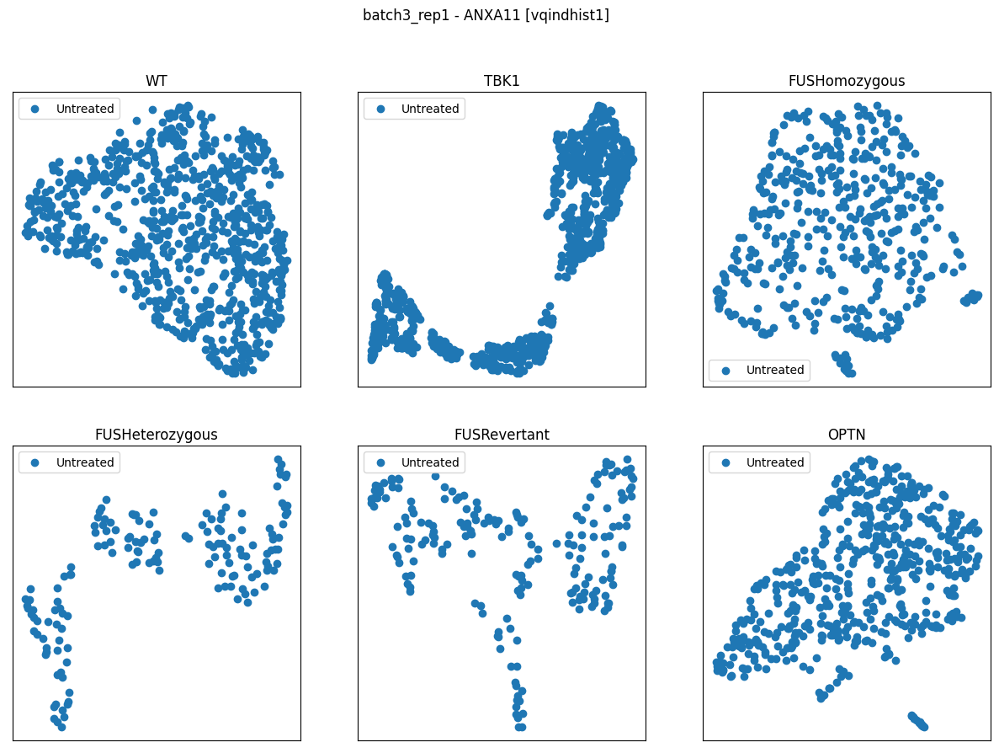

WT (764, 2048) (764,) (764,)
TBK1 (912, 2048) (912,) (912,)
FUSHomozygous (389, 2048) (389,) (389,)
FUSHeterozygous (86, 2048) (86,) (86,)
FUSRevertant (466, 2048) (466,) (466,)
OPTN (648, 2048) (648,) (648,)


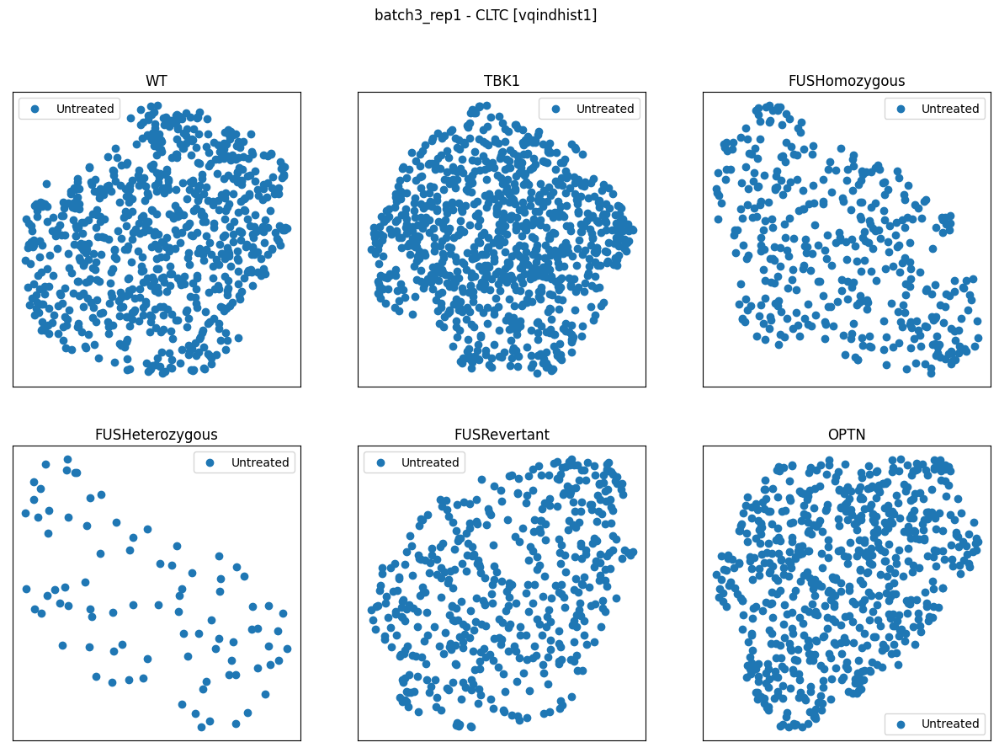

WT (819, 2048) (819,) (819,)
TBK1 (952, 2048) (952,) (952,)
FUSHomozygous (578, 2048) (578,) (578,)
FUSHeterozygous (98, 2048) (98,) (98,)
FUSRevertant (446, 2048) (446,) (446,)
OPTN (803, 2048) (803,) (803,)


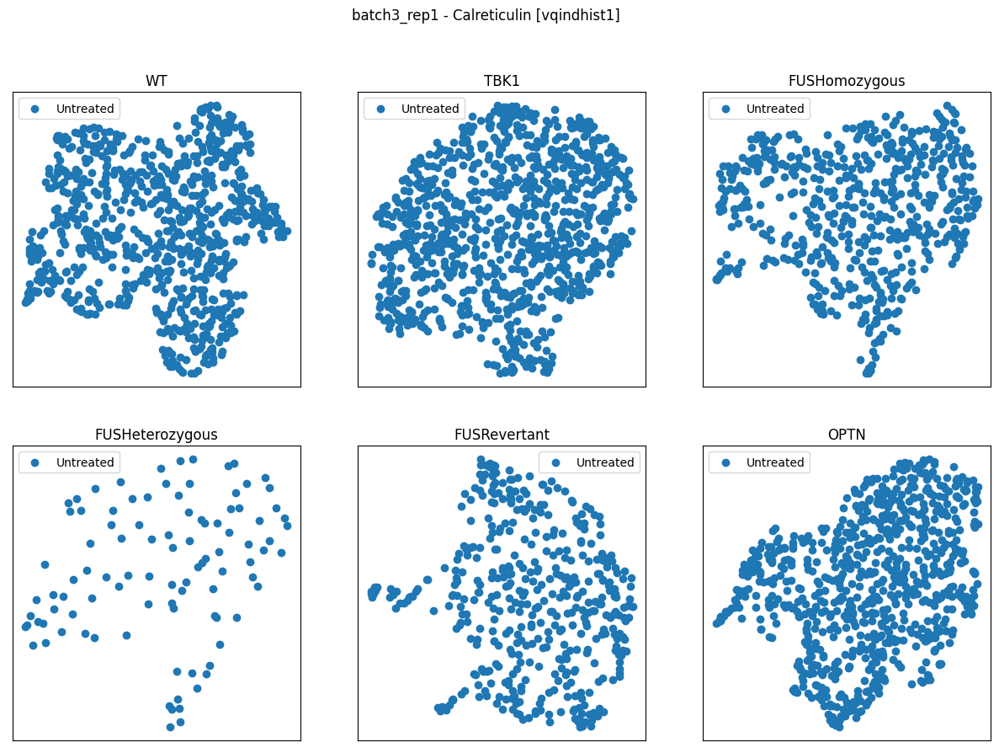

WT (1016, 2048) (1016,) (1016,)
TBK1 (1079, 2048) (1079,) (1079,)
FUSHomozygous (531, 2048) (531,) (531,)
FUSHeterozygous (193, 2048) (193,) (193,)
FUSRevertant (587, 2048) (587,) (587,)
OPTN (848, 2048) (848,) (848,)


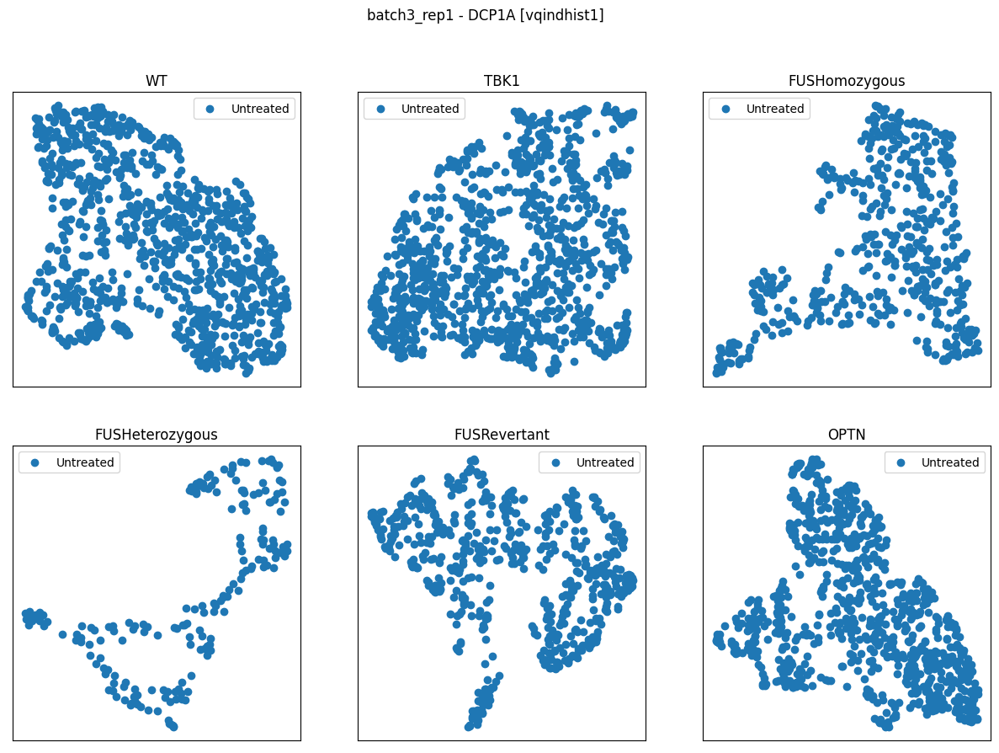

WT (525, 2048) (525,) (525,)
TBK1 (812, 2048) (812,) (812,)
FUSHomozygous (502, 2048) (502,) (502,)
FUSHeterozygous (165, 2048) (165,) (165,)
FUSRevertant (456, 2048) (456,) (456,)
OPTN (666, 2048) (666,) (666,)


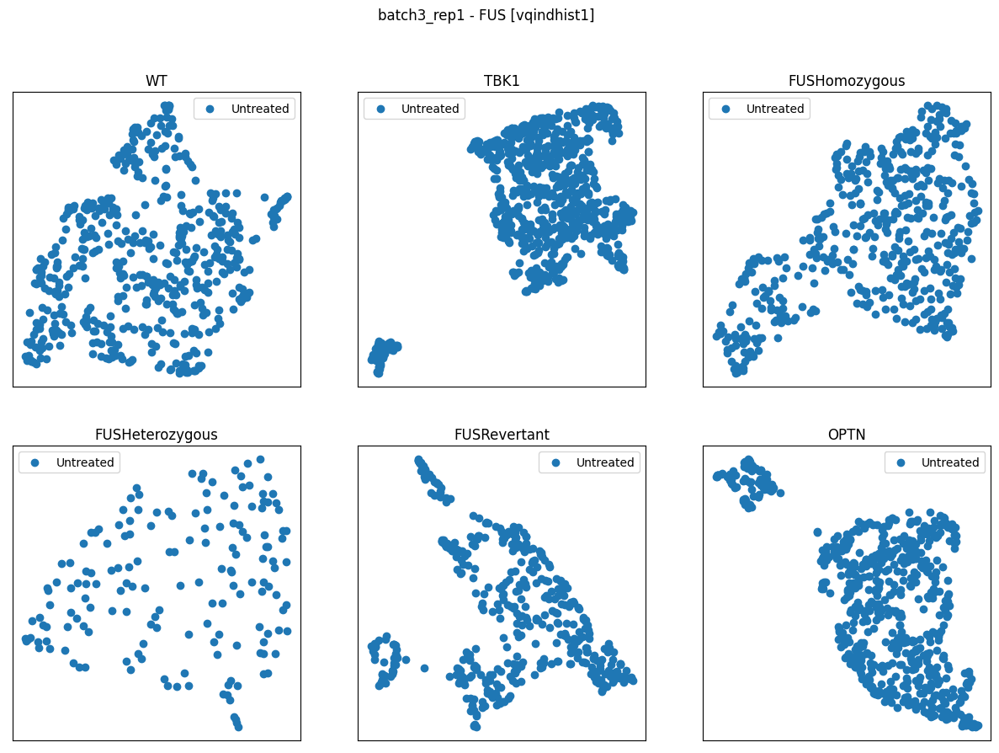

WT (916, 2048) (916,) (916,)
TBK1 (1113, 2048) (1113,) (1113,)
FUSHomozygous (507, 2048) (507,) (507,)
FUSHeterozygous (146, 2048) (146,) (146,)
FUSRevertant (582, 2048) (582,) (582,)
OPTN (921, 2048) (921,) (921,)


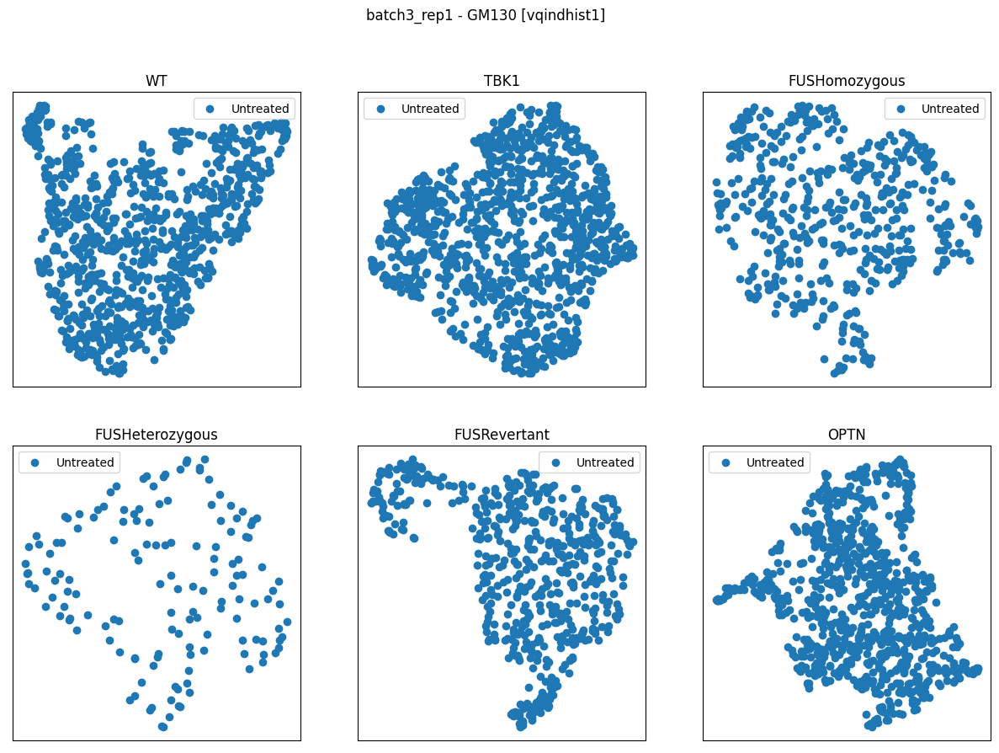

WT (819, 2048) (819,) (819,)
TBK1 (952, 2048) (952,) (952,)
FUSHomozygous (578, 2048) (578,) (578,)
FUSHeterozygous (98, 2048) (98,) (98,)
FUSRevertant (446, 2048) (446,) (446,)
OPTN (803, 2048) (803,) (803,)


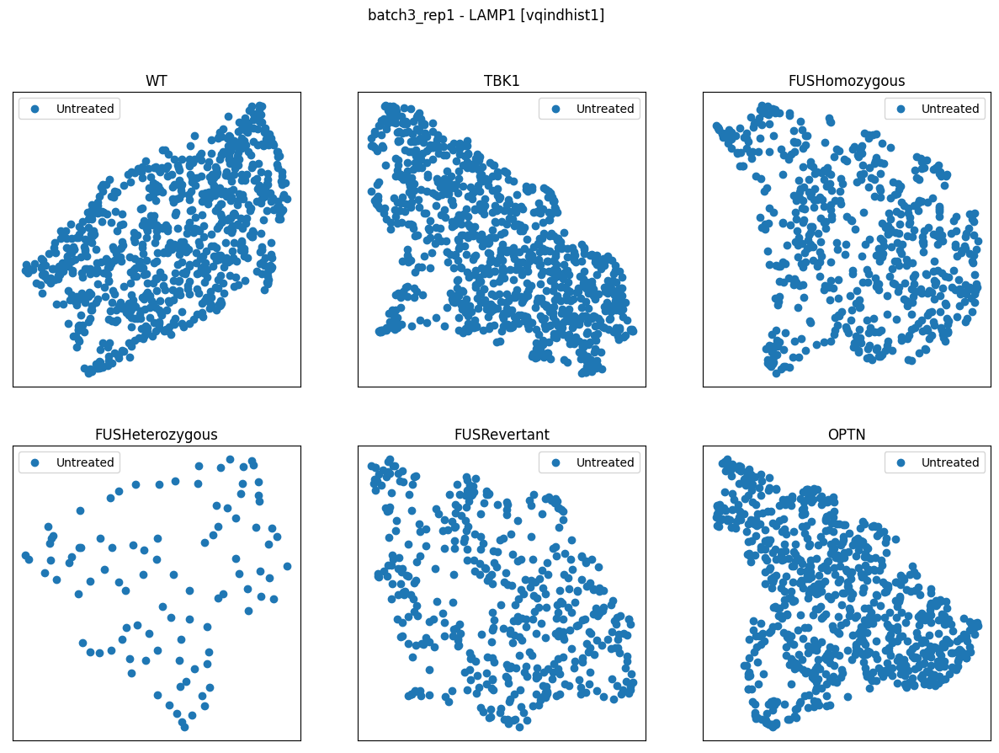

WT (525, 2048) (525,) (525,)
TBK1 (812, 2048) (812,) (812,)
FUSHomozygous (502, 2048) (502,) (502,)
FUSHeterozygous (165, 2048) (165,) (165,)
FUSRevertant (456, 2048) (456,) (456,)
OPTN (666, 2048) (666,) (666,)


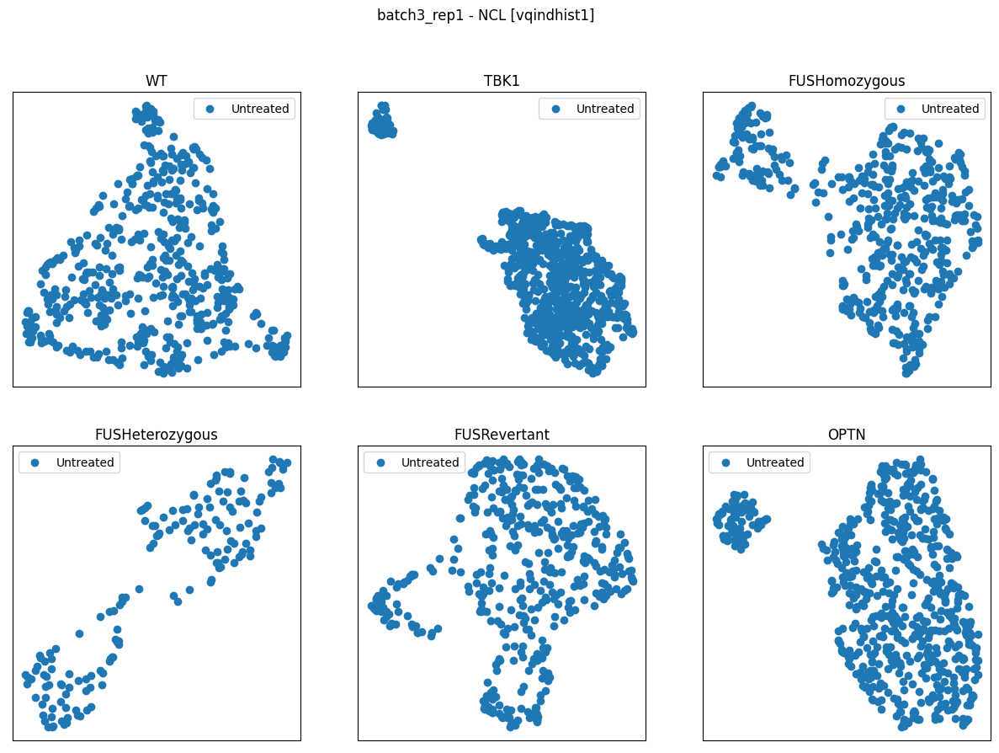

WT (1016, 2048) (1016,) (1016,)
TBK1 (1079, 2048) (1079,) (1079,)
FUSHomozygous (531, 2048) (531,) (531,)
FUSHeterozygous (193, 2048) (193,) (193,)
FUSRevertant (587, 2048) (587,) (587,)
OPTN (848, 2048) (848,) (848,)


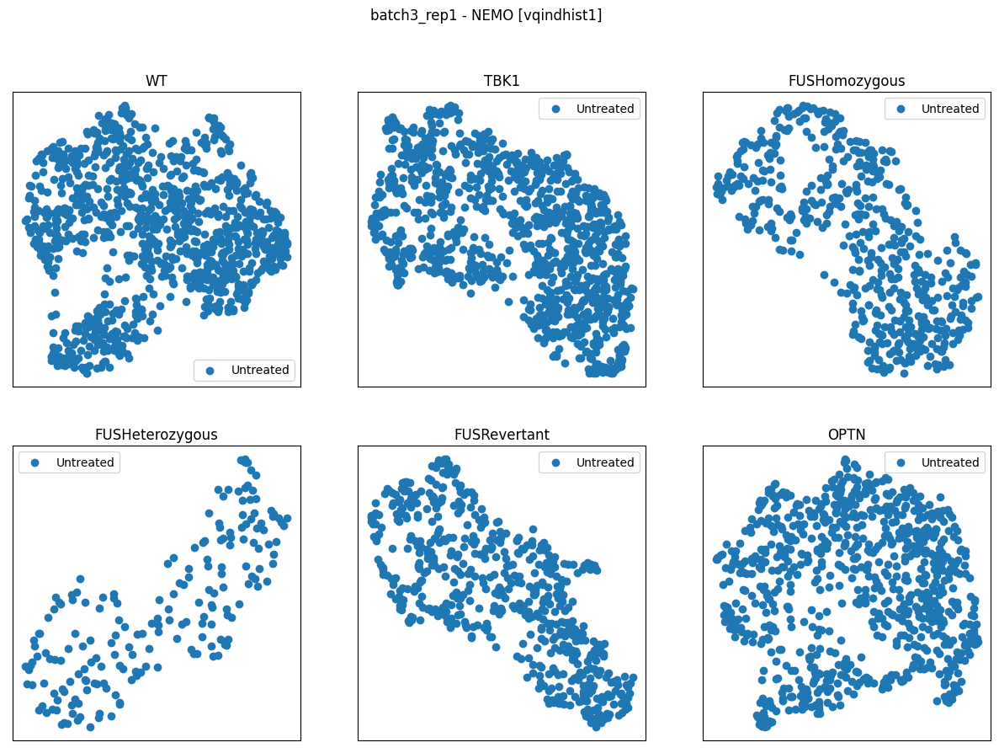

WT (634, 2048) (634,) (634,)
TBK1 (829, 2048) (829,) (829,)
FUSHomozygous (315, 2048) (315,) (315,)
FUSHeterozygous (123, 2048) (123,) (123,)
FUSRevertant (503, 2048) (503,) (503,)
OPTN (785, 2048) (785,) (785,)


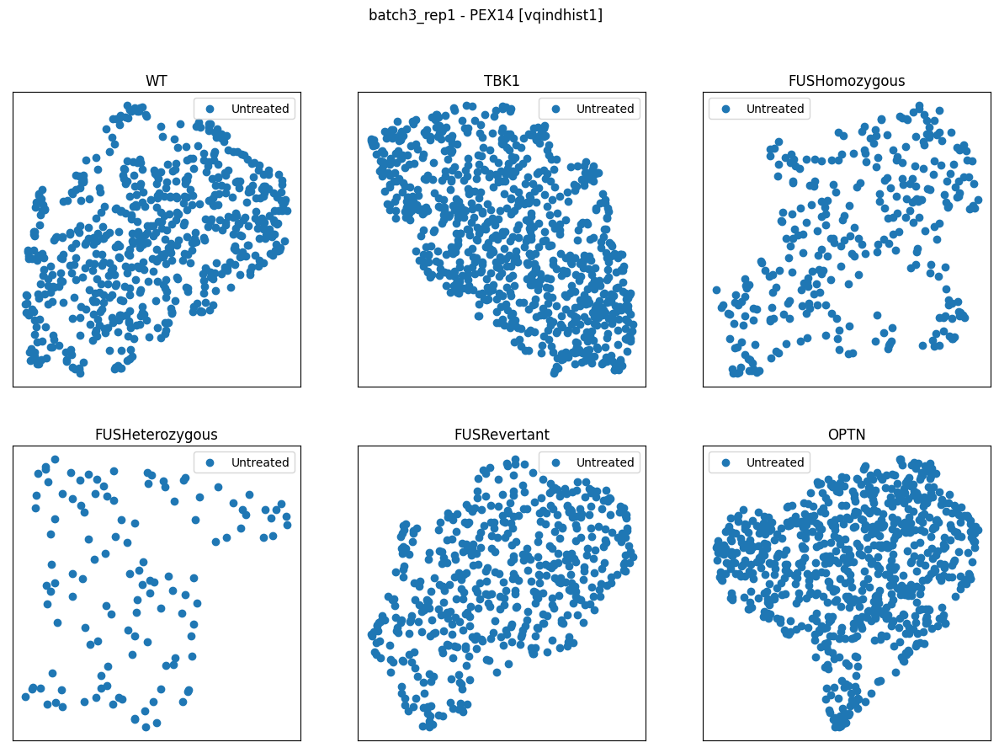

WT (634, 2048) (634,) (634,)
TBK1 (829, 2048) (829,) (829,)
FUSHomozygous (315, 2048) (315,) (315,)
FUSHeterozygous (123, 2048) (123,) (123,)
FUSRevertant (503, 2048) (503,) (503,)
OPTN (785, 2048) (785,) (785,)


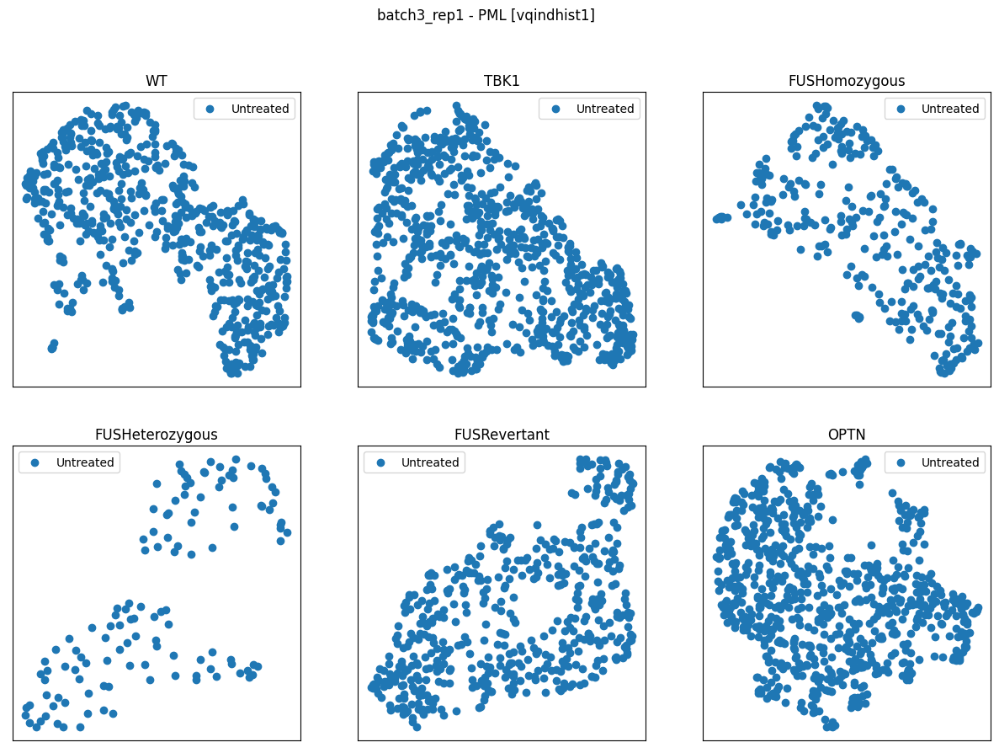

WT (764, 2048) (764,) (764,)
TBK1 (912, 2048) (912,) (912,)
FUSHomozygous (389, 2048) (389,) (389,)
FUSHeterozygous (86, 2048) (86,) (86,)
FUSRevertant (466, 2048) (466,) (466,)
OPTN (648, 2048) (648,) (648,)


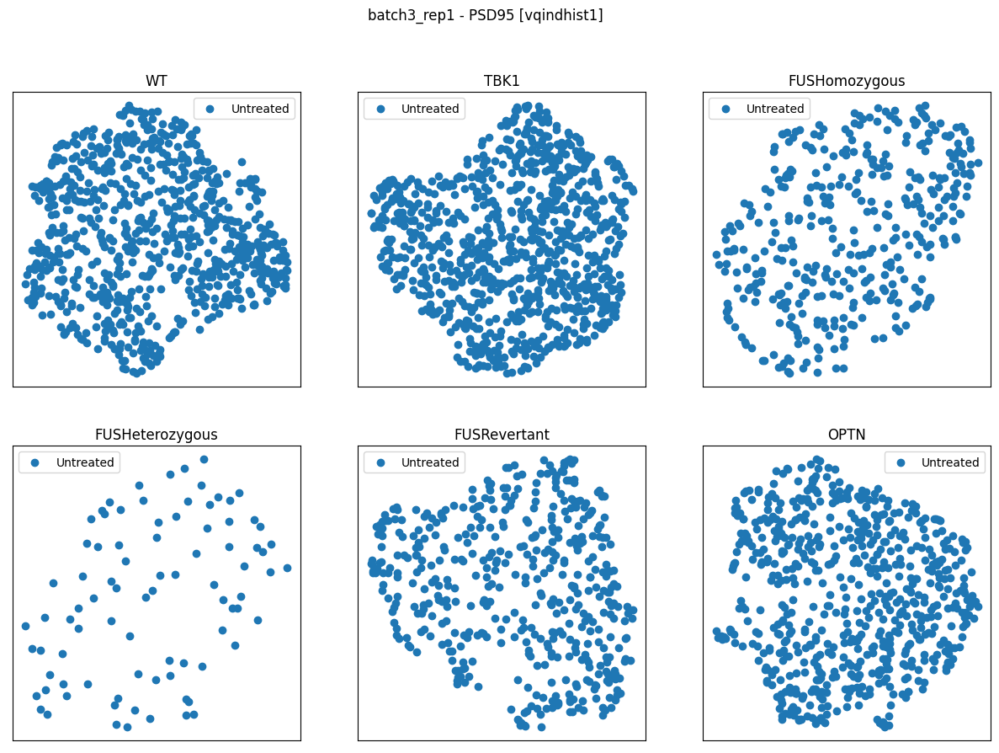

WT (827, 2048) (827,) (827,)
TBK1 (1006, 2048) (1006,) (1006,)
FUSHomozygous (460, 2048) (460,) (460,)
FUSHeterozygous (154, 2048) (154,) (154,)
FUSRevertant (196, 2048) (196,) (196,)
OPTN (552, 2048) (552,) (552,)


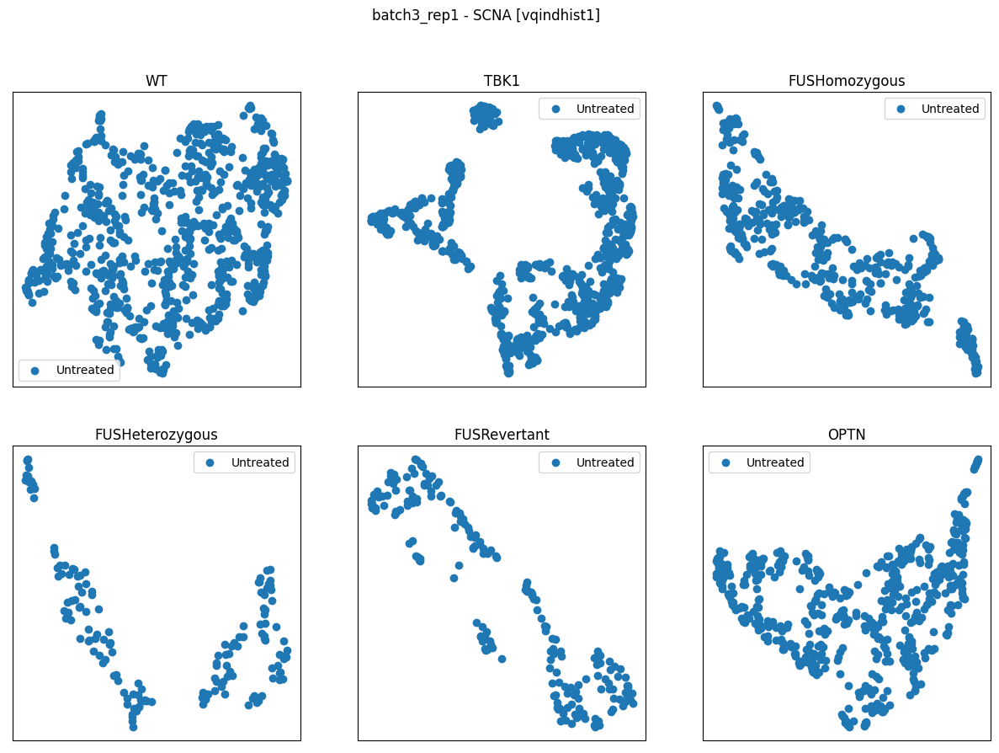

WT (141, 2048) (141,) (141,)
TBK1 (364, 2048) (364,) (364,)
FUSHomozygous (73, 2048) (73,) (73,)
FUSHeterozygous (79, 2048) (79,) (79,)
FUSRevertant (362, 2048) (362,) (362,)
OPTN (443, 2048) (443,) (443,)


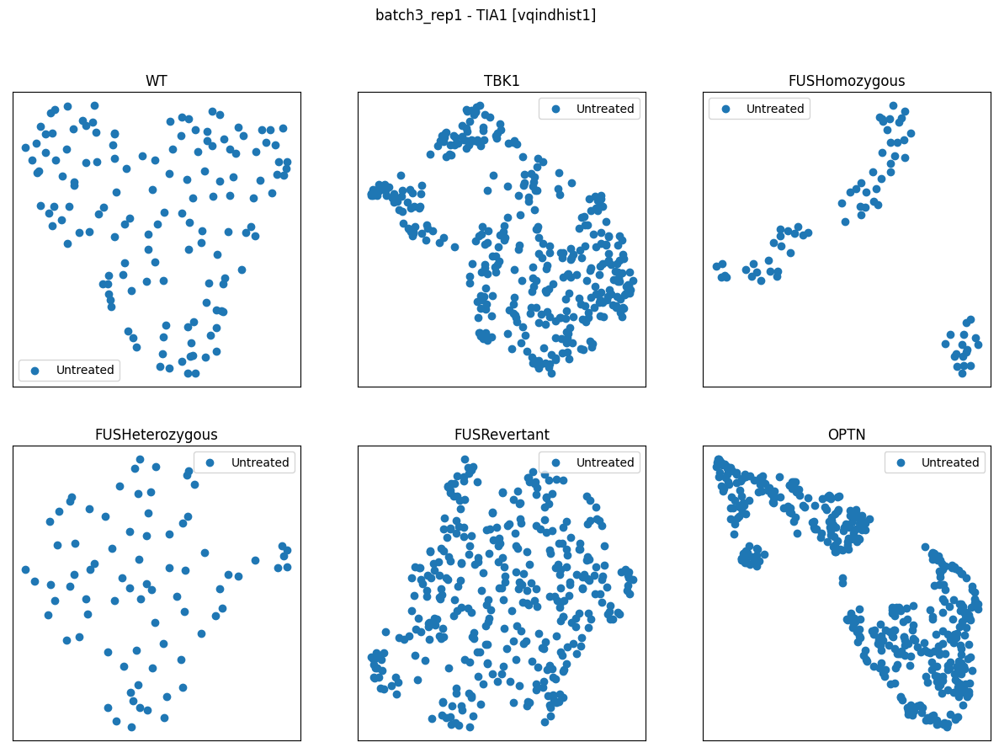

WT (916, 2048) (916,) (916,)
TBK1 (1113, 2048) (1113,) (1113,)
FUSHomozygous (507, 2048) (507,) (507,)
FUSHeterozygous (146, 2048) (146,) (146,)
FUSRevertant (582, 2048) (582,) (582,)
OPTN (921, 2048) (921,) (921,)


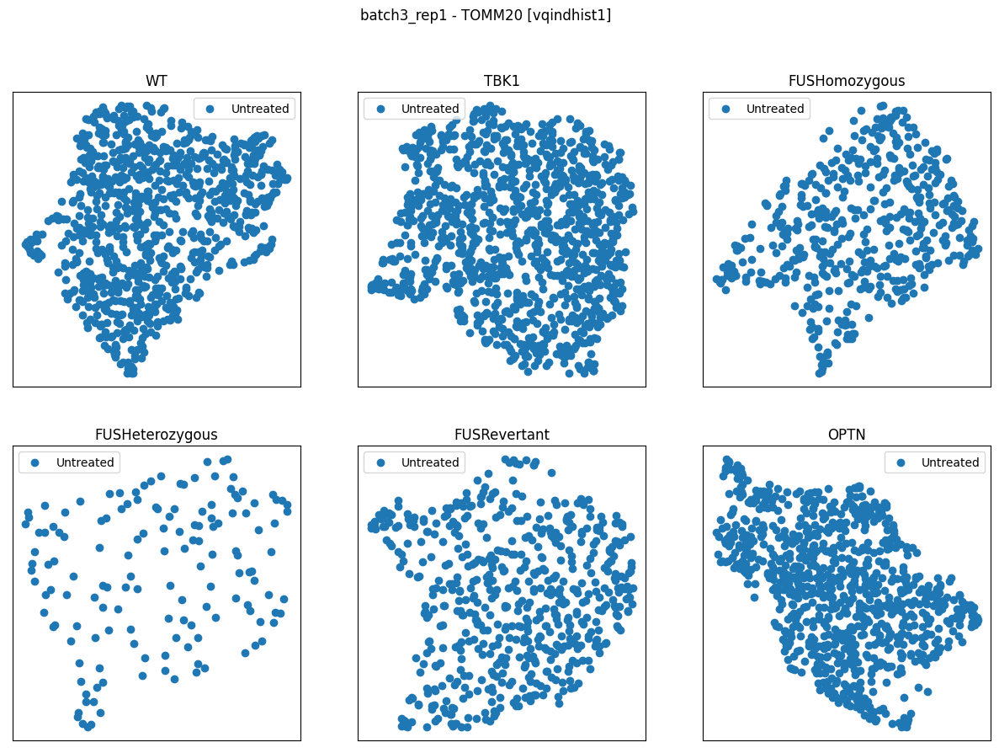

WT (634, 2048) (634,) (634,)
TBK1 (829, 2048) (829,) (829,)
FUSHomozygous (315, 2048) (315,) (315,)
FUSHeterozygous (123, 2048) (123,) (123,)
FUSRevertant (503, 2048) (503,) (503,)
OPTN (785, 2048) (785,) (785,)


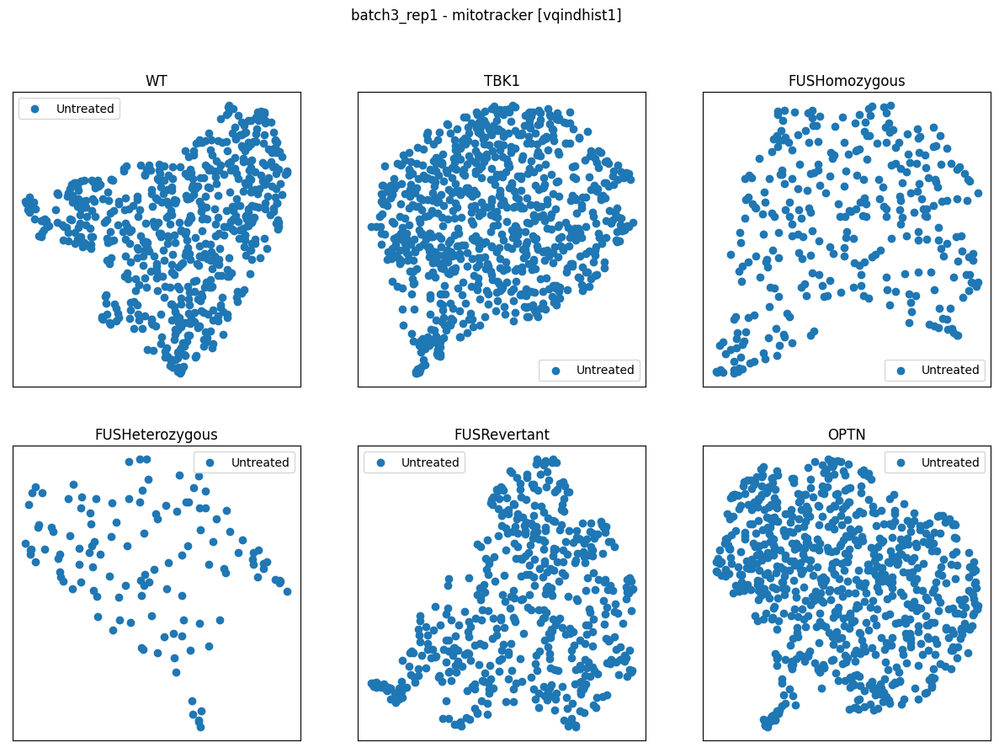

3 rep2
WT (855, 2048) (855,) (855,)
TBK1 (1177, 2048) (1177,) (1177,)
FUSHomozygous (535, 2048) (535,) (535,)
FUSHeterozygous (175, 2048) (175,) (175,)
FUSRevertant (668, 2048) (668,) (668,)
OPTN (738, 2048) (738,) (738,)


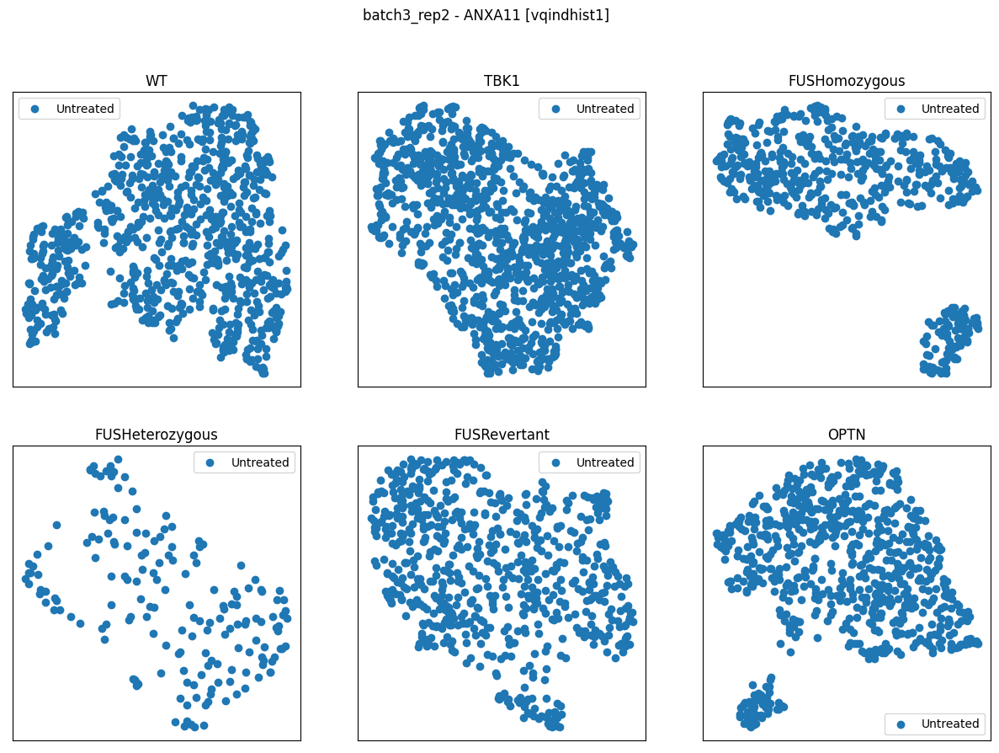

WT (1067, 2048) (1067,) (1067,)
TBK1 (1112, 2048) (1112,) (1112,)
FUSHomozygous (495, 2048) (495,) (495,)
FUSHeterozygous (194, 2048) (194,) (194,)
FUSRevertant (605, 2048) (605,) (605,)
OPTN (842, 2048) (842,) (842,)


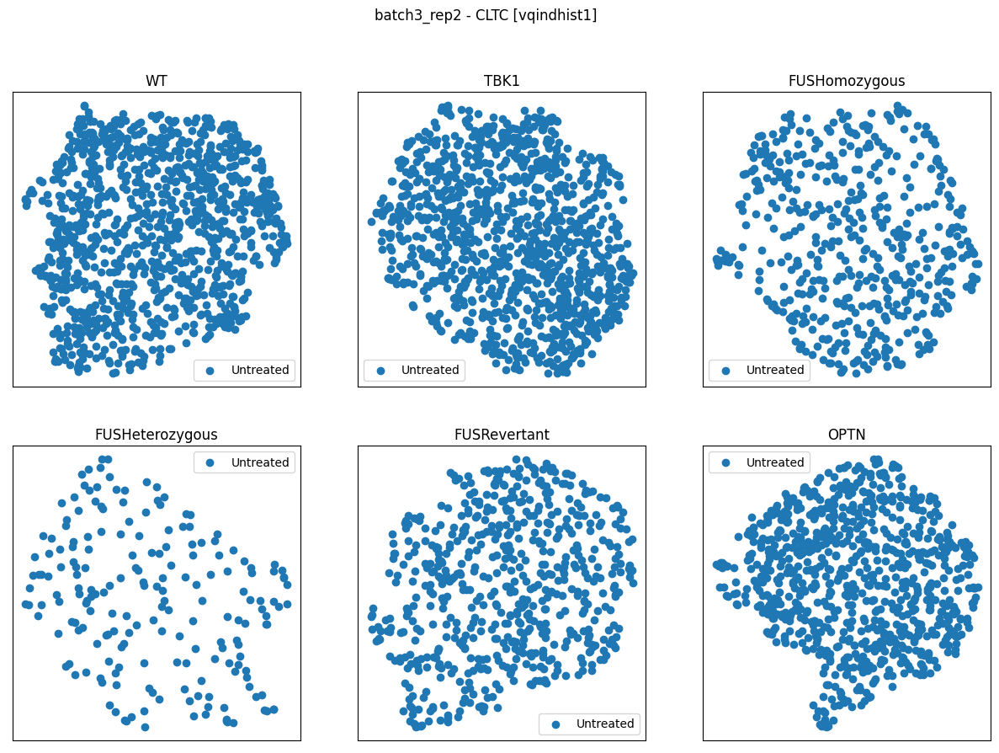

WT (888, 2048) (888,) (888,)
TBK1 (1101, 2048) (1101,) (1101,)
FUSHomozygous (680, 2048) (680,) (680,)
FUSHeterozygous (79, 2048) (79,) (79,)
FUSRevertant (540, 2048) (540,) (540,)
OPTN (999, 2048) (999,) (999,)


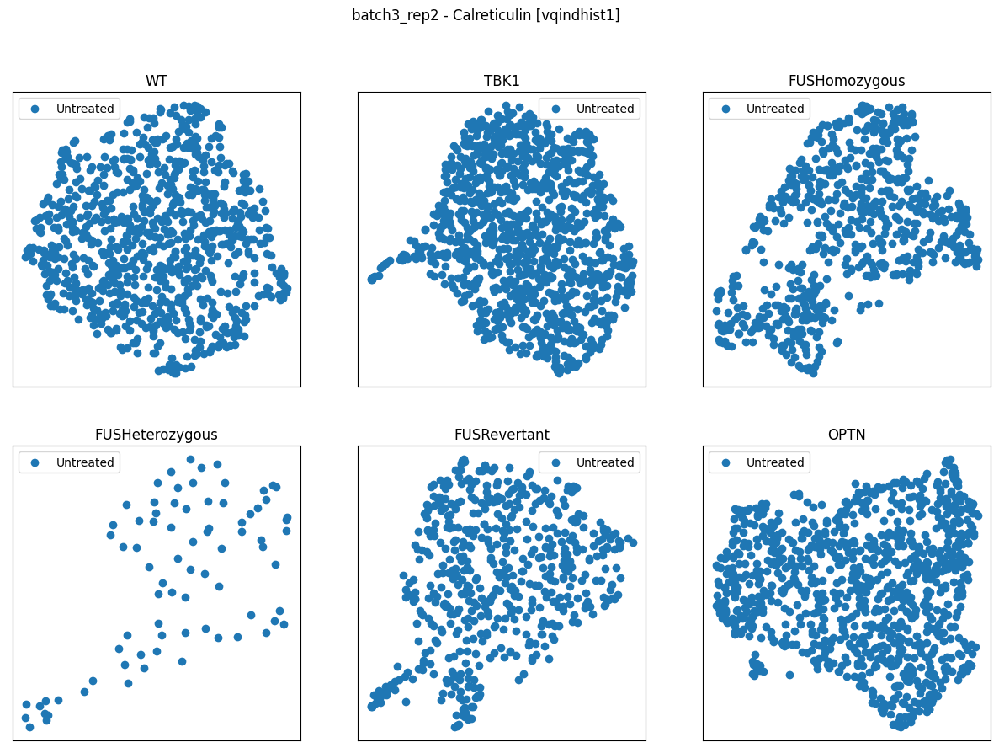

WT (969, 2048) (969,) (969,)
TBK1 (1115, 2048) (1115,) (1115,)
FUSHomozygous (488, 2048) (488,) (488,)
FUSHeterozygous (141, 2048) (141,) (141,)
FUSRevertant (433, 2048) (433,) (433,)
OPTN (944, 2048) (944,) (944,)


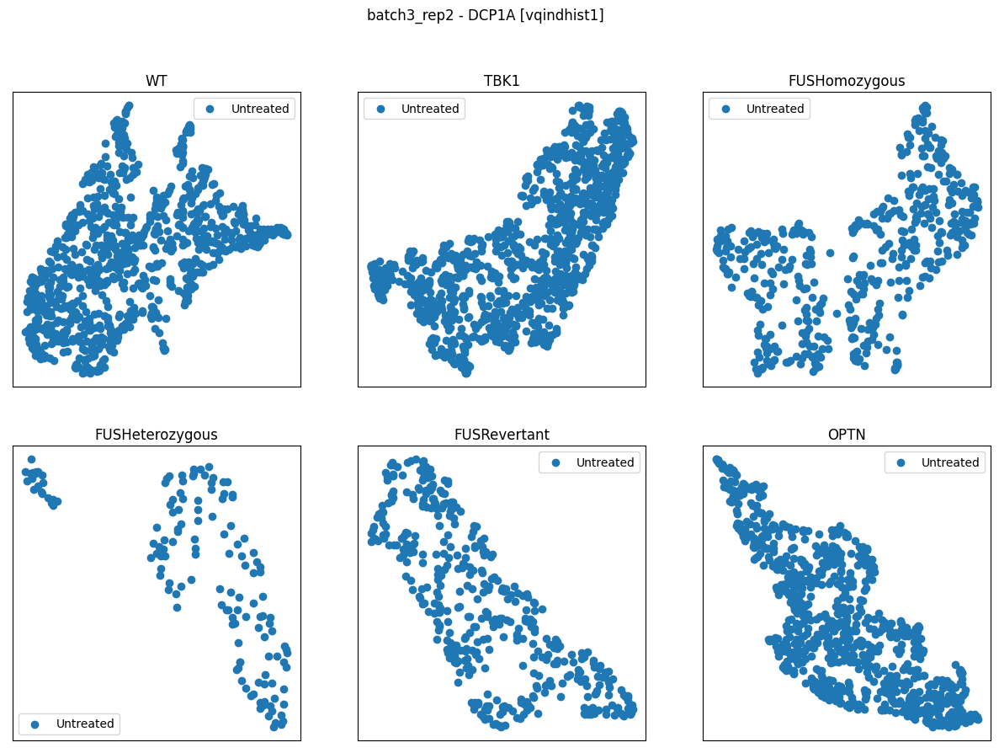

WT (906, 2048) (906,) (906,)
TBK1 (1172, 2048) (1172,) (1172,)
FUSHomozygous (705, 2048) (705,) (705,)
FUSHeterozygous (245, 2048) (245,) (245,)
FUSRevertant (666, 2048) (666,) (666,)
OPTN (674, 2048) (674,) (674,)


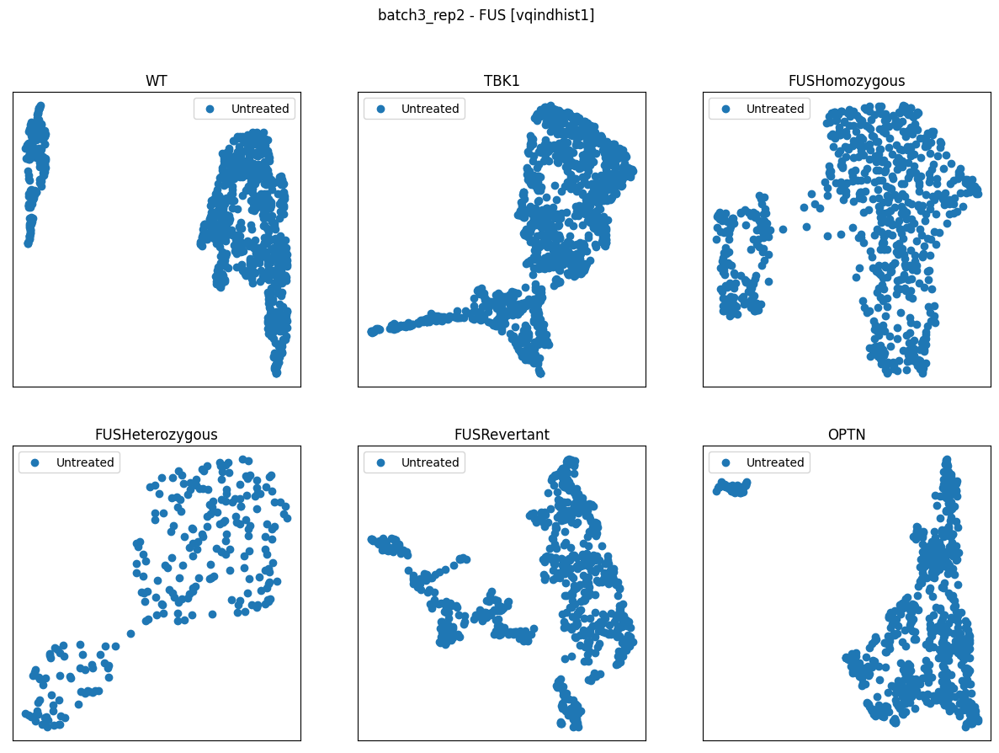

WT (842, 2048) (842,) (842,)
TBK1 (1075, 2048) (1075,) (1075,)
FUSHomozygous (455, 2048) (455,) (455,)
FUSHeterozygous (144, 2048) (144,) (144,)
FUSRevertant (520, 2048) (520,) (520,)
OPTN (776, 2048) (776,) (776,)


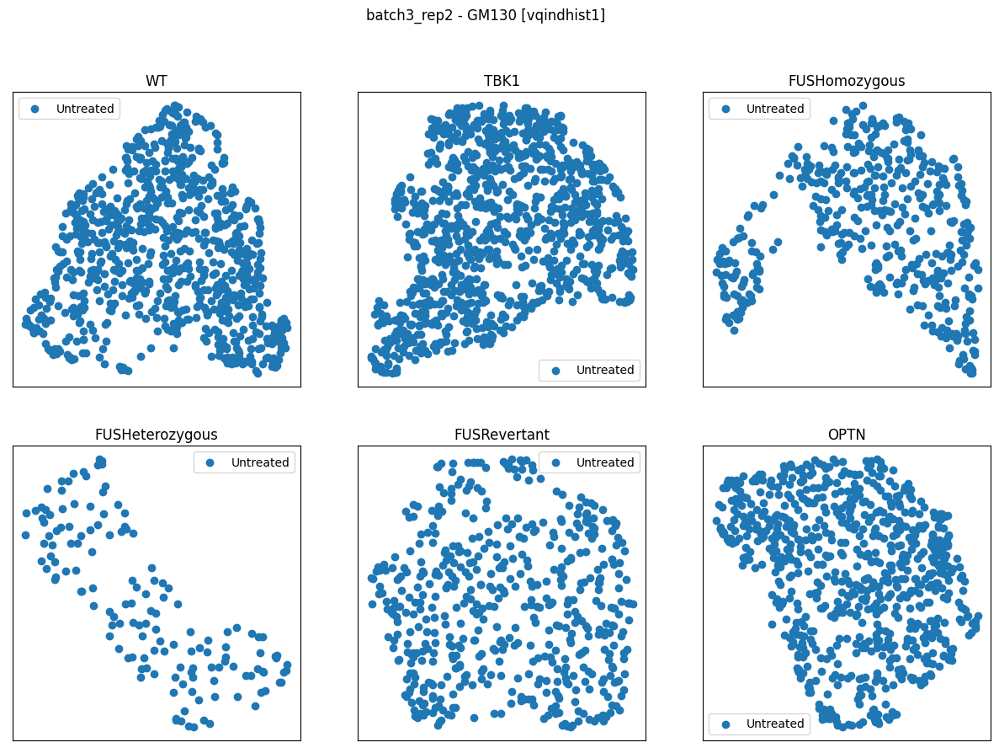

WT (888, 2048) (888,) (888,)
TBK1 (1101, 2048) (1101,) (1101,)
FUSHomozygous (680, 2048) (680,) (680,)
FUSHeterozygous (79, 2048) (79,) (79,)
FUSRevertant (540, 2048) (540,) (540,)
OPTN (999, 2048) (999,) (999,)


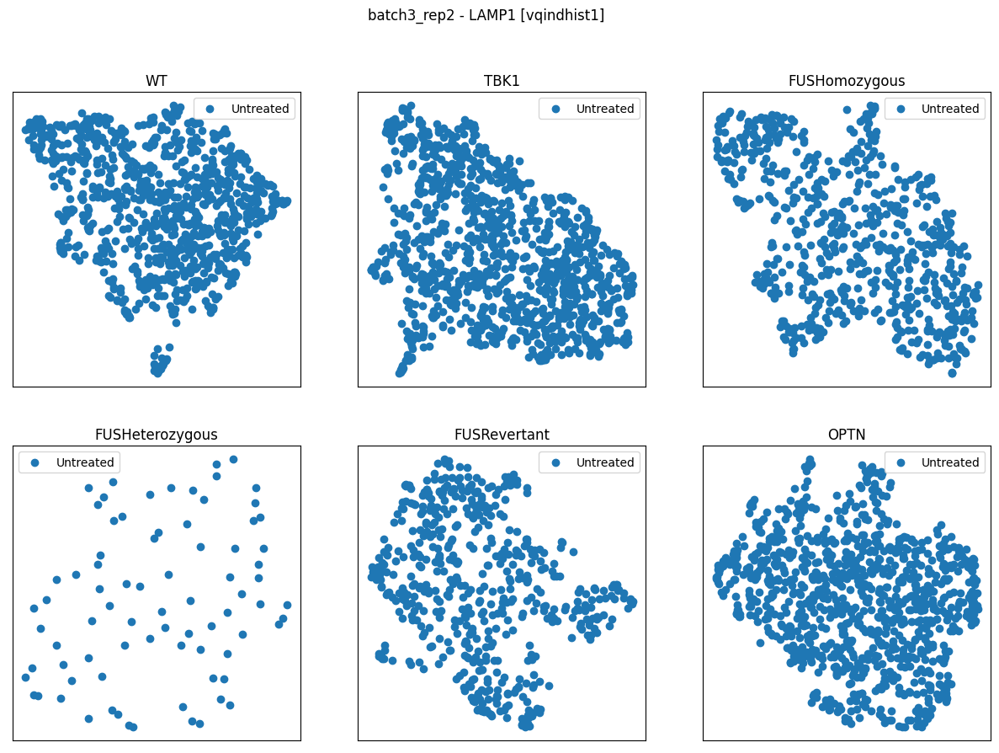

WT (906, 2048) (906,) (906,)
TBK1 (1172, 2048) (1172,) (1172,)
FUSHomozygous (705, 2048) (705,) (705,)
FUSHeterozygous (245, 2048) (245,) (245,)
FUSRevertant (666, 2048) (666,) (666,)
OPTN (674, 2048) (674,) (674,)


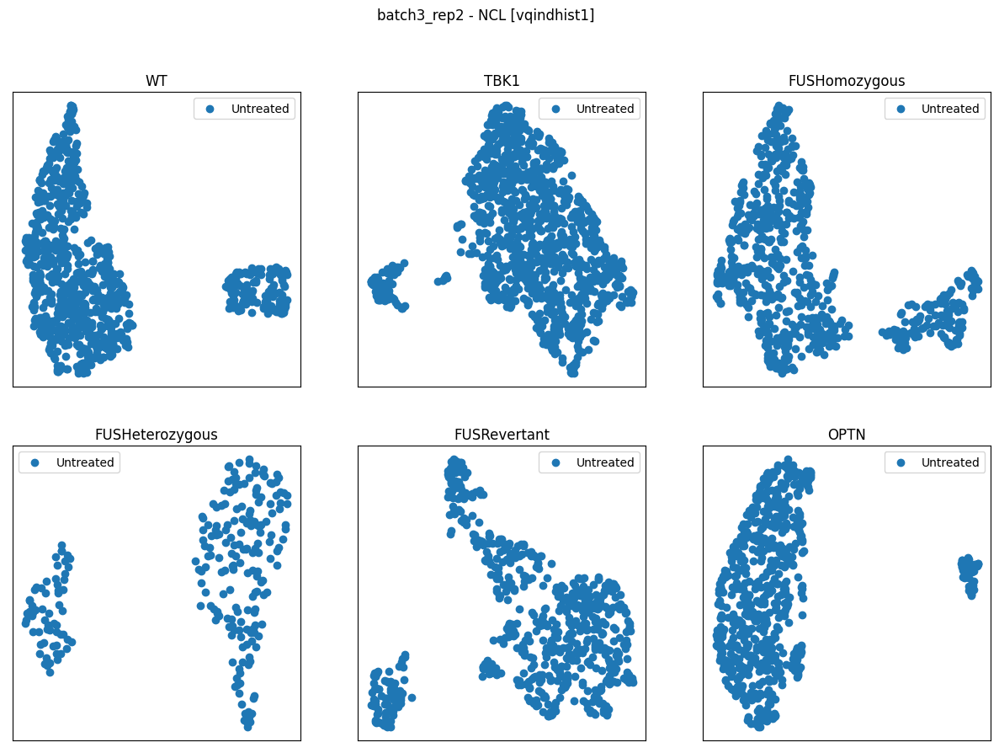

WT (969, 2048) (969,) (969,)
TBK1 (1115, 2048) (1115,) (1115,)
FUSHomozygous (488, 2048) (488,) (488,)
FUSHeterozygous (141, 2048) (141,) (141,)
FUSRevertant (433, 2048) (433,) (433,)
OPTN (944, 2048) (944,) (944,)


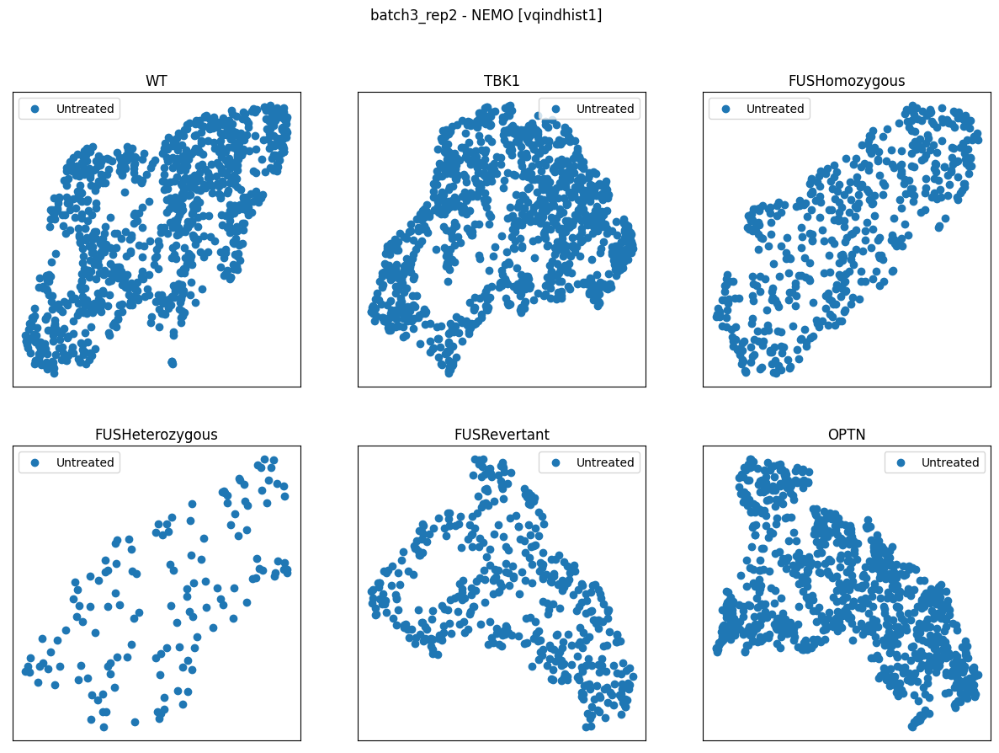

WT (589, 2048) (589,) (589,)
TBK1 (824, 2048) (824,) (824,)
FUSHomozygous (541, 2048) (541,) (541,)
FUSHeterozygous (117, 2048) (117,) (117,)
FUSRevertant (574, 2048) (574,) (574,)
OPTN (819, 2048) (819,) (819,)


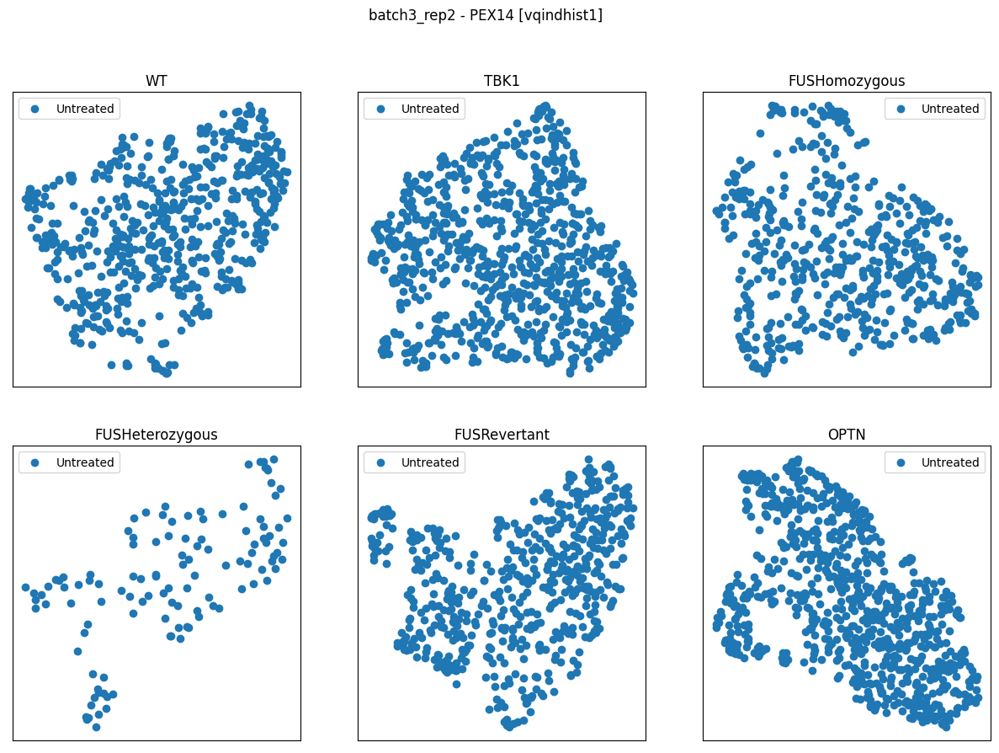

WT (589, 2048) (589,) (589,)
TBK1 (824, 2048) (824,) (824,)
FUSHomozygous (541, 2048) (541,) (541,)
FUSHeterozygous (117, 2048) (117,) (117,)
FUSRevertant (574, 2048) (574,) (574,)
OPTN (819, 2048) (819,) (819,)


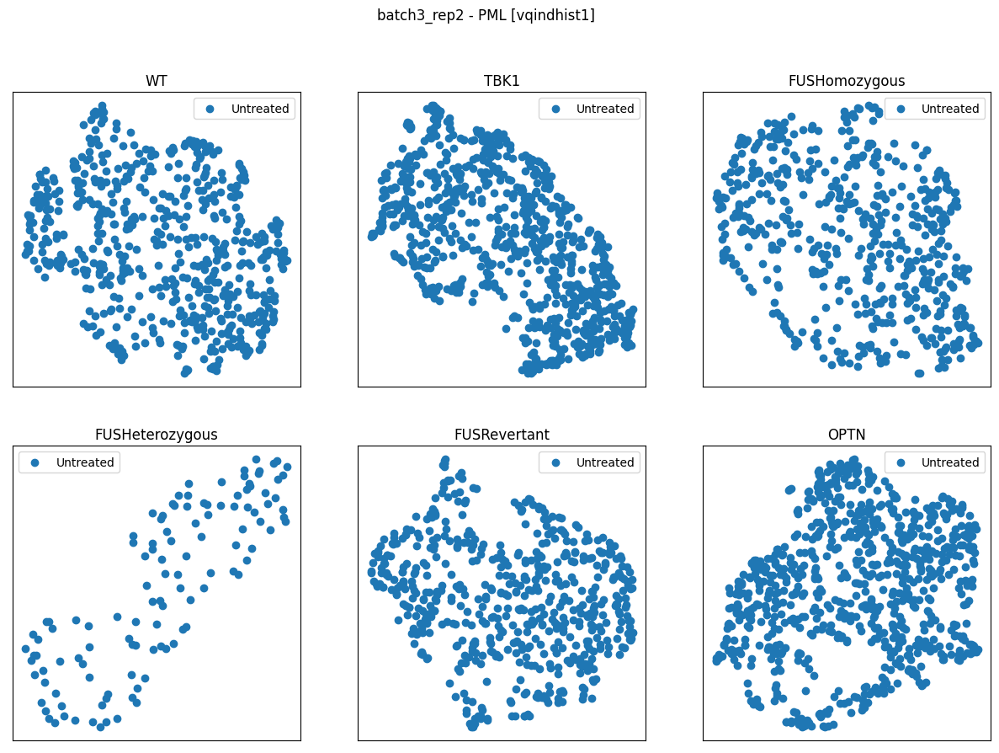

WT (1067, 2048) (1067,) (1067,)
TBK1 (1112, 2048) (1112,) (1112,)
FUSHomozygous (495, 2048) (495,) (495,)
FUSHeterozygous (194, 2048) (194,) (194,)
FUSRevertant (605, 2048) (605,) (605,)
OPTN (842, 2048) (842,) (842,)


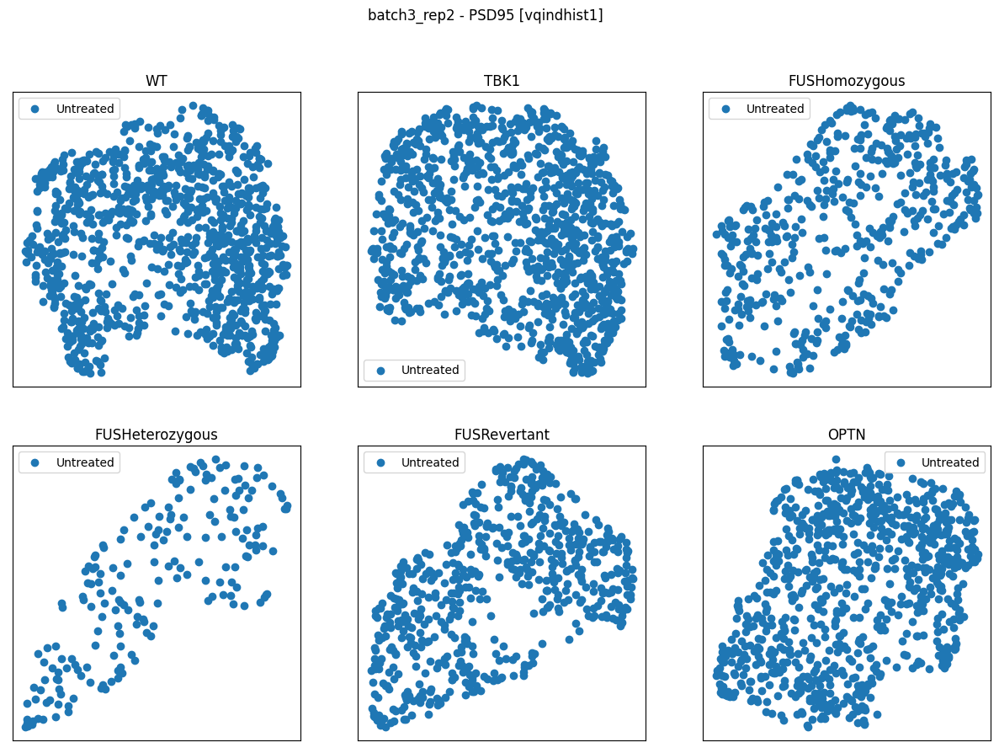

WT (855, 2048) (855,) (855,)
TBK1 (1177, 2048) (1177,) (1177,)
FUSHomozygous (535, 2048) (535,) (535,)
FUSHeterozygous (175, 2048) (175,) (175,)
FUSRevertant (668, 2048) (668,) (668,)
OPTN (738, 2048) (738,) (738,)


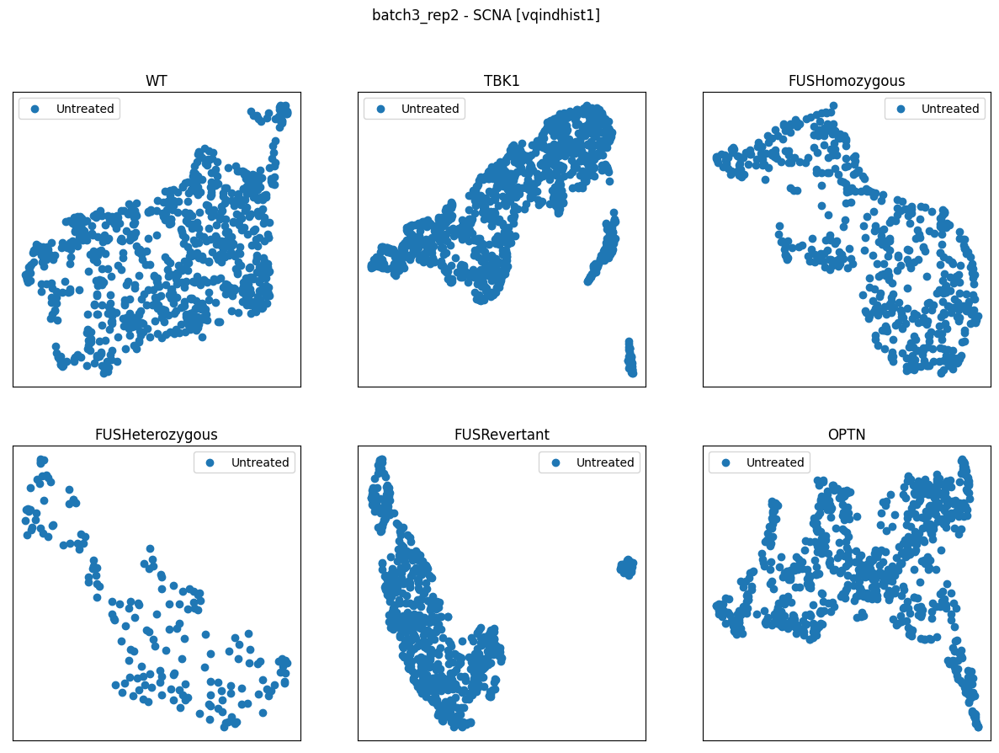

WT (685, 2048) (685,) (685,)
TBK1 (853, 2048) (853,) (853,)
FUSHomozygous (474, 2048) (474,) (474,)
FUSHeterozygous (153, 2048) (153,) (153,)
FUSRevertant (416, 2048) (416,) (416,)
OPTN (827, 2048) (827,) (827,)


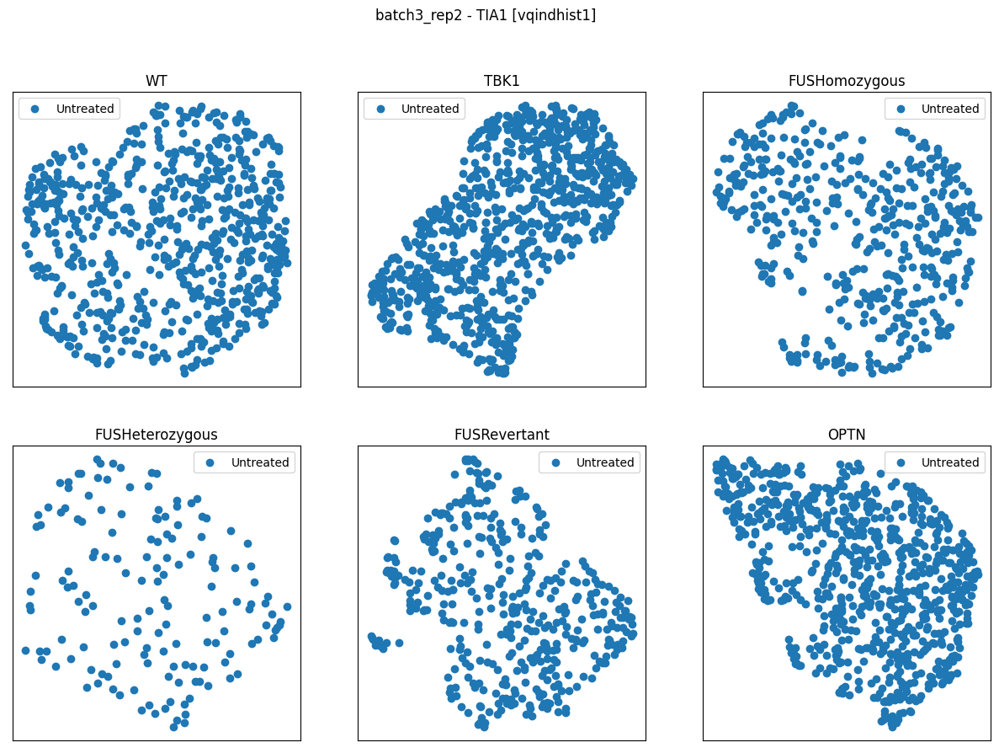

WT (842, 2048) (842,) (842,)
TBK1 (1075, 2048) (1075,) (1075,)
FUSHomozygous (455, 2048) (455,) (455,)
FUSHeterozygous (144, 2048) (144,) (144,)
FUSRevertant (520, 2048) (520,) (520,)
OPTN (776, 2048) (776,) (776,)


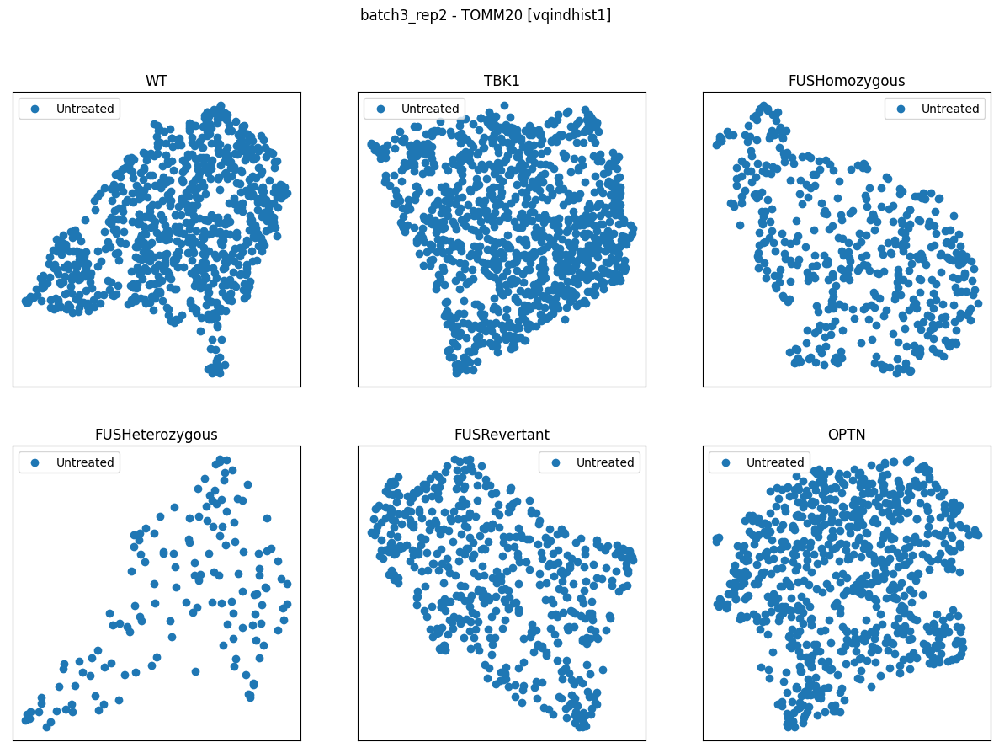

WT (589, 2048) (589,) (589,)
TBK1 (824, 2048) (824,) (824,)
FUSHomozygous (541, 2048) (541,) (541,)
FUSHeterozygous (117, 2048) (117,) (117,)
FUSRevertant (574, 2048) (574,) (574,)
OPTN (819, 2048) (819,) (819,)


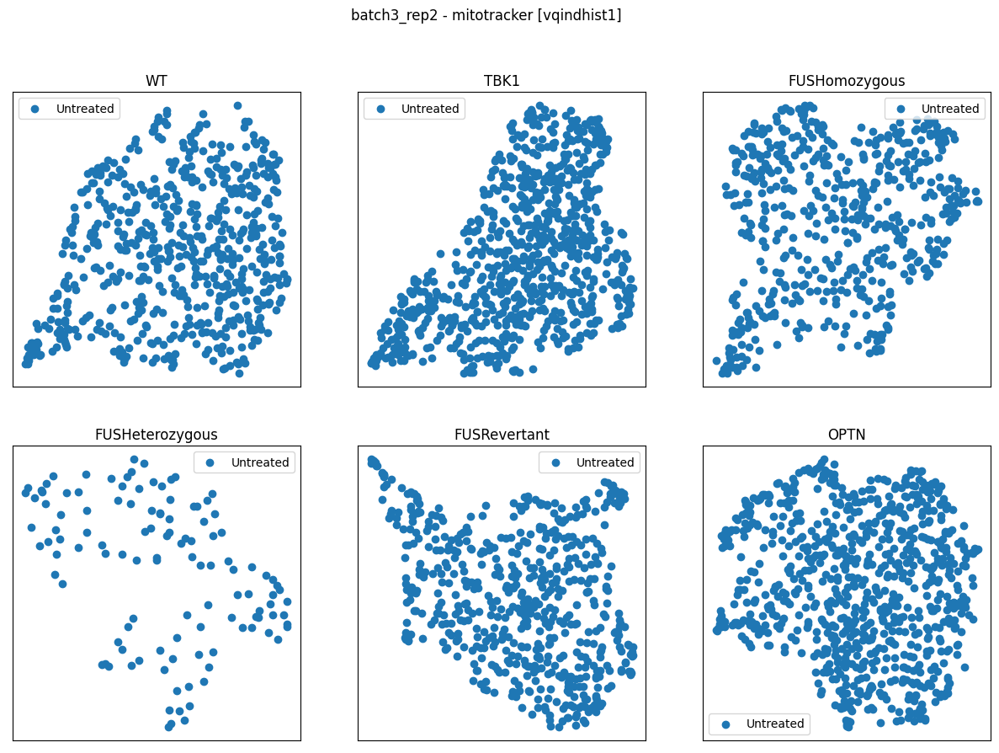

(226306, 2048) (226306,) (226306,)
4 rep1
WT (627, 2048) (627,) (627,)
TBK1 (421, 2048) (421,) (421,)
FUSHomozygous (232, 2048) (232,) (232,)
FUSHeterozygous (49, 2048) (49,) (49,)


/home/labs/hornsteinlab/Collaboration/MOmaps/anaconda3/momaps_torch/lib/python3.9/site-packages/umap/umap_.py:125: UserWarning: A few of your vertices were disconnected from the manifold.  This shouldn't cause problems.
Disconnection_distance = inf has removed 96 edges.
It has only fully disconnected 1 vertices.
Use umap.utils.disconnected_vertices() to identify them.
  warn(


FUSRevertant (176, 2048) (176,) (176,)
OPTN (533, 2048) (533,) (533,)


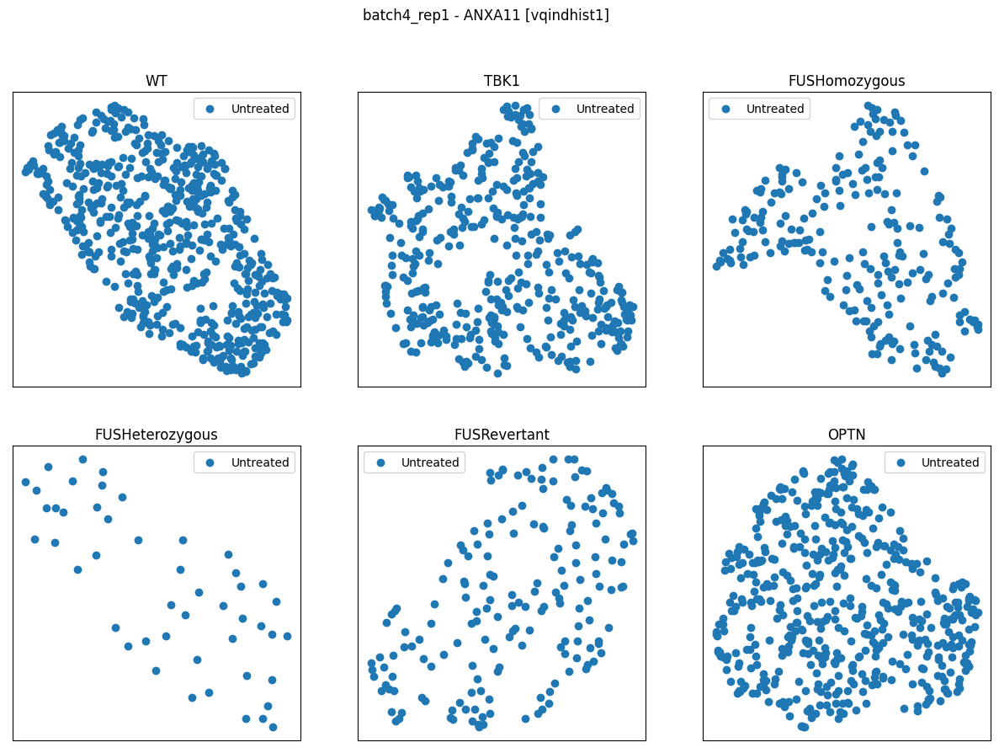

WT (860, 2048) (860,) (860,)
TBK1 (683, 2048) (683,) (683,)
FUSHomozygous (455, 2048) (455,) (455,)
FUSHeterozygous (61, 2048) (61,) (61,)
FUSRevertant (445, 2048) (445,) (445,)
OPTN (885, 2048) (885,) (885,)


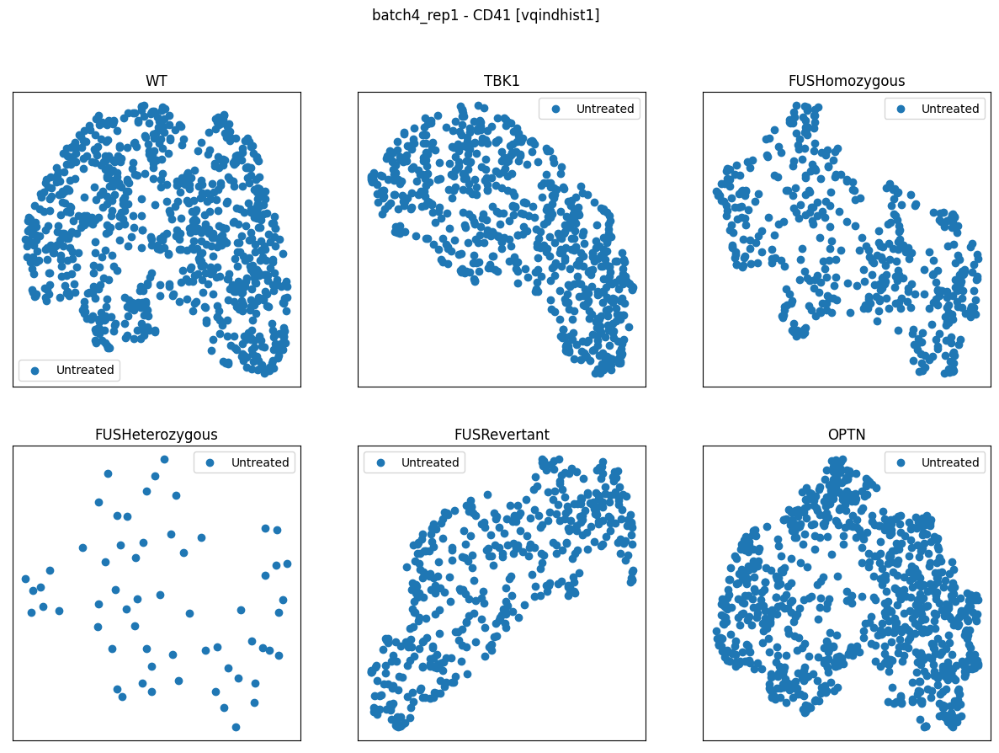

WT (846, 2048) (846,) (846,)
TBK1 (723, 2048) (723,) (723,)
FUSHomozygous (359, 2048) (359,) (359,)
FUSHeterozygous (81, 2048) (81,) (81,)
FUSRevertant (247, 2048) (247,) (247,)
OPTN (822, 2048) (822,) (822,)


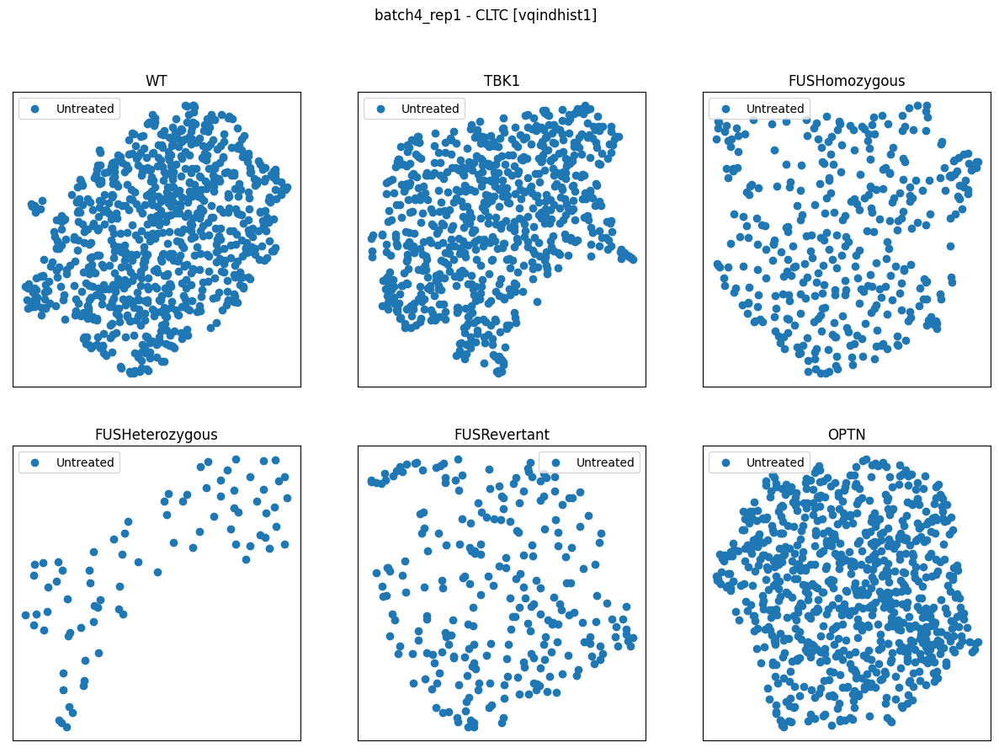

WT (539, 2048) (539,) (539,)
TBK1 (400, 2048) (400,) (400,)
FUSHomozygous (236, 2048) (236,) (236,)
FUSHeterozygous (62, 2048) (62,) (62,)
FUSRevertant (148, 2048) (148,) (148,)
OPTN (519, 2048) (519,) (519,)


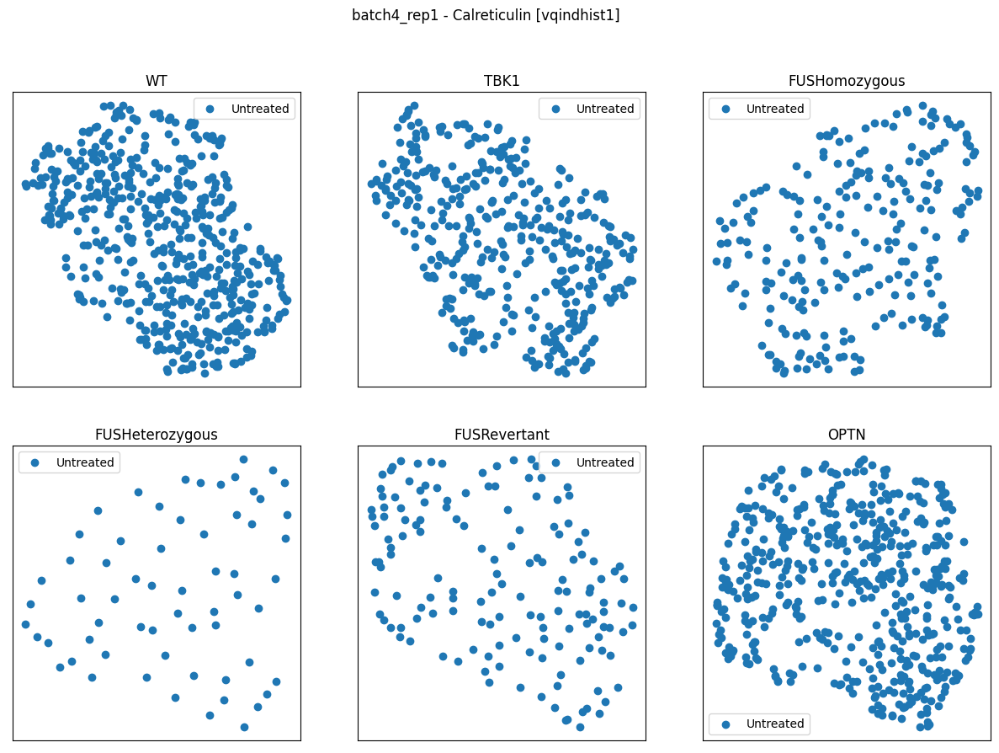

WT (1011, 2048) (1011,) (1011,)
TBK1 (957, 2048) (957,) (957,)
FUSHomozygous (517, 2048) (517,) (517,)
FUSHeterozygous (160, 2048) (160,) (160,)
FUSRevertant (284, 2048) (284,) (284,)
OPTN (965, 2048) (965,) (965,)


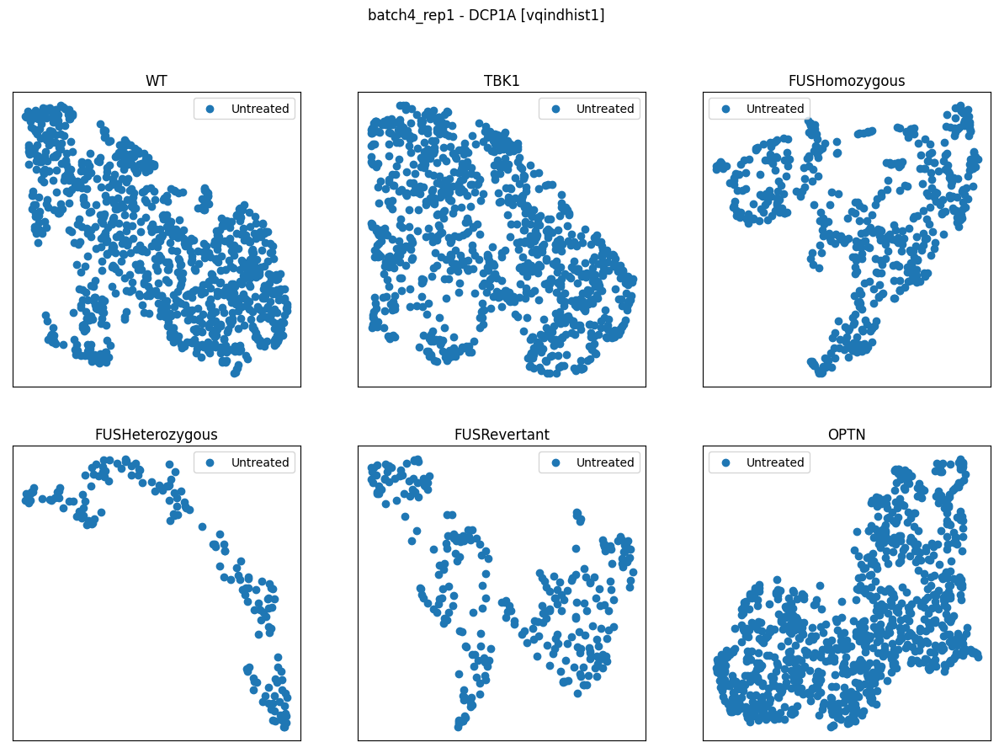

WT (914, 2048) (914,) (914,)
TBK1 (706, 2048) (706,) (706,)
FUSHomozygous (467, 2048) (467,) (467,)
FUSHeterozygous (78, 2048) (78,) (78,)
FUSRevertant (375, 2048) (375,) (375,)
OPTN (813, 2048) (813,) (813,)


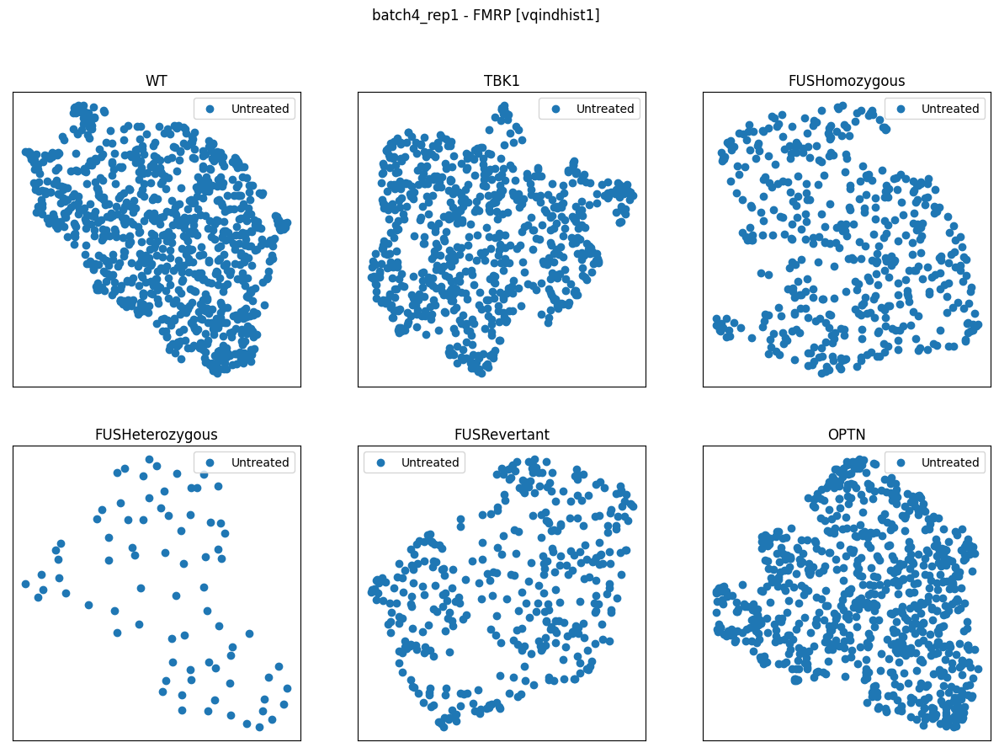

WT (188, 2048) (188,) (188,)
TBK1 (329, 2048) (329,) (329,)
FUSHomozygous (126, 2048) (126,) (126,)
FUSHeterozygous (59, 2048) (59,) (59,)
FUSRevertant (143, 2048) (143,) (143,)
OPTN (434, 2048) (434,) (434,)


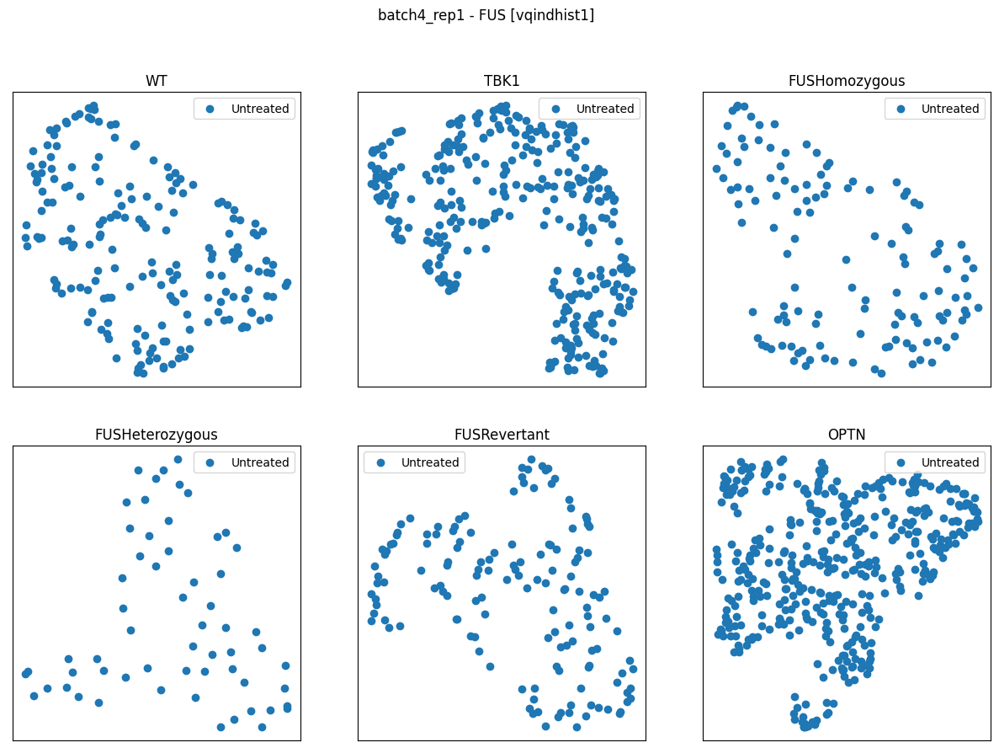

WT (960, 2048) (960,) (960,)
TBK1 (643, 2048) (643,) (643,)
FUSHomozygous (361, 2048) (361,) (361,)
FUSHeterozygous (15, 2048) (15,) (15,)


/home/labs/hornsteinlab/Collaboration/MOmaps/anaconda3/momaps_torch/lib/python3.9/site-packages/umap/umap_.py:2344: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


FUSRevertant (379, 2048) (379,) (379,)
OPTN (898, 2048) (898,) (898,)


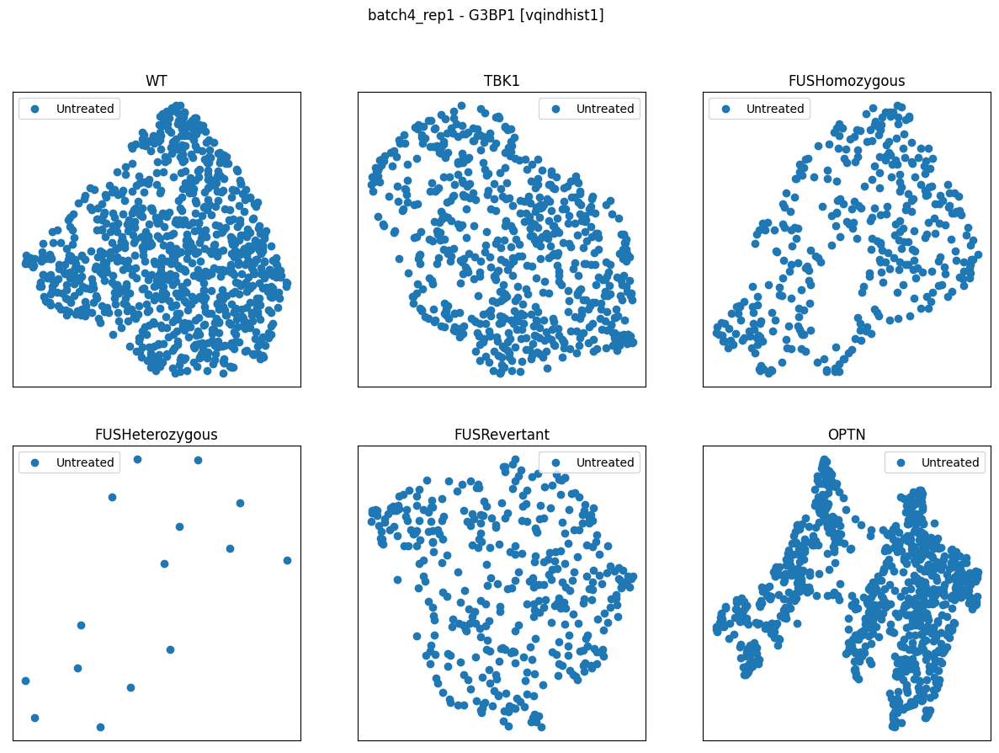

WT (946, 2048) (946,) (946,)
TBK1 (607, 2048) (607,) (607,)
FUSHomozygous (499, 2048) (499,) (499,)
FUSHeterozygous (69, 2048) (69,) (69,)
FUSRevertant (206, 2048) (206,) (206,)
OPTN (407, 2048) (407,) (407,)


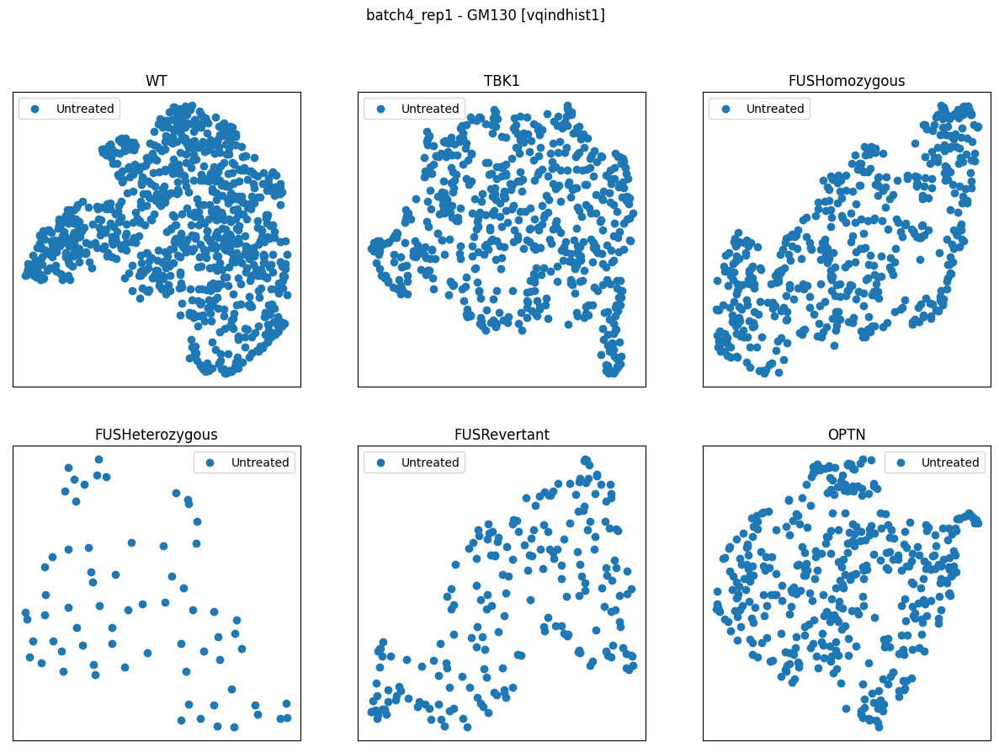

WT (960, 2048) (960,) (960,)
TBK1 (643, 2048) (643,) (643,)
FUSHomozygous (361, 2048) (361,) (361,)
FUSHeterozygous (15, 2048) (15,) (15,)


/home/labs/hornsteinlab/Collaboration/MOmaps/anaconda3/momaps_torch/lib/python3.9/site-packages/umap/umap_.py:2344: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


FUSRevertant (379, 2048) (379,) (379,)
OPTN (898, 2048) (898,) (898,)


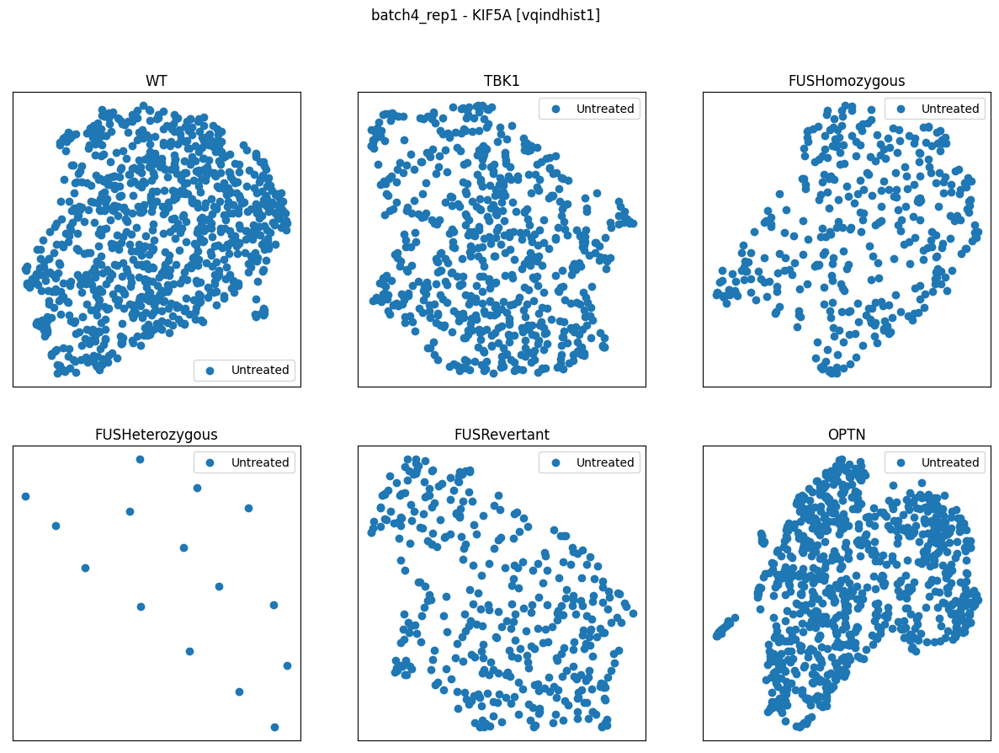

WT (539, 2048) (539,) (539,)
TBK1 (400, 2048) (400,) (400,)
FUSHomozygous (236, 2048) (236,) (236,)
FUSHeterozygous (62, 2048) (62,) (62,)
FUSRevertant (148, 2048) (148,) (148,)
OPTN (519, 2048) (519,) (519,)


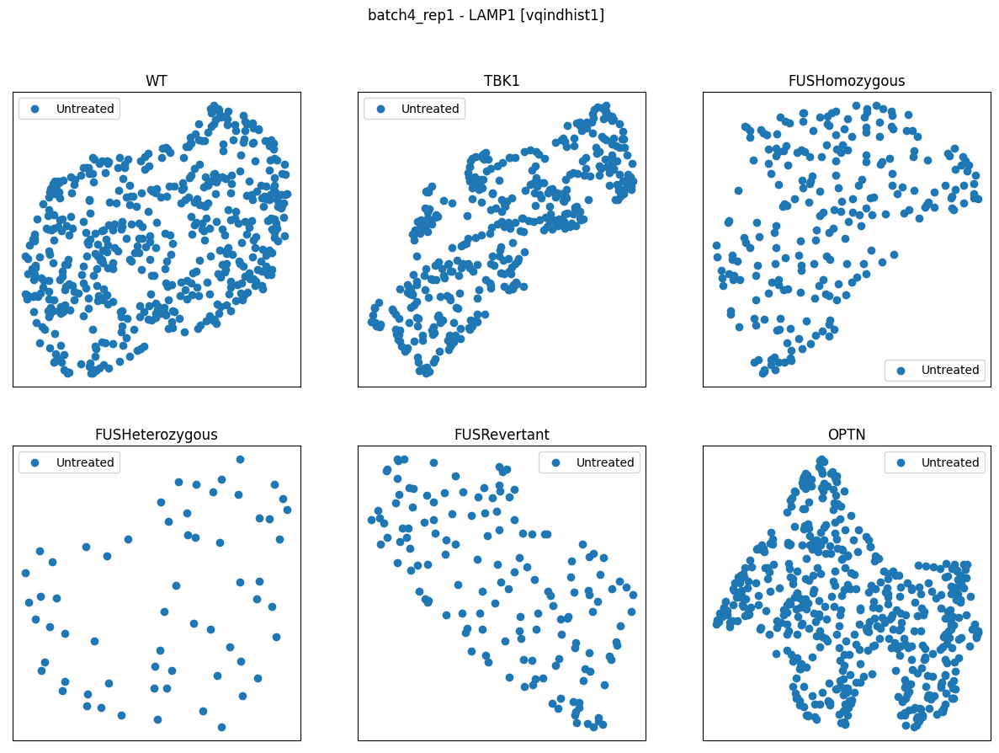

WT (188, 2048) (188,) (188,)
TBK1 (329, 2048) (329,) (329,)
FUSHomozygous (126, 2048) (126,) (126,)
FUSHeterozygous (59, 2048) (59,) (59,)
FUSRevertant (143, 2048) (143,) (143,)
OPTN (434, 2048) (434,) (434,)


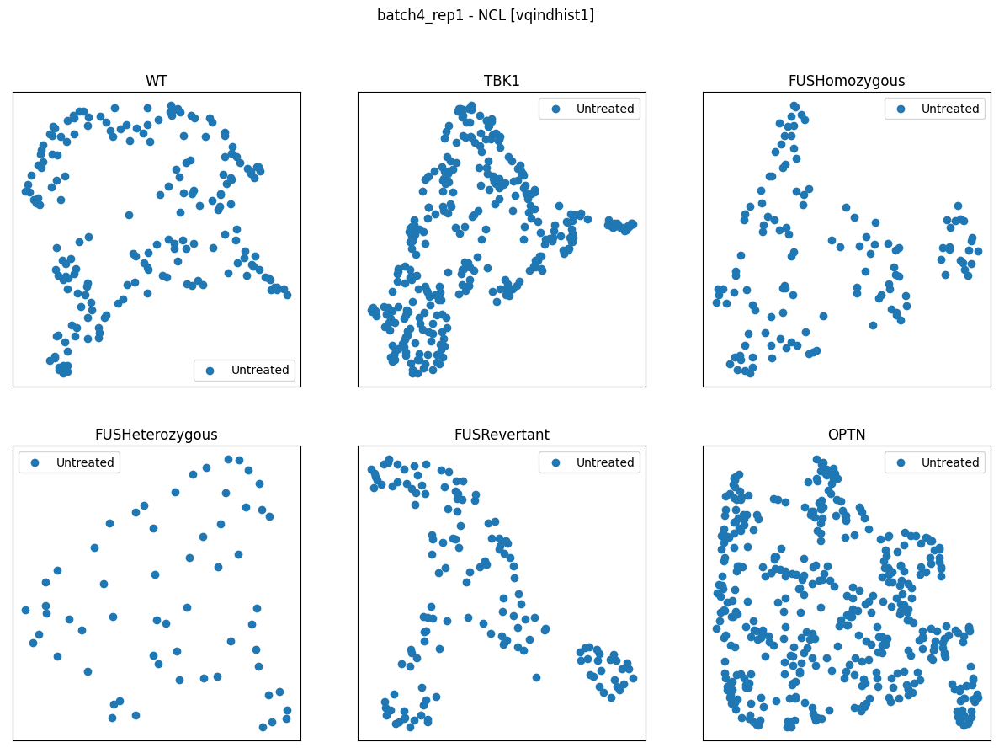

WT (1011, 2048) (1011,) (1011,)
TBK1 (957, 2048) (957,) (957,)
FUSHomozygous (517, 2048) (517,) (517,)
FUSHeterozygous (160, 2048) (160,) (160,)
FUSRevertant (284, 2048) (284,) (284,)
OPTN (965, 2048) (965,) (965,)


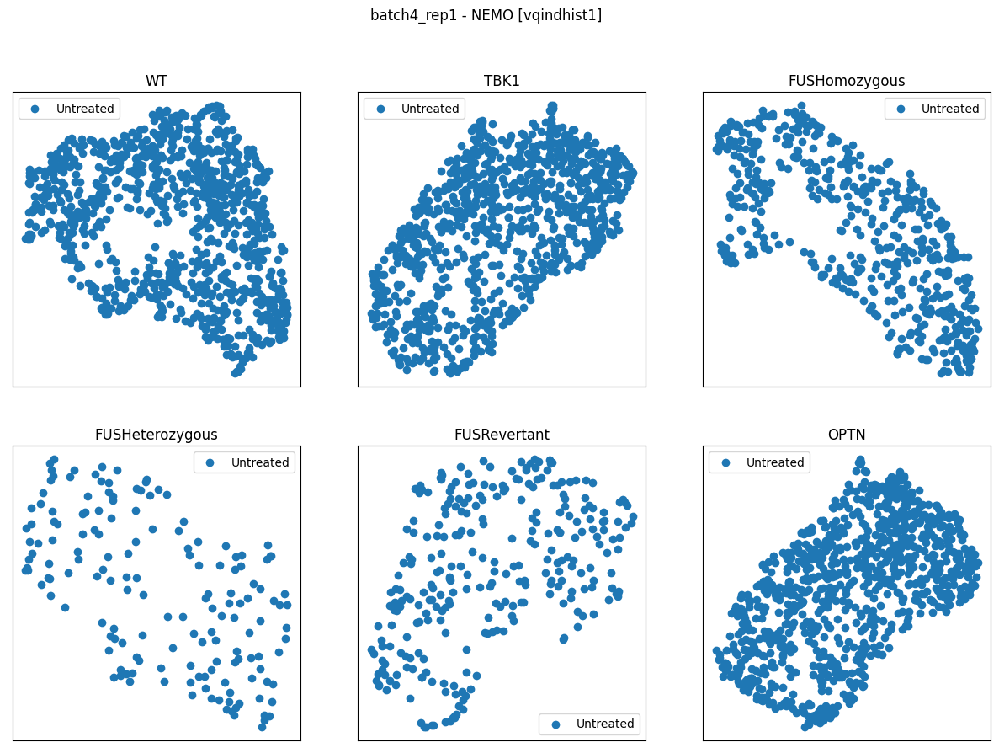

WT (860, 2048) (860,) (860,)
TBK1 (683, 2048) (683,) (683,)
FUSHomozygous (455, 2048) (455,) (455,)
FUSHeterozygous (61, 2048) (61,) (61,)
FUSRevertant (445, 2048) (445,) (445,)
OPTN (885, 2048) (885,) (885,)


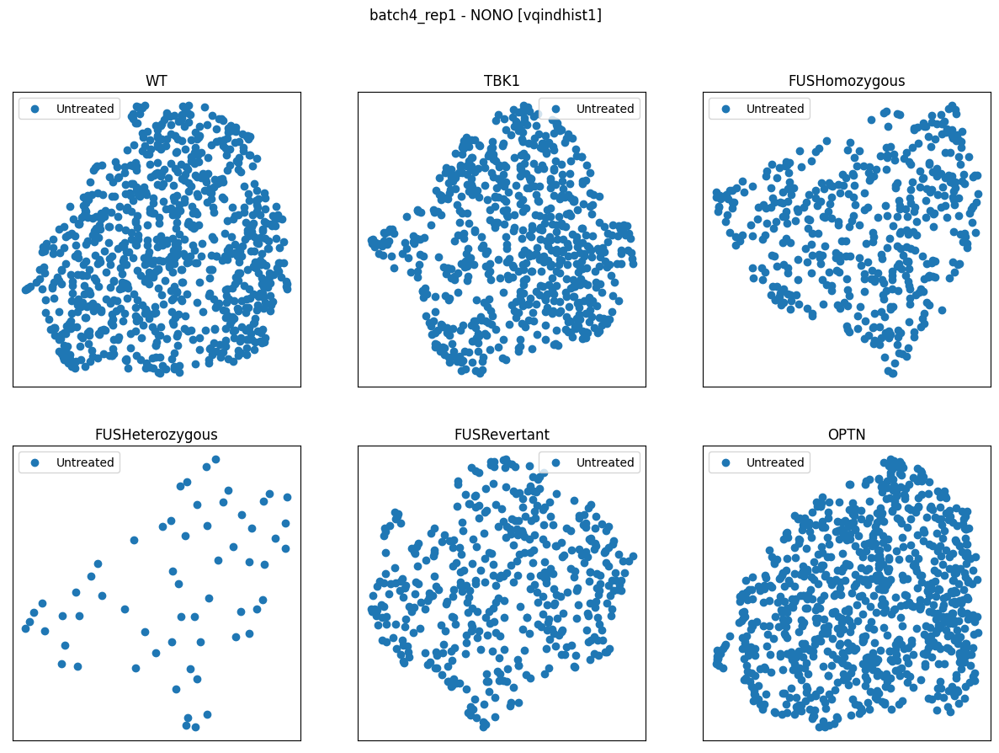

WT (1000, 2048) (1000,) (1000,)
TBK1 (882, 2048) (882,) (882,)
FUSHomozygous (579, 2048) (579,) (579,)
FUSHeterozygous (135, 2048) (135,) (135,)
FUSRevertant (392, 2048) (392,) (392,)
OPTN (879, 2048) (879,) (879,)


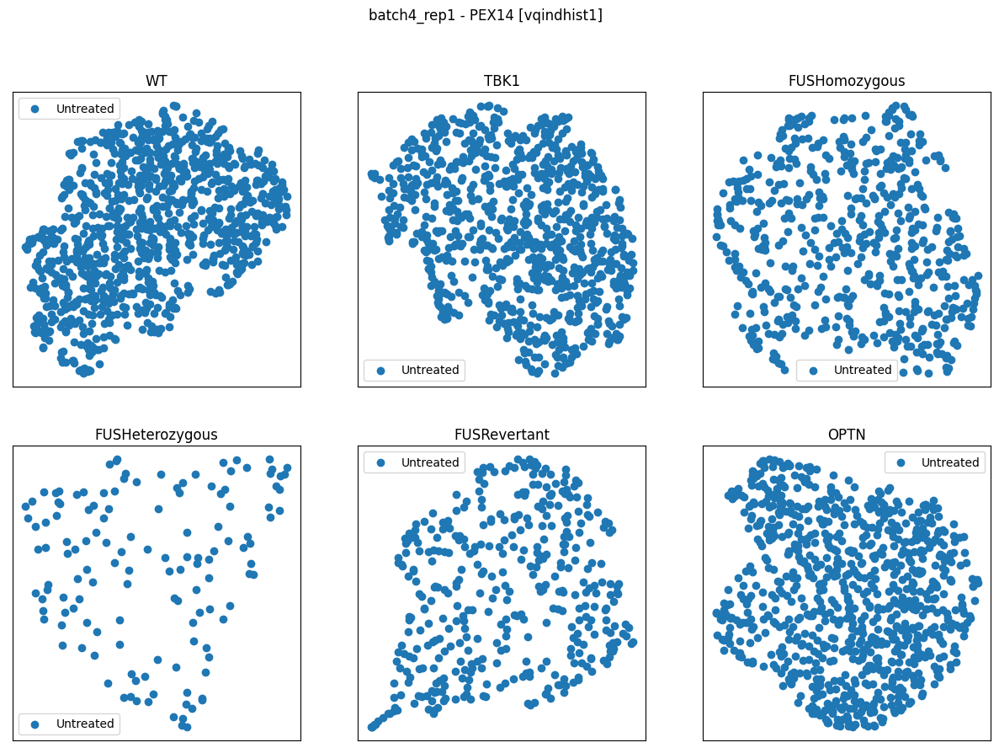

WT (1000, 2048) (1000,) (1000,)
TBK1 (882, 2048) (882,) (882,)
FUSHomozygous (579, 2048) (579,) (579,)
FUSHeterozygous (135, 2048) (135,) (135,)
FUSRevertant (392, 2048) (392,) (392,)
OPTN (879, 2048) (879,) (879,)


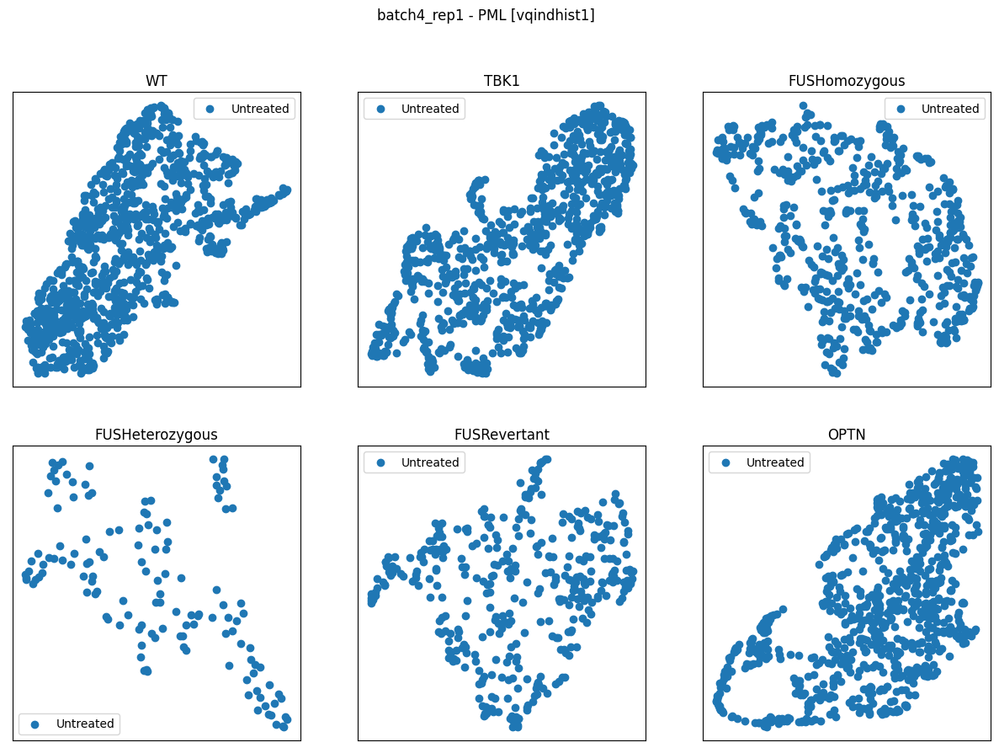

WT (846, 2048) (846,) (846,)
TBK1 (723, 2048) (723,) (723,)
FUSHomozygous (359, 2048) (359,) (359,)
FUSHeterozygous (81, 2048) (81,) (81,)
FUSRevertant (247, 2048) (247,) (247,)
OPTN (822, 2048) (822,) (822,)


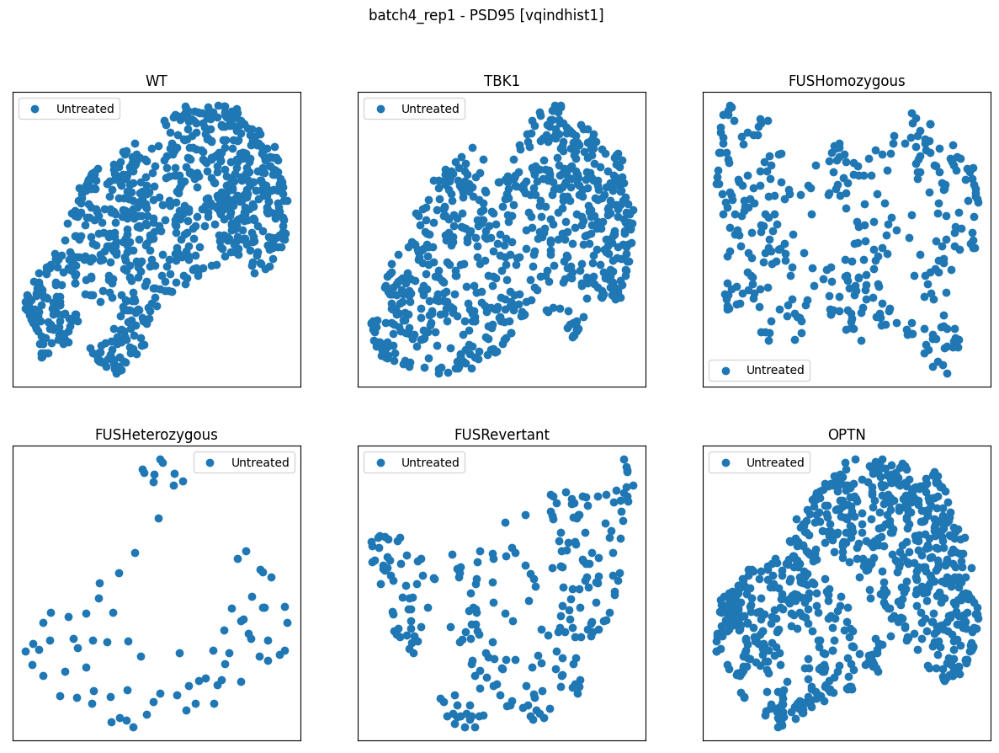

WT (960, 2048) (960,) (960,)
TBK1 (643, 2048) (643,) (643,)
FUSHomozygous (361, 2048) (361,) (361,)
FUSHeterozygous (15, 2048) (15,) (15,)


/home/labs/hornsteinlab/Collaboration/MOmaps/anaconda3/momaps_torch/lib/python3.9/site-packages/umap/umap_.py:2344: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


FUSRevertant (379, 2048) (379,) (379,)
OPTN (898, 2048) (898,) (898,)


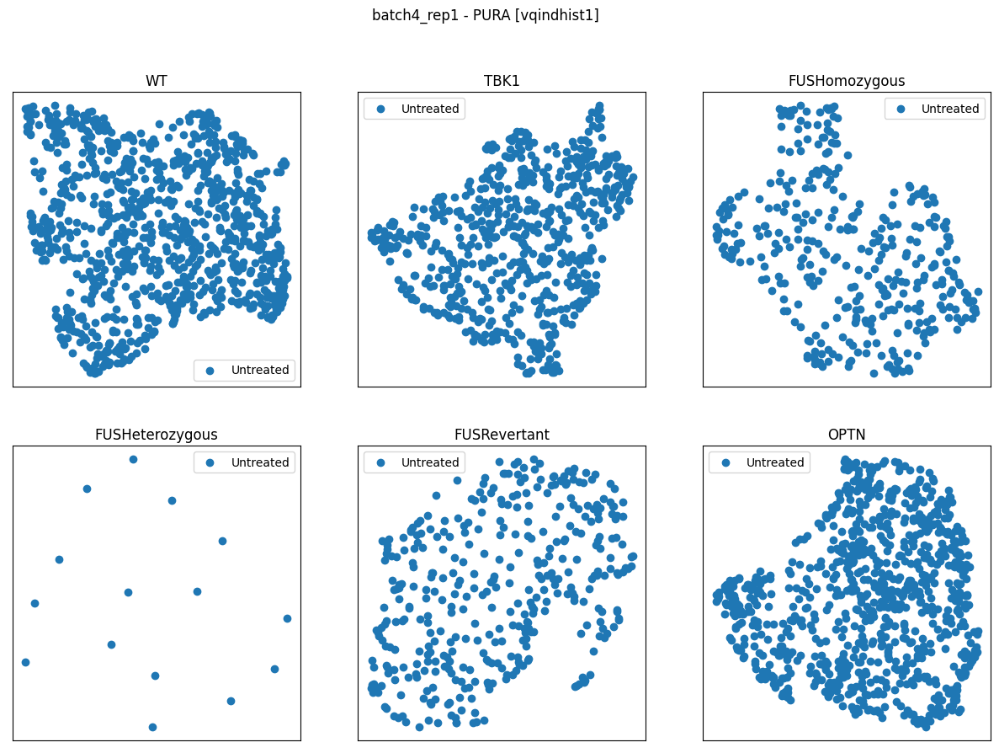

WT (914, 2048) (914,) (914,)
TBK1 (706, 2048) (706,) (706,)
FUSHomozygous (467, 2048) (467,) (467,)
FUSHeterozygous (78, 2048) (78,) (78,)
FUSRevertant (375, 2048) (375,) (375,)
OPTN (813, 2048) (813,) (813,)


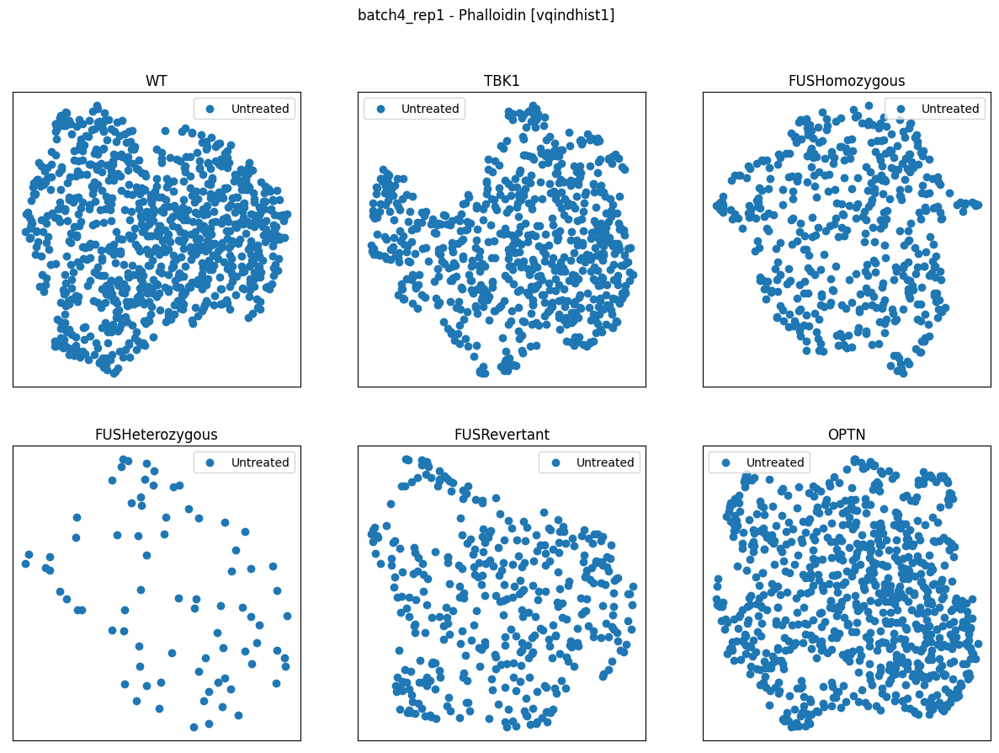

WT (627, 2048) (627,) (627,)
TBK1 (421, 2048) (421,) (421,)
FUSHomozygous (232, 2048) (232,) (232,)
FUSHeterozygous (49, 2048) (49,) (49,)
FUSRevertant (176, 2048) (176,) (176,)
OPTN (533, 2048) (533,) (533,)


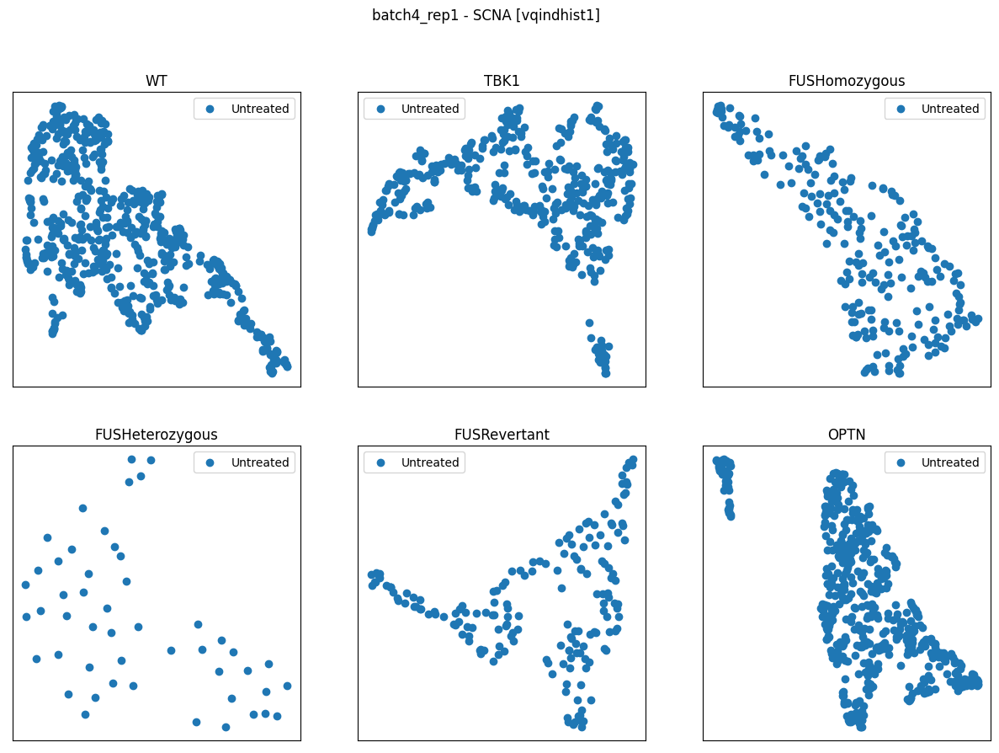

WT (914, 2048) (914,) (914,)
TBK1 (706, 2048) (706,) (706,)
FUSHomozygous (467, 2048) (467,) (467,)
FUSHeterozygous (78, 2048) (78,) (78,)
FUSRevertant (375, 2048) (375,) (375,)
OPTN (813, 2048) (813,) (813,)


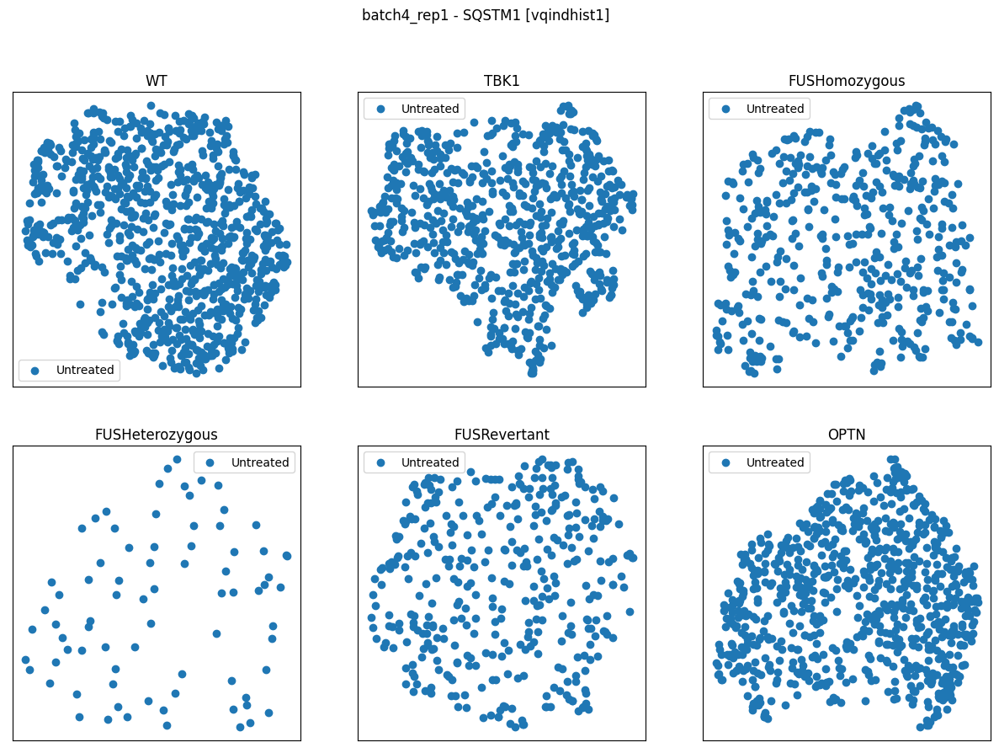

WT (860, 2048) (860,) (860,)
TBK1 (662, 2048) (662,) (662,)
FUSHomozygous (455, 2048) (455,) (455,)
FUSHeterozygous (61, 2048) (61,) (61,)
FUSRevertant (445, 2048) (445,) (445,)
OPTN (885, 2048) (885,) (885,)


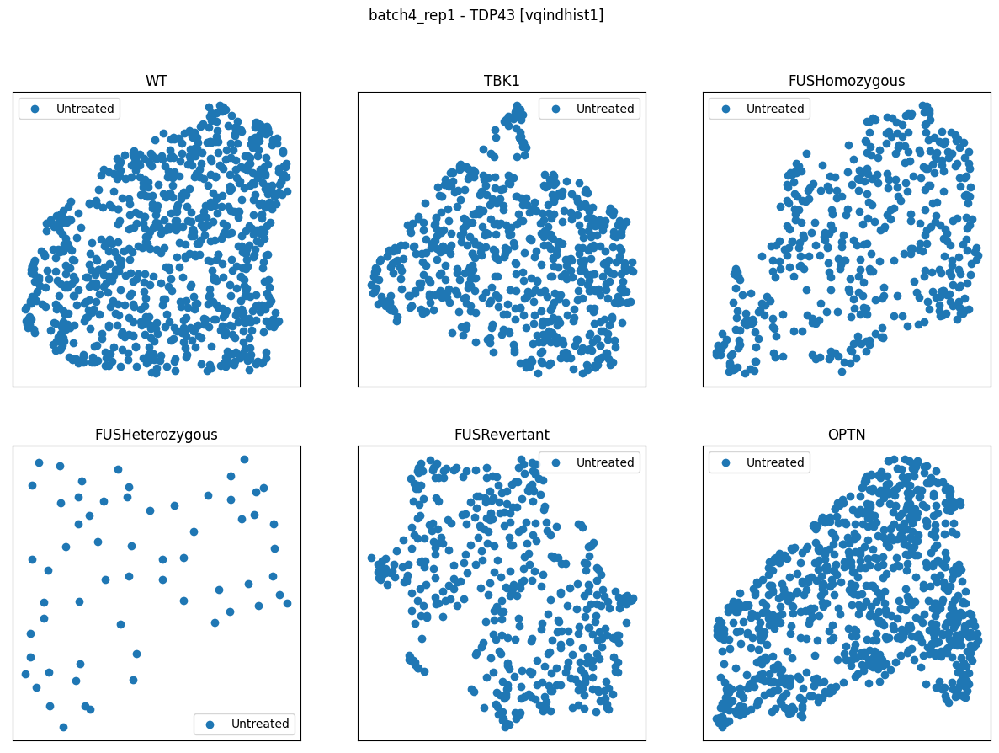

WT (809, 2048) (809,) (809,)
TBK1 (759, 2048) (759,) (759,)
FUSHomozygous (385, 2048) (385,) (385,)
FUSHeterozygous (73, 2048) (73,) (73,)
FUSRevertant (363, 2048) (363,) (363,)
OPTN (881, 2048) (881,) (881,)


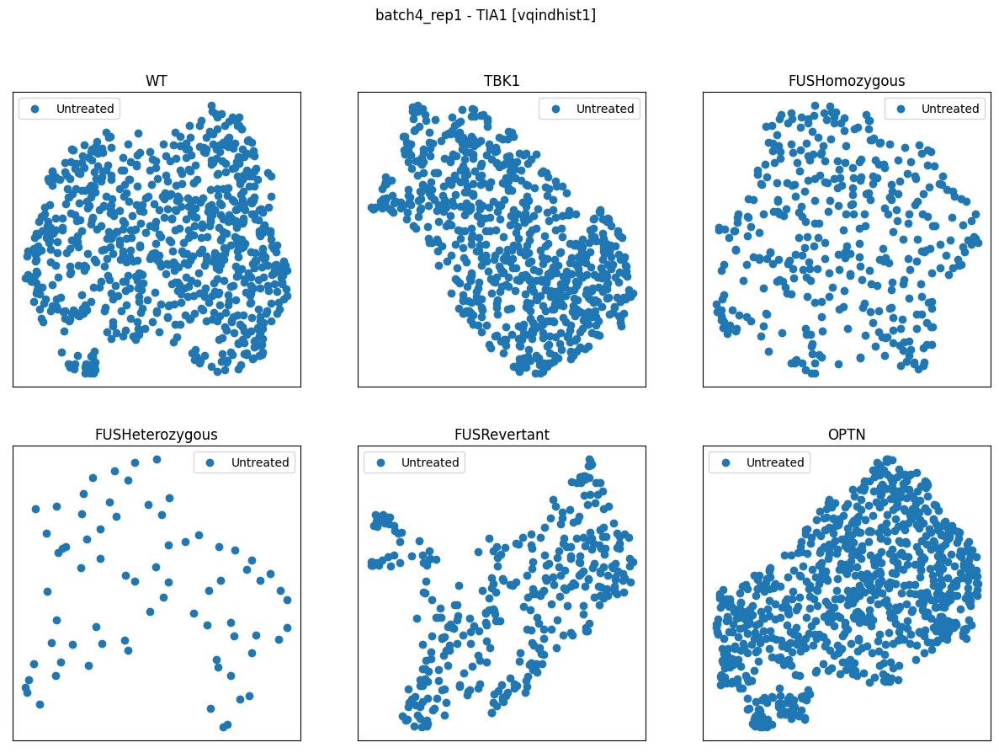

WT (946, 2048) (946,) (946,)
TBK1 (607, 2048) (607,) (607,)
FUSHomozygous (499, 2048) (499,) (499,)
FUSHeterozygous (69, 2048) (69,) (69,)
FUSRevertant (206, 2048) (206,) (206,)
OPTN (407, 2048) (407,) (407,)


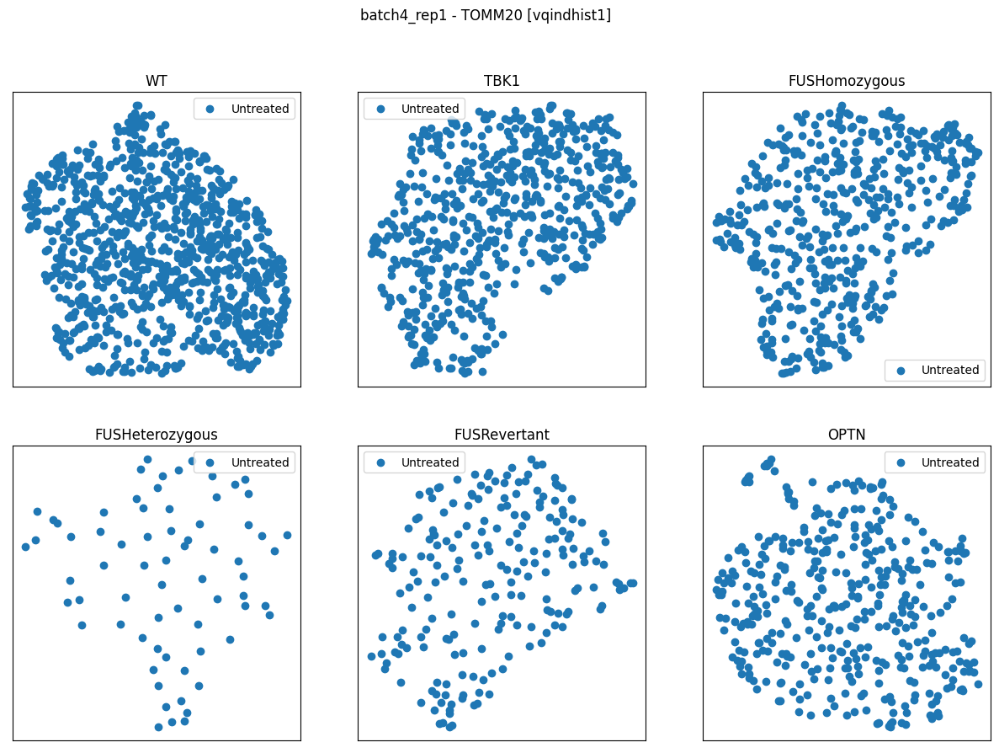

WT (1000, 2048) (1000,) (1000,)
TBK1 (882, 2048) (882,) (882,)
FUSHomozygous (579, 2048) (579,) (579,)
FUSHeterozygous (135, 2048) (135,) (135,)
FUSRevertant (392, 2048) (392,) (392,)
OPTN (879, 2048) (879,) (879,)


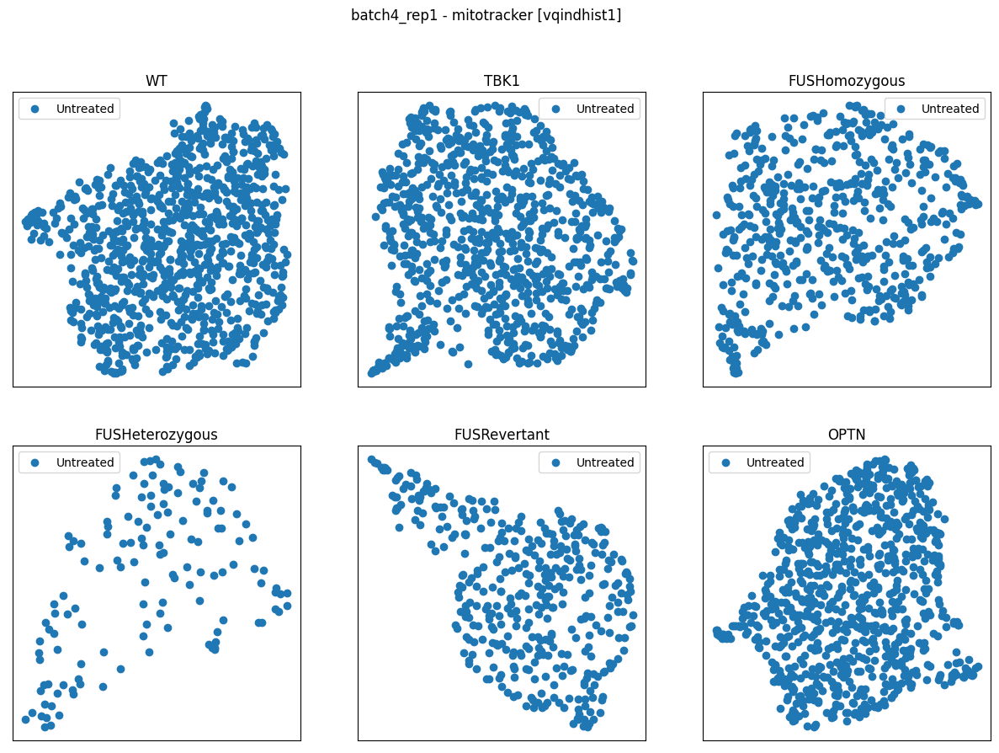

4 rep2
WT (595, 2048) (595,) (595,)
TBK1 (434, 2048) (434,) (434,)
FUSHomozygous (288, 2048) (288,) (288,)
FUSHeterozygous (52, 2048) (52,) (52,)
FUSRevertant (146, 2048) (146,) (146,)
OPTN (652, 2048) (652,) (652,)


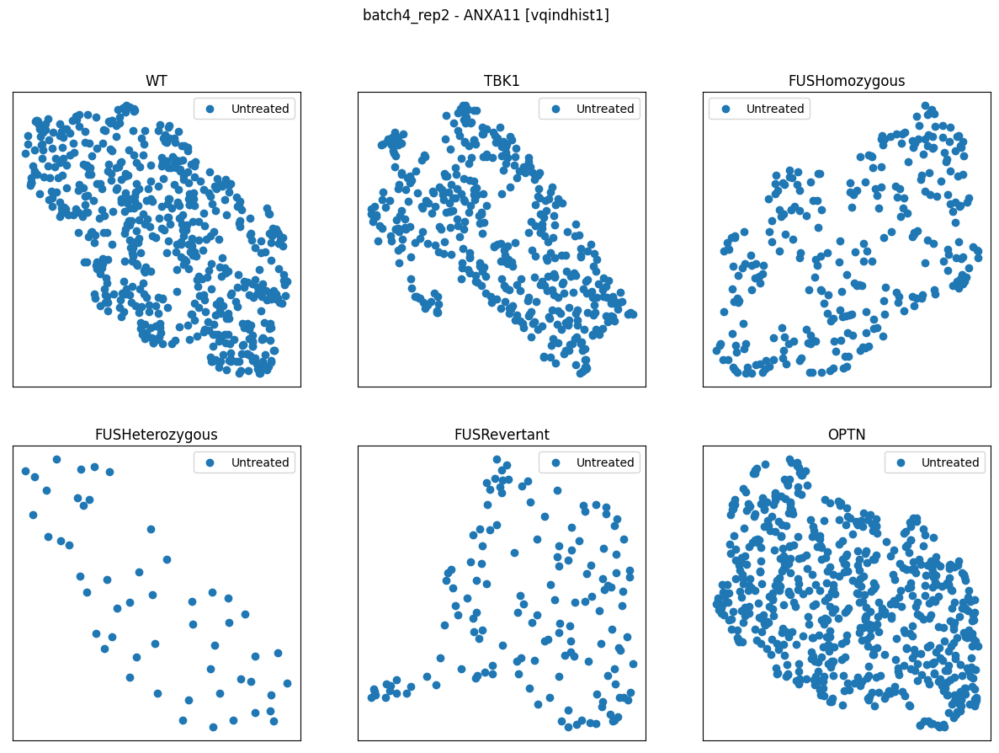

WT (1106, 2048) (1106,) (1106,)
TBK1 (867, 2048) (867,) (867,)
FUSHomozygous (509, 2048) (509,) (509,)
FUSHeterozygous (95, 2048) (95,) (95,)
FUSRevertant (431, 2048) (431,) (431,)
OPTN (987, 2048) (987,) (987,)


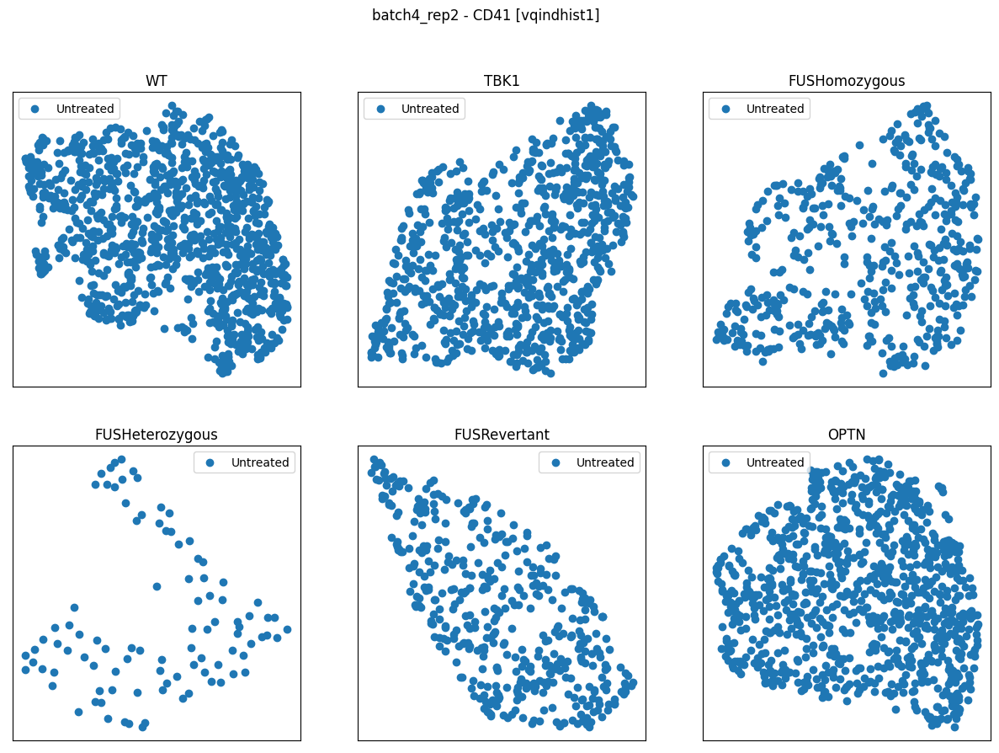

WT (985, 2048) (985,) (985,)
TBK1 (947, 2048) (947,) (947,)
FUSHomozygous (595, 2048) (595,) (595,)
FUSHeterozygous (134, 2048) (134,) (134,)
FUSRevertant (382, 2048) (382,) (382,)
OPTN (981, 2048) (981,) (981,)


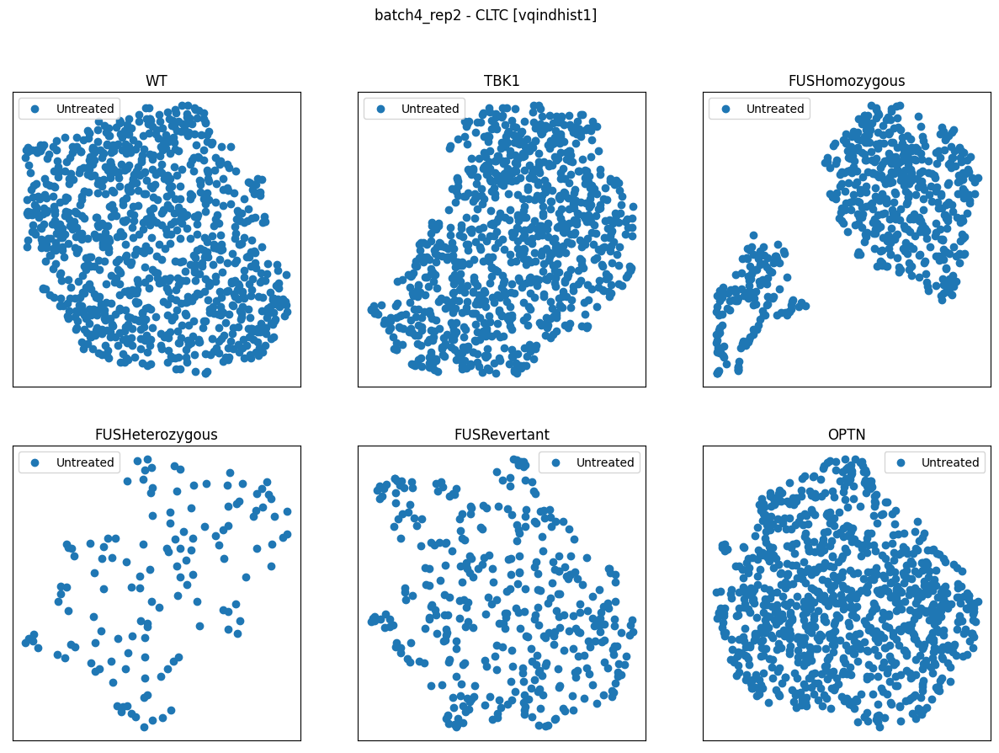

WT (573, 2048) (573,) (573,)
TBK1 (385, 2048) (385,) (385,)
FUSHomozygous (179, 2048) (179,) (179,)
FUSHeterozygous (57, 2048) (57,) (57,)
FUSRevertant (143, 2048) (143,) (143,)
OPTN (635, 2048) (635,) (635,)


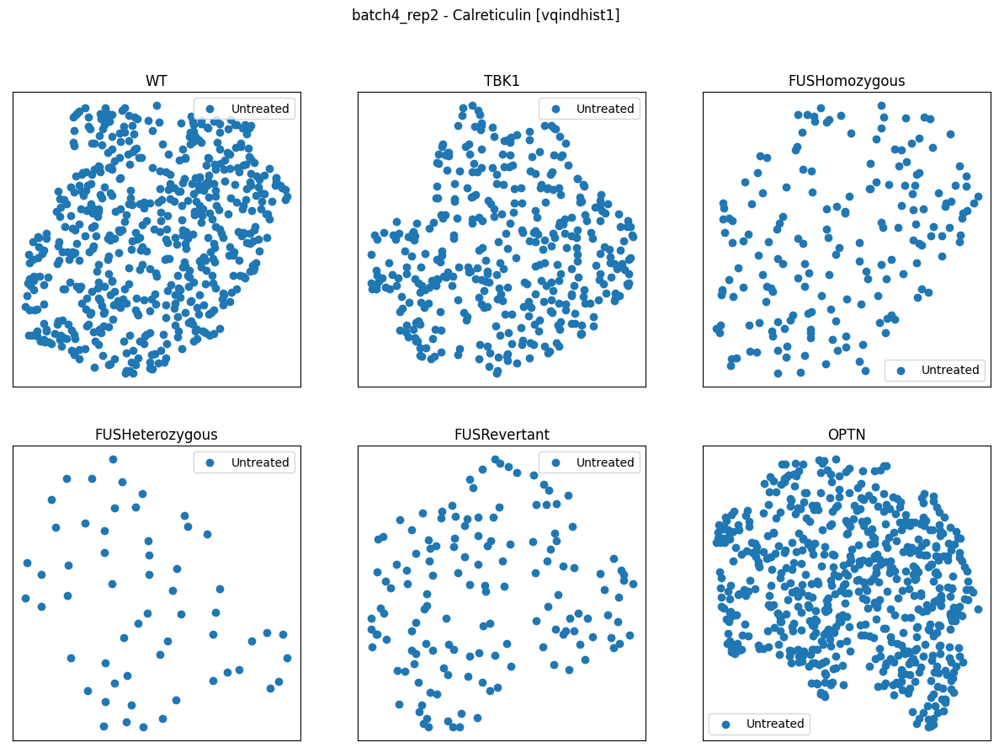

WT (953, 2048) (953,) (953,)
TBK1 (1060, 2048) (1060,) (1060,)
FUSHomozygous (674, 2048) (674,) (674,)
FUSHeterozygous (196, 2048) (196,) (196,)
FUSRevertant (287, 2048) (287,) (287,)
OPTN (994, 2048) (994,) (994,)


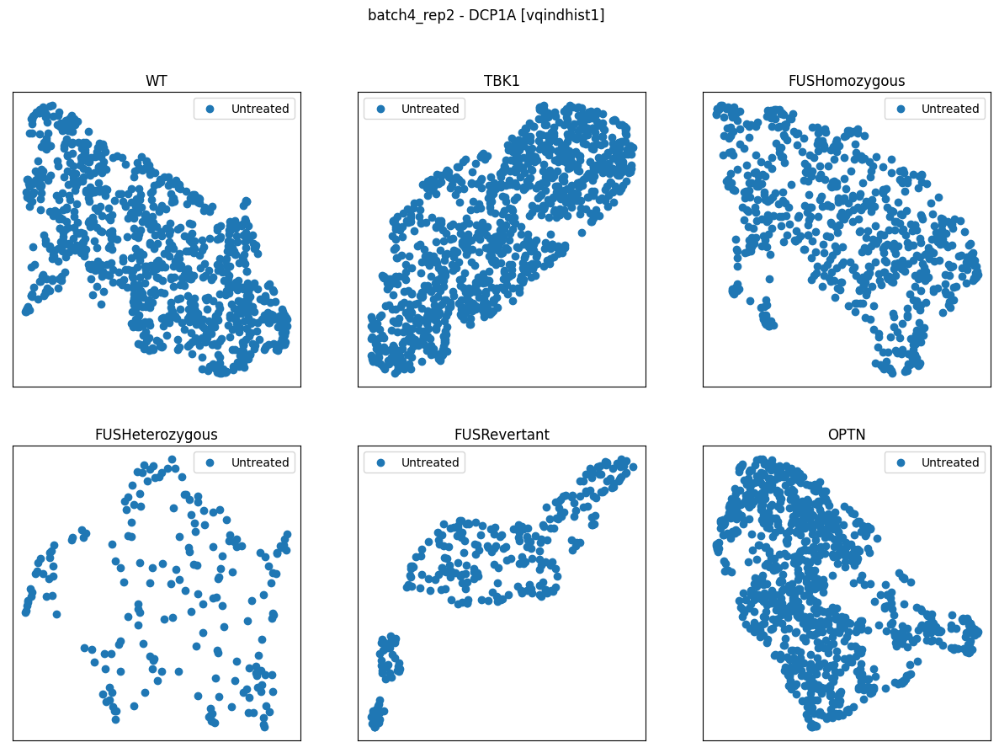

WT (1037, 2048) (1037,) (1037,)
TBK1 (693, 2048) (693,) (693,)
FUSHomozygous (426, 2048) (426,) (426,)
FUSHeterozygous (100, 2048) (100,) (100,)
FUSRevertant (465, 2048) (465,) (465,)
OPTN (933, 2048) (933,) (933,)


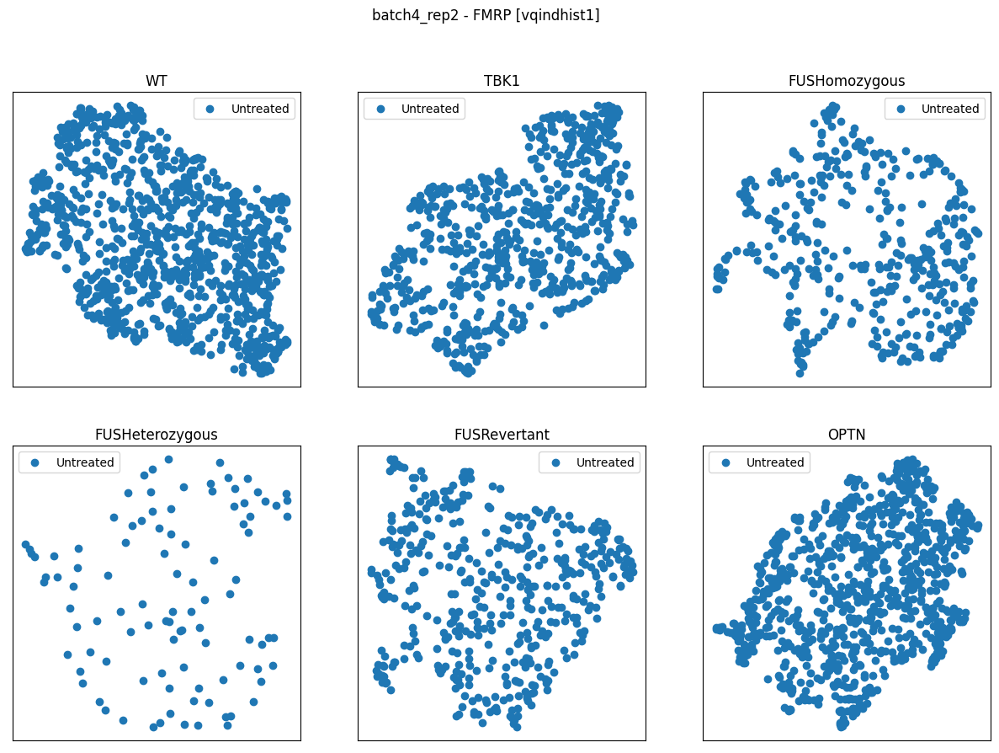

WT (700, 2048) (700,) (700,)
TBK1 (446, 2048) (446,) (446,)
FUSHomozygous (212, 2048) (212,) (212,)
FUSHeterozygous (58, 2048) (58,) (58,)
FUSRevertant (165, 2048) (165,) (165,)
OPTN (562, 2048) (562,) (562,)


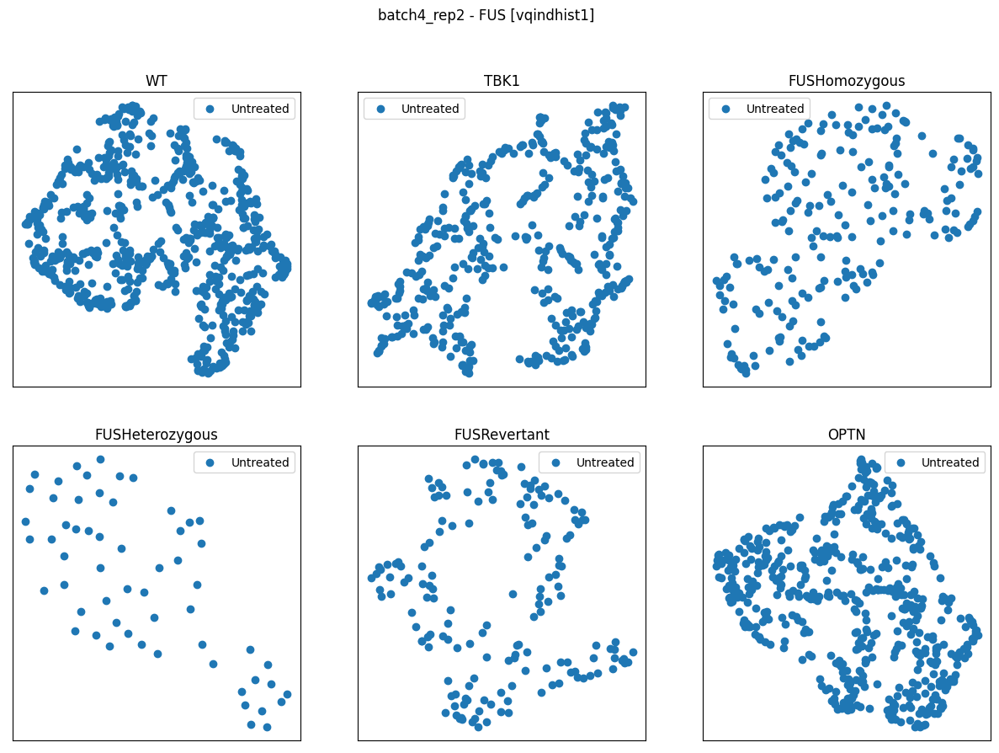

WT (1063, 2048) (1063,) (1063,)
TBK1 (766, 2048) (766,) (766,)
FUSHomozygous (496, 2048) (496,) (496,)
FUSHeterozygous (35, 2048) (35,) (35,)
FUSRevertant (502, 2048) (502,) (502,)
OPTN (1071, 2048) (1071,) (1071,)


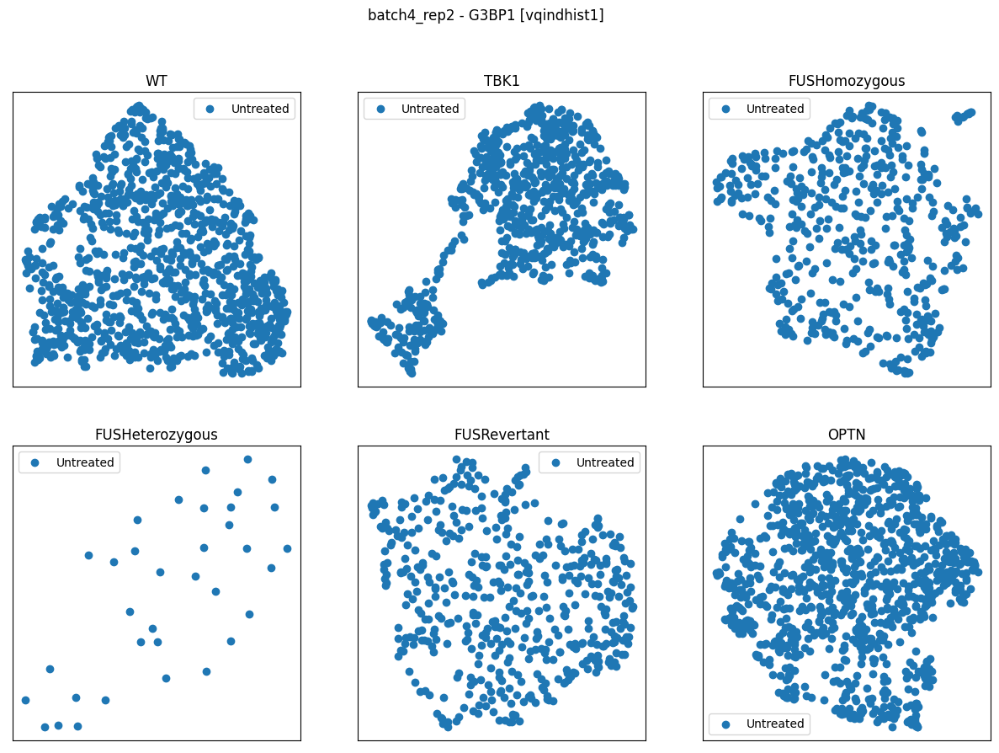

WT (997, 2048) (997,) (997,)
TBK1 (989, 2048) (989,) (989,)
FUSHomozygous (558, 2048) (558,) (558,)
FUSHeterozygous (135, 2048) (135,) (135,)
FUSRevertant (337, 2048) (337,) (337,)
OPTN (907, 2048) (907,) (907,)


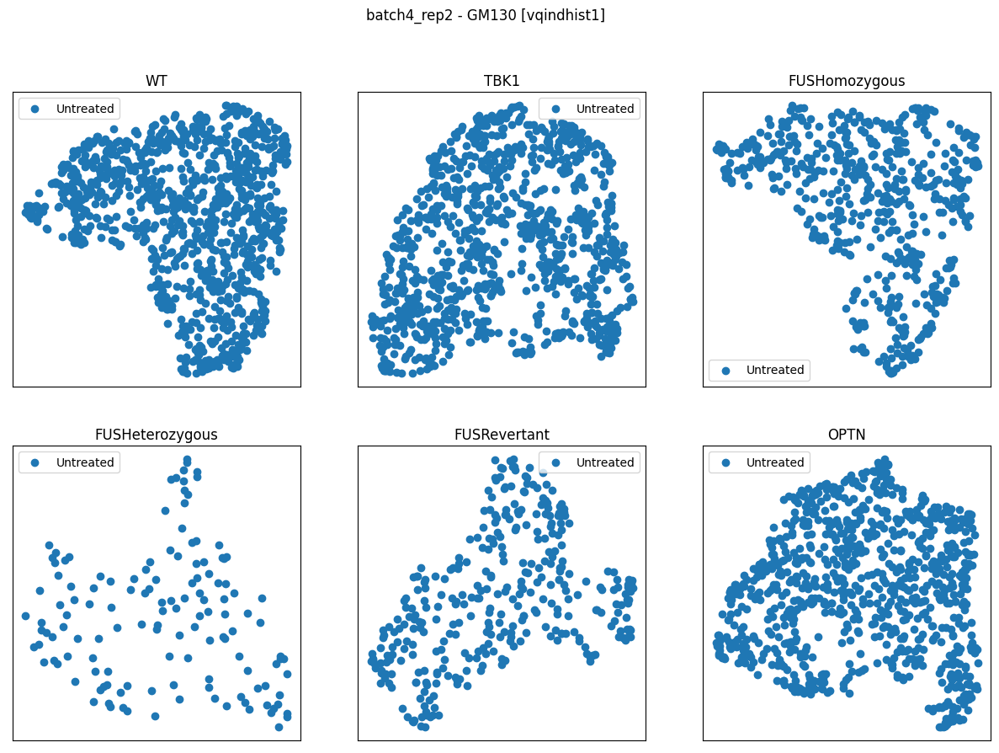

WT (1063, 2048) (1063,) (1063,)
TBK1 (766, 2048) (766,) (766,)
FUSHomozygous (496, 2048) (496,) (496,)
FUSHeterozygous (35, 2048) (35,) (35,)
FUSRevertant (502, 2048) (502,) (502,)
OPTN (1071, 2048) (1071,) (1071,)


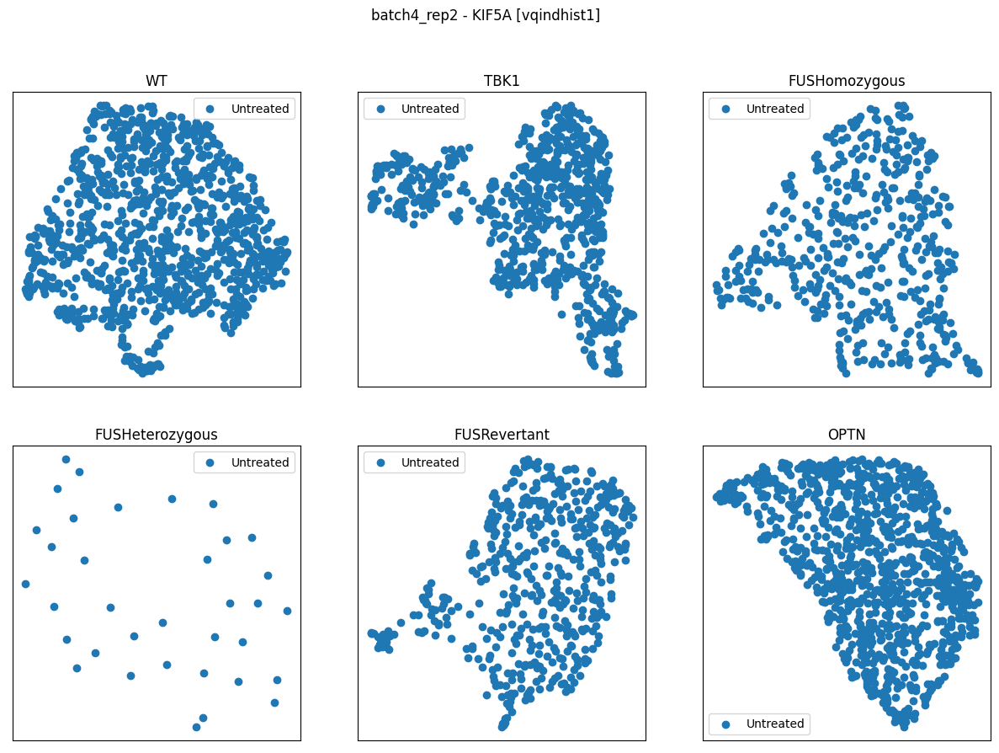

WT (573, 2048) (573,) (573,)
TBK1 (385, 2048) (385,) (385,)
FUSHomozygous (179, 2048) (179,) (179,)
FUSHeterozygous (57, 2048) (57,) (57,)
FUSRevertant (143, 2048) (143,) (143,)
OPTN (635, 2048) (635,) (635,)


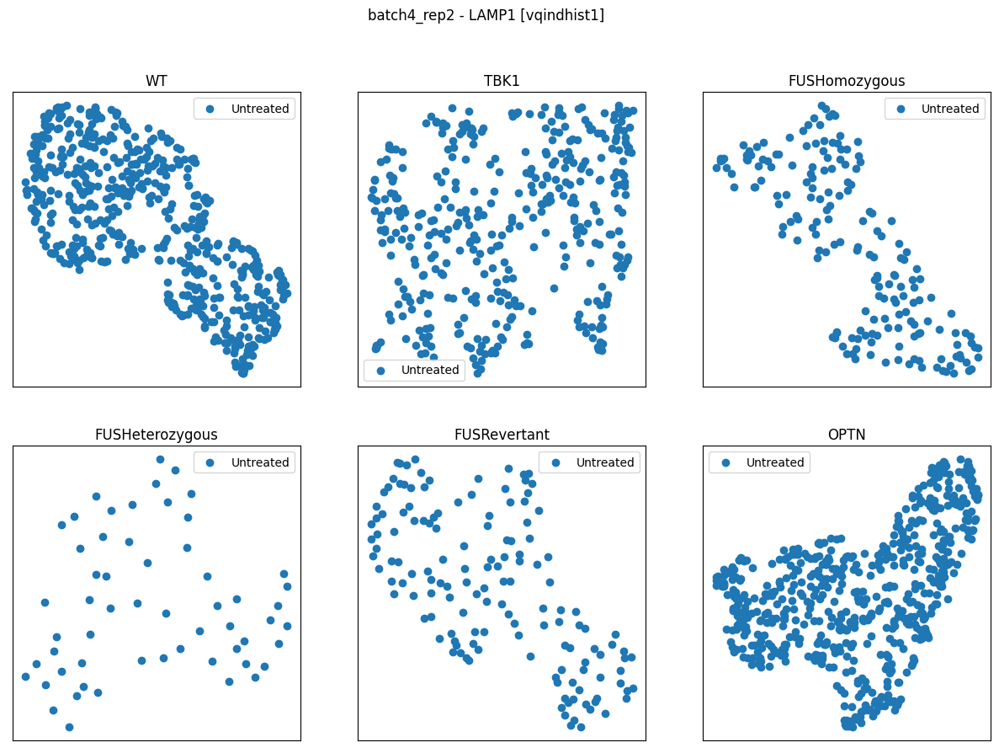

WT (700, 2048) (700,) (700,)
TBK1 (446, 2048) (446,) (446,)
FUSHomozygous (212, 2048) (212,) (212,)
FUSHeterozygous (58, 2048) (58,) (58,)
FUSRevertant (165, 2048) (165,) (165,)
OPTN (562, 2048) (562,) (562,)


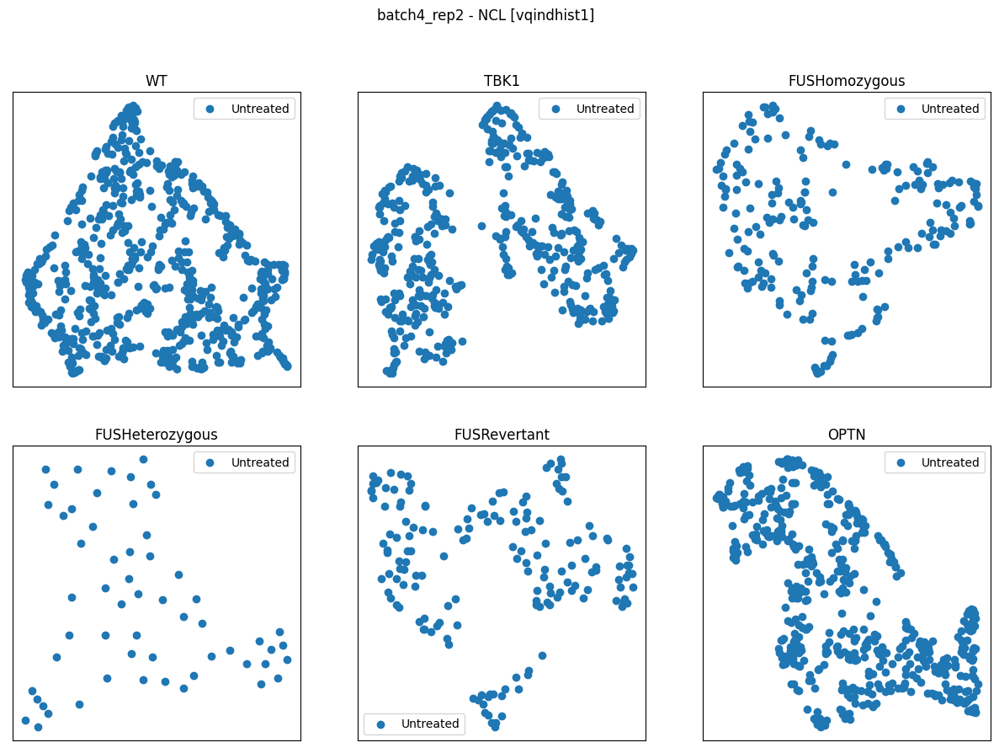

WT (953, 2048) (953,) (953,)
TBK1 (1060, 2048) (1060,) (1060,)
FUSHomozygous (674, 2048) (674,) (674,)
FUSHeterozygous (196, 2048) (196,) (196,)
FUSRevertant (287, 2048) (287,) (287,)
OPTN (994, 2048) (994,) (994,)


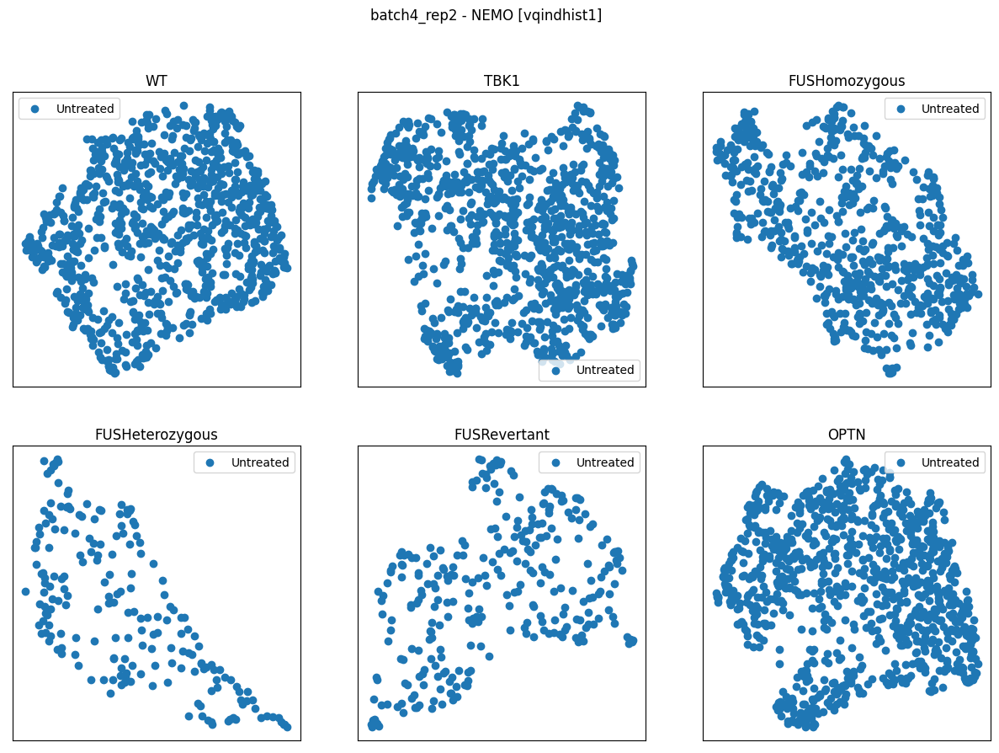

WT (1106, 2048) (1106,) (1106,)
TBK1 (867, 2048) (867,) (867,)
FUSHomozygous (509, 2048) (509,) (509,)
FUSHeterozygous (95, 2048) (95,) (95,)
FUSRevertant (431, 2048) (431,) (431,)
OPTN (987, 2048) (987,) (987,)


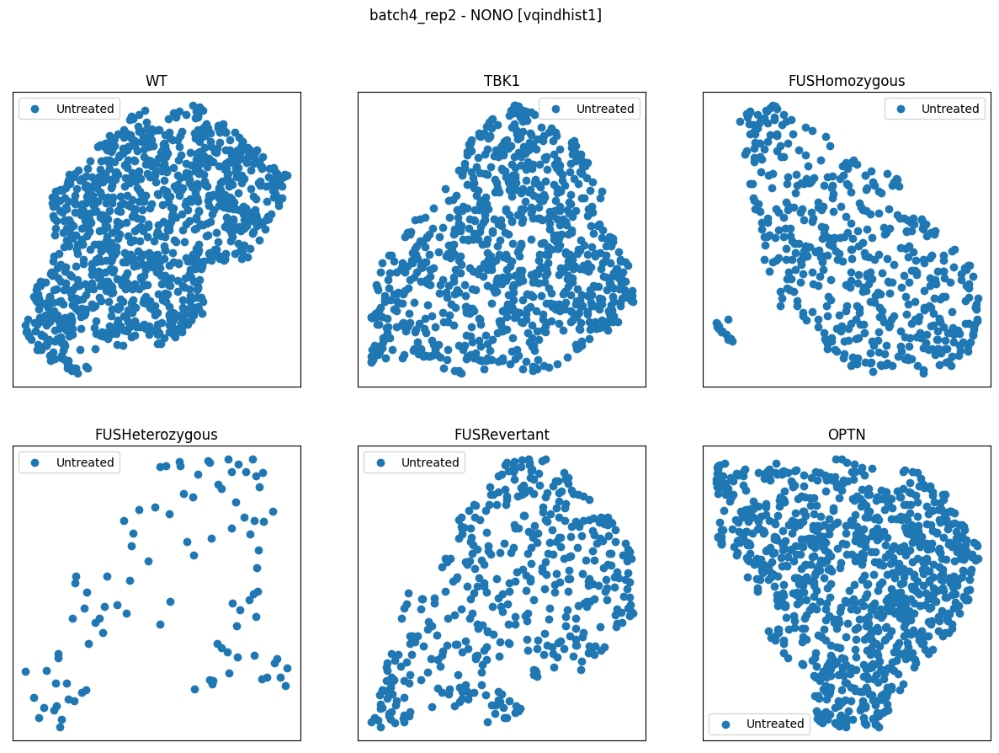

WT (1049, 2048) (1049,) (1049,)
TBK1 (1112, 2048) (1112,) (1112,)
FUSHomozygous (713, 2048) (713,) (713,)
FUSHeterozygous (211, 2048) (211,) (211,)
FUSRevertant (450, 2048) (450,) (450,)
OPTN (955, 2048) (955,) (955,)


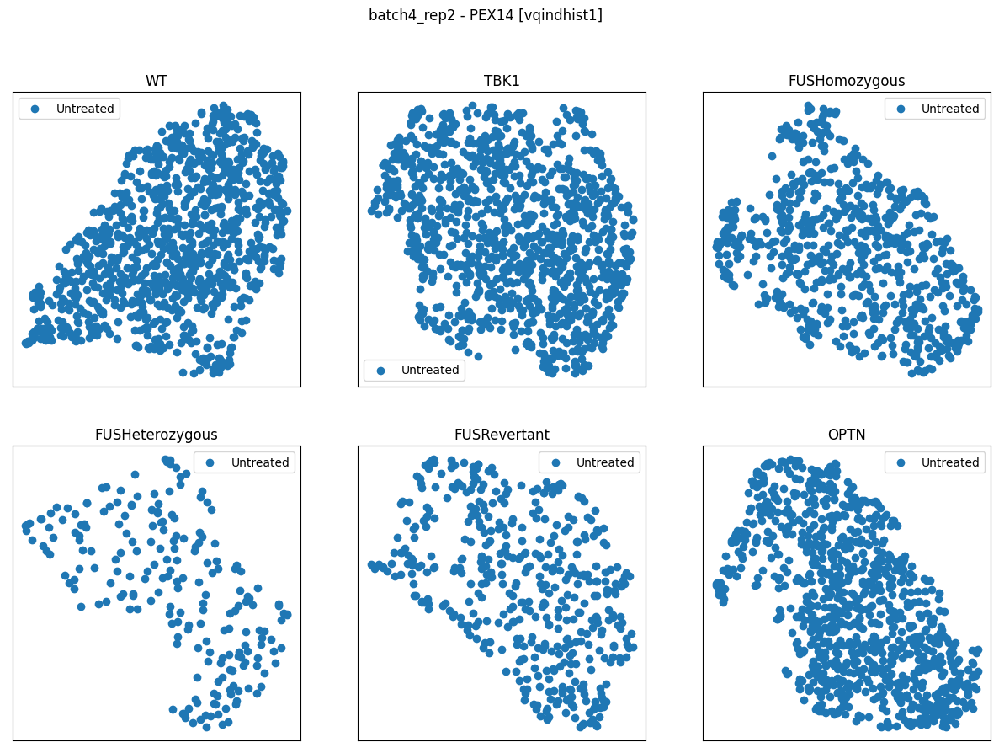

WT (1049, 2048) (1049,) (1049,)
TBK1 (1112, 2048) (1112,) (1112,)
FUSHomozygous (713, 2048) (713,) (713,)
FUSHeterozygous (211, 2048) (211,) (211,)
FUSRevertant (450, 2048) (450,) (450,)
OPTN (955, 2048) (955,) (955,)


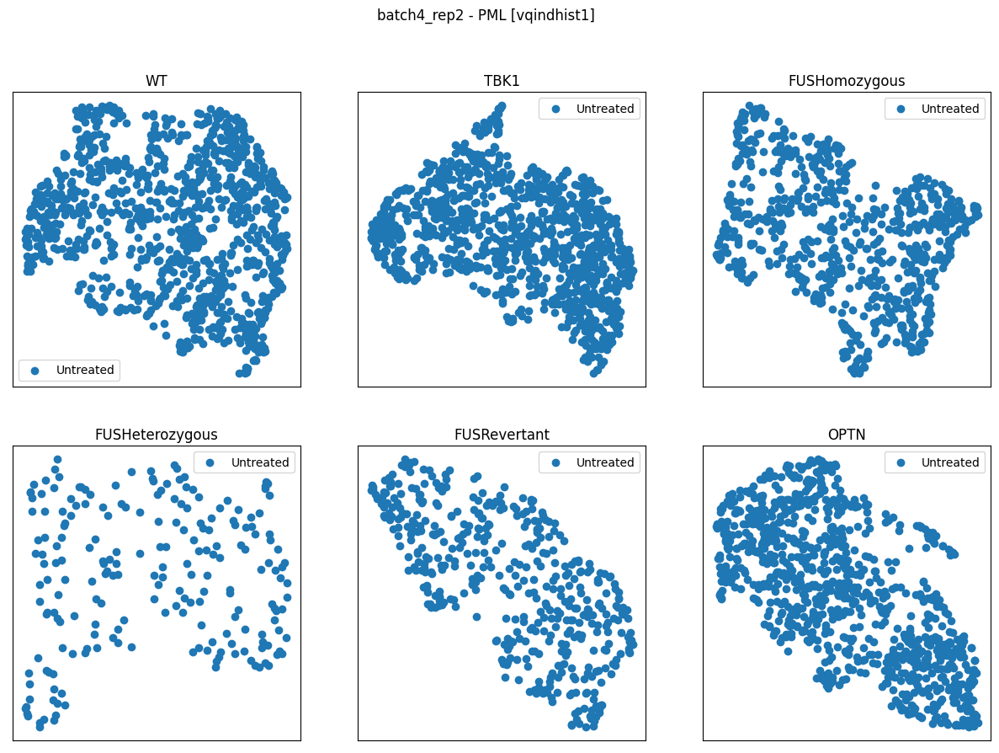

WT (985, 2048) (985,) (985,)
TBK1 (947, 2048) (947,) (947,)
FUSHomozygous (595, 2048) (595,) (595,)
FUSHeterozygous (134, 2048) (134,) (134,)
FUSRevertant (382, 2048) (382,) (382,)
OPTN (981, 2048) (981,) (981,)


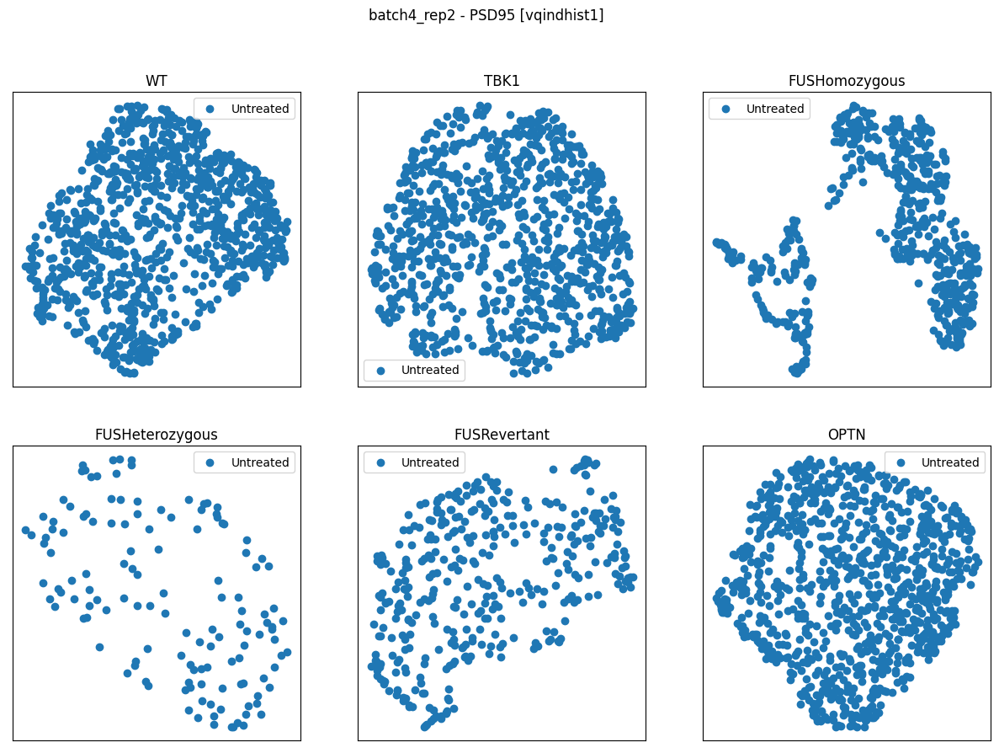

WT (1063, 2048) (1063,) (1063,)
TBK1 (766, 2048) (766,) (766,)
FUSHomozygous (496, 2048) (496,) (496,)
FUSHeterozygous (35, 2048) (35,) (35,)
FUSRevertant (502, 2048) (502,) (502,)
OPTN (1071, 2048) (1071,) (1071,)


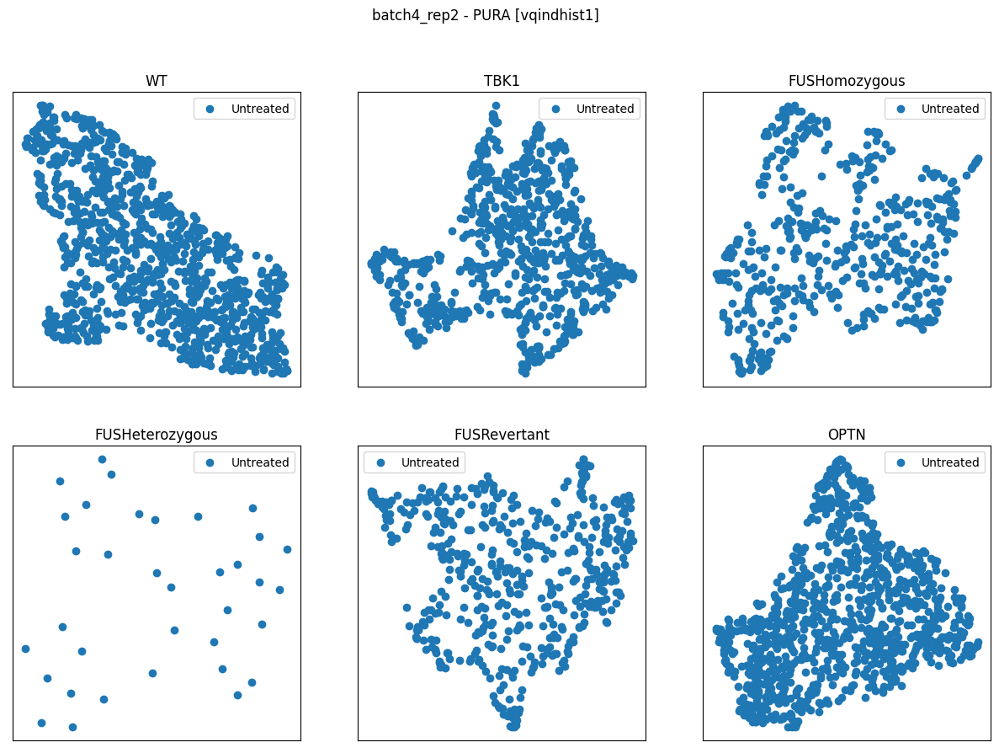

WT (1037, 2048) (1037,) (1037,)
TBK1 (693, 2048) (693,) (693,)
FUSHomozygous (426, 2048) (426,) (426,)
FUSHeterozygous (100, 2048) (100,) (100,)
FUSRevertant (465, 2048) (465,) (465,)
OPTN (933, 2048) (933,) (933,)


In [35]:
vec_type = 'vqindhist1' #'vqvec2'
# base_path = f"/home/labs/hornsteinlab/Collaboration/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/embeddings_with_paths/neurons/{vec_type}"
base_path = f"/home/labs/hornsteinlab/Collaboration/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/embeddings/neurons/{vec_type}"

for batch_number in [3,4,5,6,9]:

    # embeddings = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/embeddings_with_paths/neurons/vqvec2/batch6_16bit_no_downsample_partial/vqvec2_allset.npy")
    labels = np.load(f"{base_path}/batch{batch_number}_16bit_no_downsample/{vec_type}_labels_allset.npy")
    paths = np.load(f"{base_path}/batch{batch_number}_16bit_no_downsample/{vec_type}_paths_allset.npy")
    # embeddings = np.memmap(f"{base_path}/batch{batch_number}_16bit_no_downsample/{vec_type}_allset.npy",  mode='r', dtype='float32', shape=(len(paths), 576, 4,4))
    embeddings = np.memmap(f"{base_path}/batch{batch_number}_16bit_no_downsample/{vec_type}_allset.npy",  mode='r', dtype='float32', shape=(len(paths), 2048))


    print(embeddings.shape, labels.shape, paths.shape)
    
    if len(embeddings) == 0:
        print(f"No such file for batch {batch_number}")
        continue

    markers = np.asarray([l.split(os.sep)[-1] for l in labels])
    reps = np.asarray([l.split(os.sep)[-2] for l in labels])
    conditions = np.asarray([l.split(os.sep)[-3] for l in labels])
    cell_lines = np.asarray([l.split(os.sep)[-4] for l in labels])

    for rep in ['rep1', 'rep2']:
        print(batch_number, rep)
        reps_to_select = [rep]
        conditions_to_select = ['Untreated']#, 'stress']
        cell_line_to_select = ['WT', 'TBK1', 'FUSHomozygous', 'FUSHeterozygous', 'FUSRevertant', 'OPTN']# ["FUSHeterozygous"] #['WT', 'TBK1', 'FUSHomozygous', 'FUSHeterozygous', 'FUSRevertant', 'OPTN'] #['WT', 'TDP43', 'TBK1', 'FUSHomozygous', 'FUSHeterozygous', 'FUSRevertant', 'OPTN']
        # markers_to_select = ['FMRP']#np.unique(markers)
        # markers_to_exclude = []# ["DAPI", "TIA1", "FMRP", "SCNA", 'LAMP1', 'SQSTM1']#['DAPI', 'TIA1', 'SCNA', 'LAMP1']

                
        # Select

        # Plot umap
        for m in np.unique(markers):
            # m = 'FMRP'
            fig, ax = plt.subplots(2,3, figsize=(15,10))
            fig.suptitle(f"batch{batch_number}_{rep} - {m} [{vec_type}]")
            for i in range(2):
                for j in range(3):
                    c = cell_line_to_select[i*3 + j]
                    embeddings_filtered, labels_filtered, paths_filtered =  get_filtered_data(embeddings, labels, paths, [c], conditions_to_select, reps_to_select, [m])
                    if len(embeddings_filtered) == 0:
                        print(f"Nothing left for {c}")
                        continue
                    print(c, embeddings_filtered.shape, labels_filtered.shape, paths_filtered.shape)
                    umap_data = handle_umap(embeddings_filtered, labels_filtered, ax[i,j])
                    ax[i,j].set_title(c)
            plt.show()


## Cluster outliers types

In [ ]:
# Load data

def get_batch(batch_number):
    labels = np.load(f"/home/labs/hornsteinlab/Collaboration/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/embeddings_with_paths/neurons/vqvec2/batch{batch_number}_16bit_no_downsample/vqvec2_labels_allset.npy")
    paths = np.load(f"/home/labs/hornsteinlab/Collaboration/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/embeddings_with_paths/neurons/vqvec2/batch{batch_number}_16bit_no_downsample/vqvec2_paths_allset.npy")
    embeddings = np.memmap(f"/home/labs/hornsteinlab/Collaboration/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/embeddings_with_paths/neurons/vqvec2/batch{batch_number}_16bit_no_downsample/vqvec2_allset.npy",  mode='r', dtype='float32', shape=(len(paths), 576, 4,4))

    return embeddings, labels.reshape(-1,1), paths.reshape(-1,1)

batches = [3,4,5,6,9]
embeddings_all, labels_all, paths_all = [], [], []
for b in batches:
    e, l, p = get_batch(b)
    embeddings_all.append(e)
    labels_all.append(l)
    paths_all.append(p)
    
embeddings_all = np.vstack(embeddings_all)
labels_all = np.vstack(labels_all)
paths_all = np.vstack(paths_all)

print(embeddings_all.shape, labels_all.shape, paths_all.shape)

In [91]:
# Load all outliers from all batches and UMAP them to disclose the types of outliers

outliers_folder = "/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/outliers_paths_from_umap/"
outliers_filespaths = [os.path.join(root, file) for root, dirs, files in os.walk(outliers_folder) for file in files if os.path.splitext(file)[1] == '.npy']

outliers_paths = np.vstack(flat_list_of_lists([np.load(f) for f in outliers_filespaths])).reshape(-1,)

len(outliers_paths), outliers_paths[:2]


(13336,
 array(['/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch6_16bit_no_downsample/FUSHomozygous/Untreated/NCL/rep1_R11_w3confCy5_s801_panelG_FUSHomozygous_processed.npy_0',
        '/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch6_16bit_no_downsample/FUSHomozygous/Untreated/NCL/rep1_R11_w3confCy5_s805_panelG_FUSHomozygous_processed.npy_0'],
       dtype='<U214'))

In [93]:
# Take only outliers

mask = np.isin(paths_all, outliers_paths)
indexes = np.where(mask)[0]

filtered_embeddings = embeddings_all[indexes]
filtered_labels = labels_all[indexes]
filtered_paths = paths_all[indexes]

print(f"Before filtering outliers: {embeddings_all.shape}, {labels_all.shape}, {paths_all.shape} ; After filtering outliers: {filtered_embeddings.shape}, {filtered_labels.shape}, {filtered_paths.shape}")


Before filtering outliers: (1836874, 576, 4, 4), (1836874, 1), (1836874, 1) ; After filtering outliers: (13336, 576, 4, 4), (13336, 1), (13336, 1)


/home/labs/hornsteinlab/Collaboration/MOmaps/anaconda3/momaps_torch/lib/python3.9/site-packages/pynndescent/pynndescent_.py:937: UserWarning: Failed to correctly find n_neighbors for some samples. Results may be less than ideal. Try re-running with different parameters.
  warn(
/home/labs/hornsteinlab/Collaboration/MOmaps/anaconda3/momaps_torch/lib/python3.9/site-packages/umap/umap_.py:125: UserWarning: A few of your vertices were disconnected from the manifold.  This shouldn't cause problems.
Disconnection_distance = inf has removed 15 edges.
It has only fully disconnected 1 vertices.
Use umap.utils.disconnected_vertices() to identify them.
  warn(


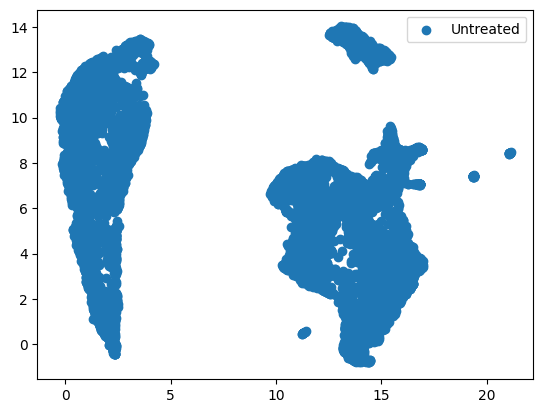

umap_data.shape: (13336, 2)


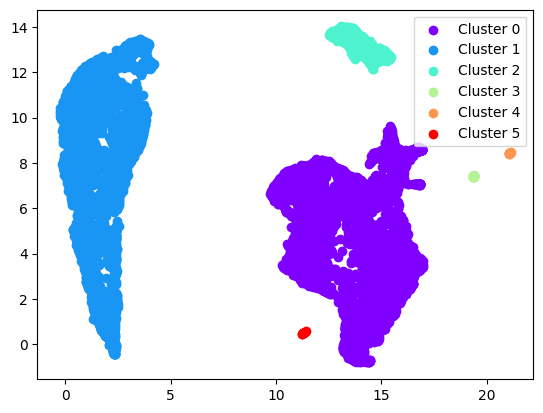

In [95]:
# Create umap and cluster with dbscan

umap_data = handle_umap(filtered_embeddings, filtered_labels.reshape(-1,))
print(f"umap_data.shape: {umap_data.shape}")
clusters = handle_dbscan(umap_data)

In [ ]:
# UTILS

def get_indexes_separated_by_clusters(clusters):
    indexes = []
    for c in np.unique(clusters):
        print(f"Cluster {c}", flush=True)
        ind = list(np.where(clusters == c)[0])
        indexes.append(ind)
    return indexes

def get_data_per_cluster(clusters, embeddings, labels, paths):
    print("Get indexes per cluster")
    indexes = get_indexes_separated_by_clusters(clusters)
    embeddings_per_cluster = [embeddings[ind] for ind in indexes]
    labels_per_cluster = [labels[ind] for ind in indexes]
    paths_per_cluster = [paths[ind] for ind in indexes]
    
    return embeddings_per_cluster, labels_per_cluster, paths_per_cluster

def get_tile_from_path(path):
    filepath, tile_number = path.rsplit('_',1)
    tile_number = int(tile_number)
    tile = np.load(filepath)[tile_number,...]
    return tile
    
    

In [ ]:
# Plot sample of outliers per cluster


# n_samples = 10
print("Get per cluster")
filtered_embeddings_per_cluster, filtered_labels_per_cluster, filtered_paths_per_cluster = get_data_per_cluster(clusters, filtered_embeddings, filtered_labels, filtered_paths)

for c, ps in enumerate(filtered_paths_per_cluster):
    print(f"Cluster {c} ({len(ps) * 100.0 / len(filtered_labels)}%)")
    if c not in [0,1,2]:
        continue
    
    n_samples = 10#len(ps)
    for s in range(n_samples):
        print(f"Sample {s}")
        p = ps[s,0]
        l = filtered_labels_per_cluster[c][s]
        tile = get_tile_from_path(p)
        fig, ax = plt.subplots(1,2, figsize=(3,3))
        ax[0].set_title(f"[Cluster {c}, Sample {s}] {l}")
        ax[0].imshow(tile[...,0], vmin=0, vmax=1, cmap='gray')
        ax[1].set_title(f"Nucleus")
        ax[1].imshow(tile[...,1], vmin=0, vmax=1, cmap='gray')
        plt.show()

Save paths by clusters

In [ ]:

save_folder = "/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/outliers_paths_from_umap_per_type"

print("Get per cluster")
filtered_embeddings_per_cluster, filtered_labels_per_cluster, filtered_paths_per_cluster = get_data_per_cluster(clusters, filtered_embeddings, filtered_labels, filtered_paths)

for c, ps in enumerate(filtered_paths_per_cluster):
    print(f"Cluster {c} ({round(len(ps) * 100.0 / len(filtered_labels), 3)}%) len: {len(ps)}")
    
    savepath = os.path.join(save_folder, f"cluster_{c}.npy")
    with open(savepath, 'wb') as f:
        np.save(f, ps)
        print(f"Saved to {savepath}")

Prevalance of labels per cluster

In [132]:

save_folder = "/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/outliers_paths_from_umap_per_type/counts"

print("Get per cluster")
filtered_embeddings_per_cluster, filtered_labels_per_cluster, filtered_paths_per_cluster = get_data_per_cluster(clusters, filtered_embeddings, filtered_labels, filtered_paths)

def percentage_to_file(labels_to_save, filename):
    for l in np.unique(labels_to_save):
        mask = np.where(labels_to_save == l)
        savepath = os.path.join(save_folder, filename)
        with open(savepath, 'a') as f:
            f.write(f"{l}: {round(len(l_c[mask]) * 100.0 / len(l_c), 3)}%\n")

for c, ps in enumerate(filtered_paths_per_cluster):
    # print(f"Cluster {c} ({round(len(ps) * 100.0 / len(filtered_labels), 3)}%) len: {len(ps)}")
    
    l_c = filtered_labels_per_cluster[c]
    percentage_to_file(l_c, f"cluster_{c}_labels_numbers.txt")
    
    l_c = filtered_labels_per_cluster[c]
    l_c = np.asarray([v.rsplit(os.sep,1)[-1] for v in l_c.reshape(-1,)])
    percentage_to_file(l_c, f"cluster_{c}_markers_numbers.txt")
    
    l_c = filtered_labels_per_cluster[c]
    l_c = np.asarray([os.path.join(v.split(os.sep)[0], v.split(os.sep)[-2]) for v in l_c.reshape(-1,)])
    percentage_to_file(l_c, f"cluster_{c}_batch_rep_numbers.txt")
    
    l_c = filtered_labels_per_cluster[c]
    l_c = np.asarray([v.split(os.sep)[1] for v in l_c.reshape(-1,)])
    percentage_to_file(l_c, f"cluster_{c}_line_numbers.txt")
    

Get per cluster
Get indexes per cluster
Cluster 0
Cluster 1
Cluster 2
Cluster 3
Cluster 4
Cluster 5


How many outliers (per type) exists within each batch+rep?

In [136]:

save_folder = "/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/outliers_paths_from_umap_per_type/counts"

print("Get per cluster")
filtered_embeddings_per_cluster, filtered_labels_per_cluster, filtered_paths_per_cluster = get_data_per_cluster(clusters, filtered_embeddings, filtered_labels, filtered_paths)

def percentage_from_entire_batch_to_file(labels_to_save, filename):
    batches = [3,4,5,6,9]
    batches_entire_counts = {}
    for b in batches:
        _, labs, _ = get_batch(b)
        batches_entire_counts[f"batch{b}_16bit_no_downsample"] = len(labs)
    
    for l in np.unique(labels_to_save):
        mask = np.where(labels_to_save == l)
        savepath = os.path.join(save_folder, filename)
        with open(savepath, 'a') as f:
            f.write(f"{l}: {round(len(l_c[mask]) * 100.0 / batches_entire_counts[l.split(os.sep,1)[0]], 3)}%\n")

for c, ps in enumerate(filtered_paths_per_cluster):
    # print(f"Cluster {c} ({round(len(ps) * 100.0 / len(filtered_labels), 3)}%) len: {len(ps)}")
    
    l_c = filtered_labels_per_cluster[c]
    l_c = np.asarray([os.path.join(v.split(os.sep)[0], v.split(os.sep)[-2]) for v in l_c.reshape(-1,)])
    percentage_from_entire_batch_to_file(l_c, f"cluster_{c}_batch_rep_from_entire_batch_percent.txt")
    

Get per cluster
Get indexes per cluster
Cluster 0
Cluster 1
Cluster 2
Cluster 3
Cluster 4
Cluster 5
1100 236611
1613 236611
105 323990
347 323990
187 357871
232 357871
1098 458756
945 458756
201 459646
372 459646
26 236611
1425 323990
1791 323990
1856 357871
296 357871
133 458756
18 458756
307 459646
230 459646
8 236611
742 323990
207 323990
4 357871
1 458756
1 459646
26 236611
6 459646
34 323990
24 458756


Save outliers per cluster to pdf files

In [ ]:
import matplotlib.backends.backend_pdf as bpdf


pdf_output_folder = "/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/outliers_detection/outliers_paths_from_umap/4Lena_per_type"

print("Get per cluster")
filtered_embeddings_per_cluster, filtered_labels_per_cluster, filtered_paths_per_cluster = get_data_per_cluster(clusters, filtered_embeddings, filtered_labels, filtered_paths)

plt.ioff()
for c, ps in enumerate(filtered_paths_per_cluster):
    print(f"Cluster {c} ({round(len(ps) * 100.0 / len(filtered_labels), 3)}%) (len: {len(ps)})")
    
    file_name = f"outlier_tiles_4Lena_cluster_{c}.pdf"
    pdf_file = os.path.join(pdf_output_folder, file_name)
    pdf_pages = bpdf.PdfPages(pdf_file)
    print(f"\ncreate a pdf file: {pdf_file}")
    
    n_samples = len(ps)
    for s in range(n_samples):
        print(f"Sample {s}/{n_samples} ({round(s*100.0/n_samples,3)}%)")
        p = ps[s,0]
        l = filtered_labels_per_cluster[c][s]
        tile = get_tile_from_path(p)
        
        fig, ax = plt.subplots(1,2, figsize=(3,3))
        
        fig.suptitle('Target | Nucleus')
        
        ax[0].text(-10,-20,os.sep.join(p.split(os.sep)[-5:-1]),fontsize=4,color="red")
        ax[0].text(-10,-10,p.rsplit(os.sep,1)[-1:][0],fontsize=4,color="red")
        ax[0].imshow(tile[...,0], vmin=0, vmax=1, cmap='gray')
        ax[0].axis('off')
        
        ax[1].imshow(tile[...,1], vmin=0, vmax=1, cmap='gray')
        ax[1].axis('off')
        pdf_pages.savefig()
        
    pdf_pages.close()

plt.ion()
